In [1]:
import sys
!{sys.executable} -m pip -q install palantir fa2

In [2]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
sc.settings.logfile = sys.stdout
## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline

sc.set_figure_params()
scf.set_figure_pubready()

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


In [345]:
mg = sc.read_h5ad(r"/mnt/c/Users/Emil/10X/Levi_Jon/combined.h5ad")

In [346]:
mgtotal = sc.read_h5ad(r"/mnt/c/Users/Emil/10X/Levi_Jon/combined.h5ad")

In [347]:
import pandas as pd
mg.obs['seurat_clusters'] = mg.obs['seurat_clusters'].astype(str)
old_to_new = {
'0':'Transitory',
'1':'Transitory',
'2':'Transitory',
'3':'Transitory',
'4':'Partially muller glia',
'5':'Microglia',
'6':'RGC',
'7':'Cones',
'8':'Mature muller glia',
'9':'Transitory',
'10':'Transitory'}
mg.obs['EK_anno'] = (
mg.obs['seurat_clusters']
.map(old_to_new).astype('category')
)

In [348]:
mgtotal.obs['seurat_clusters'] = mgtotal.obs['seurat_clusters'].astype(str)
old_to_new = {
'0':'Transitory',
'1':'Transitory',
'2':'Transitory',
'3':'Transitory',
'4':'Partially muller glia',
'5':'Microglia',
'6':'RGC',
'7':'Cones',
'8':'Mature muller glia',
'9':'Transitory',
'10':'Early neurons'}
mgtotal.obs['EK_anno'] = (
mgtotal.obs['seurat_clusters']
.map(old_to_new).astype('category')
)

In [349]:
mg.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.rb,S.Score,G2M.Score,Phase,percent.mt,RNA_snn_res.0.5,seurat_clusters,pANN_0.25_0.04_241,DF.classifications_0.25_0.04_241,DF.classifications_0.25_0.04_191,pANN_0.25_0.06_182,DF.classifications_0.25_0.06_182,DF.classifications_0.25_0.06_153,integrated_snn_res.0.5,EK_anno
AAACCCAGTAGCTGCC-1_1,late,1557.0,1027,11.368015,-0.027778,-0.033397,G1,4.945408,0,0,0.015504,Singlet,Singlet,NaN,NA,NA,0,Transitory
AAACCCAGTGTTGAGG-1_1,late,1139.0,763,1.053556,-0.000618,-0.010960,G1,10.711150,3,3,0.031008,Singlet,Singlet,NaN,NA,NA,3,Transitory
AAACGAAAGCAACTCT-1_1,late,2946.0,1756,7.399864,0.004769,-0.065160,S,4.073320,1,2,0.217054,Singlet,Singlet,NaN,NA,NA,2,Transitory
AAACGAACACATGTTG-1_1,late,931.0,621,1.611171,0.040806,-0.015264,S,3.866810,3,3,0.007752,Singlet,Singlet,NaN,NA,NA,3,Transitory
AAACGCTAGCTCTGTA-1_1,late,3233.0,1823,8.660687,-0.001237,0.142516,G2M,3.154964,1,1,0.155039,Singlet,Singlet,NaN,NA,NA,1,Transitory
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGGTCCTCAGG-1_2,early,3166.0,1687,11.939356,-0.060528,0.077702,G2M,7.548958,2,4,NaN,NA,NA,0.006897,Singlet,Singlet,4,Partially muller glia
TTTGGTTTCTCTCCGA-1_2,early,4794.0,2441,9.198999,-0.013216,-0.055211,G1,6.633292,0,2,NaN,NA,NA,0.124138,Singlet,Singlet,2,Transitory
TTTGTTGAGGTCGACA-1_2,early,5595.0,2637,10.241287,-0.056890,-0.102094,G1,8.918677,8,9,NaN,NA,NA,0.213793,Singlet,Singlet,9,Transitory
TTTGTTGCAGTGCGCT-1_2,early,3848.0,1914,12.733888,0.054813,0.040794,S,8.030146,2,4,NaN,NA,NA,0.034483,Singlet,Singlet,4,Partially muller glia


In [350]:
mg = mg[mg.obs['EK_anno'].isin(['Transitory','Partially muller glia','RGC','Cones','Mature muller glia','Early neurons'])]

In [351]:
mgtotal = mgtotal[mgtotal.obs['EK_anno'].isin(['Transitory','Partially muller glia','RGC','Cones','Mature muller glia','Early neurons'])]

In [334]:
sc.pp.filter_genes(mg,min_counts=3)


filtered out 1189 genes that are detected in less than 3 counts


In [352]:
sc.pp.pca(mg)
pca_projections = pd.DataFrame(mg.obsm["X_pca"],index=mg.obs_names)

computing PCA
    with n_comps=50
    finished (0:00:02)


In [353]:
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)

Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [354]:
# generate neighbor draph in multiscale diffusion space
mg.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(mg,n_neighbors=30,use_rep="X_palantir")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [355]:
# draw ForceAtlas2 embedding using 3 first PCs as initial positions
mg.obsm["X_pca2d"]=mg.obsm["X_pca"][:,:3]
sc.tl.draw_graph(mg, layout = 'fa',init_pos='X_pca2d')

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:14)


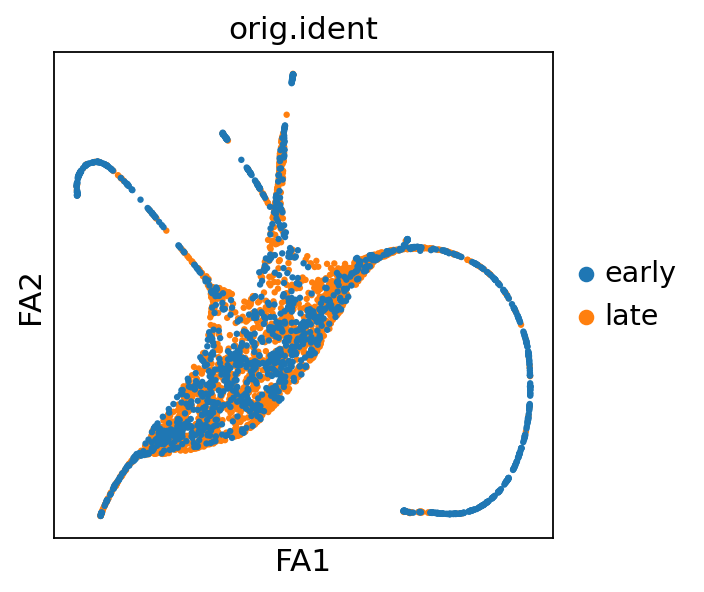

In [356]:
sc.pl.draw_graph(mg,color=['orig.ident'], layout = 'fa') #WE USE THAT

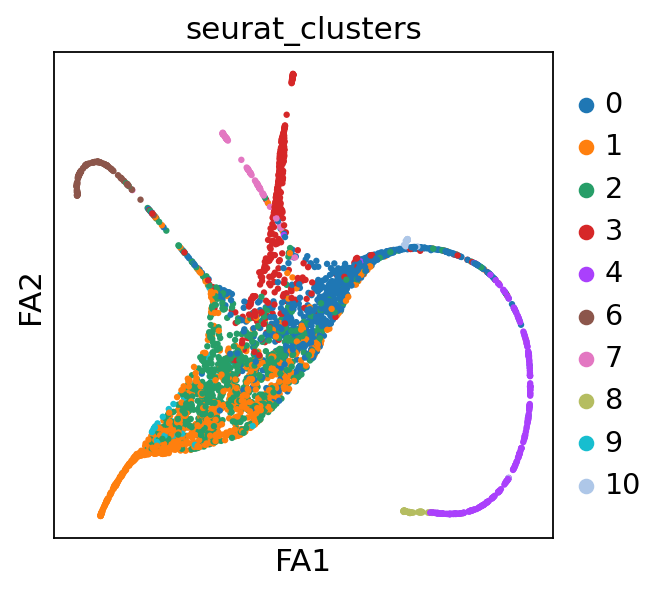

In [357]:
sc.pl.draw_graph(mg,color=['seurat_clusters'], layout = 'fa') #WE USE THAT

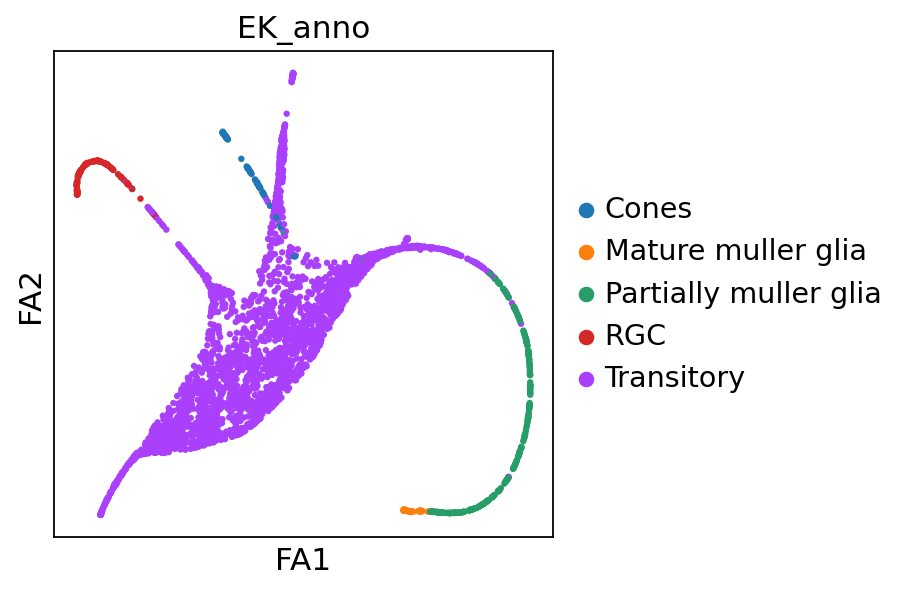

In [358]:
sc.pl.draw_graph(mg,color=['EK_anno'], layout = 'fa') #WE USE THAT

In [359]:
def cluster_small_multiples(
    adata, clust_key, size=60, frameon=False, legend_loc=None, **kwargs
):
    tmp = adata.copy()

    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#d3d3d3", adata.uns[clust_key + "_colors"][i]]

    sc.pl.draw_graph(
        tmp,
        groups=tmp.obs[clust].cat.categories[1:].values,
        color=adata.obs[clust_key].cat.categories.tolist(),
        size=size,
        frameon=frameon,
        legend_loc=legend_loc,
        **kwargs,
    )

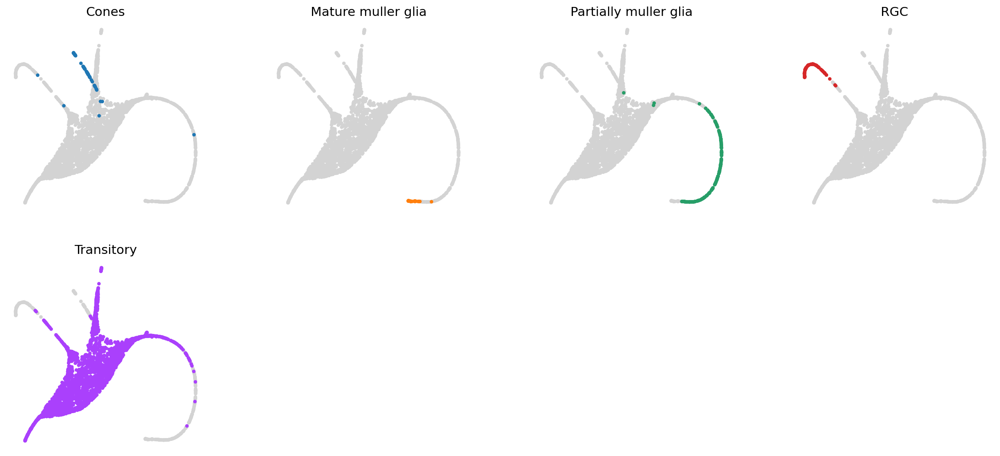

In [360]:
cluster_small_multiples(mg, clust_key = 'EK_anno', layout = 'fa')

In [678]:
sc.pp.filter_genes(mgtotal,min_counts=3)
sc.pp.highly_variable_genes(mgtotal, n_top_genes=1500, flavor='cell_ranger')

filtered out 1189 genes that are detected in less than 3 counts
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
`n_top_genes` > `adata.n_var`, returning all genes.
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [679]:
mgtotal.var

,features,n_counts,highly_variable,means,dispersions,dispersions_norm
Opn1sw,Opn1sw,47.56,True,1.32e-02,72.69,-1.60
Rlbp1,Rlbp1,26.65,True,7.37e-03,142.20,-0.91
Clu,Clu,92.73,True,2.56e-02,40.34,-1.01
Rho,Rho,7.94,True,2.19e-03,452.98,0.20
Gng13,Gng13,40.66,True,1.12e-02,93.31,0.08
...,...,...,...,...,...,...
Ica1,Ica1,45.72,True,1.26e-02,82.99,-0.31
Smc6,Smc6,53.28,True,1.47e-02,68.66,0.58
Impg2,Impg2,12.78,True,3.54e-03,297.64,-0.65
Sh3gl3,Sh3gl3,49.42,True,1.37e-02,76.36,-0.04


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:15)


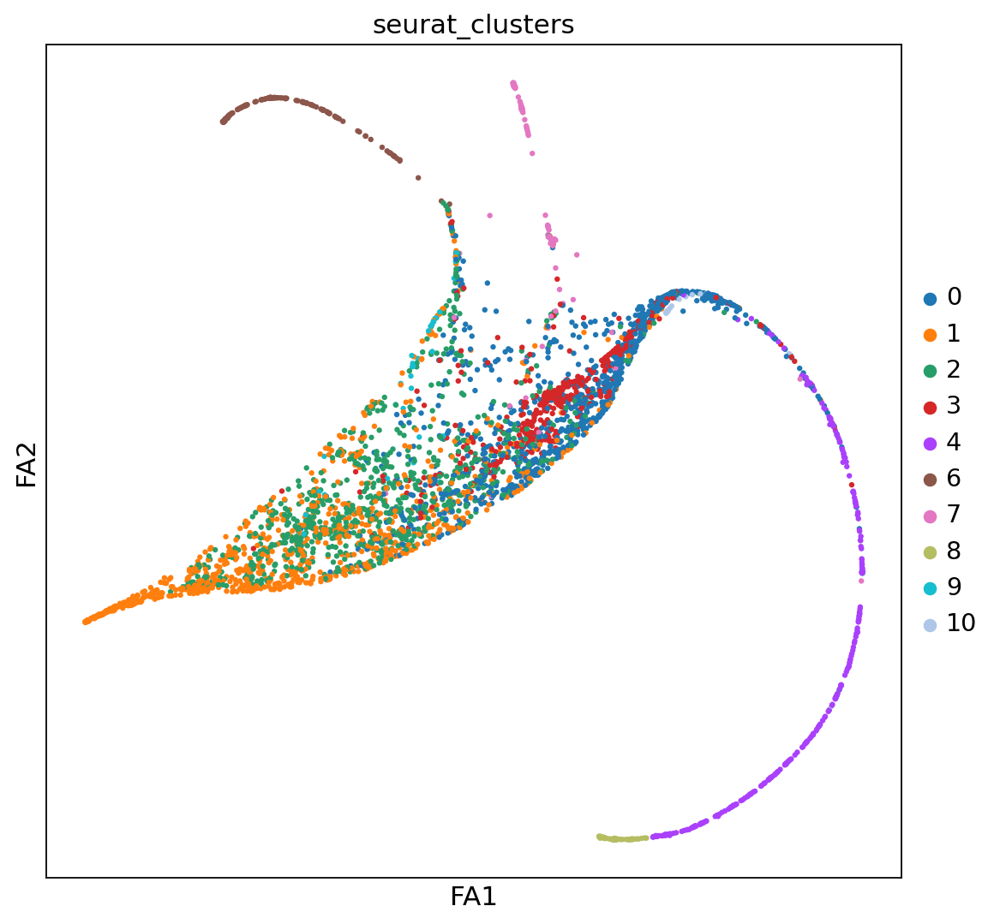

In [680]:
sc.pp.pca(mgtotal)
pca_projections = pd.DataFrame(mgtotal.obsm["X_pca"],index=mgtotal.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
mgtotal.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(mgtotal,n_neighbors=30,use_rep="X_palantir")
mgtotal.obsm["X_pca2d"]=mgtotal.obsm["X_pca"][:,:3]
sc.tl.draw_graph(mgtotal, layout = 'fa',init_pos='X_pca2d')
sc.pl.draw_graph(mgtotal,color=['seurat_clusters'], layout = 'fa') #WE USE THAT

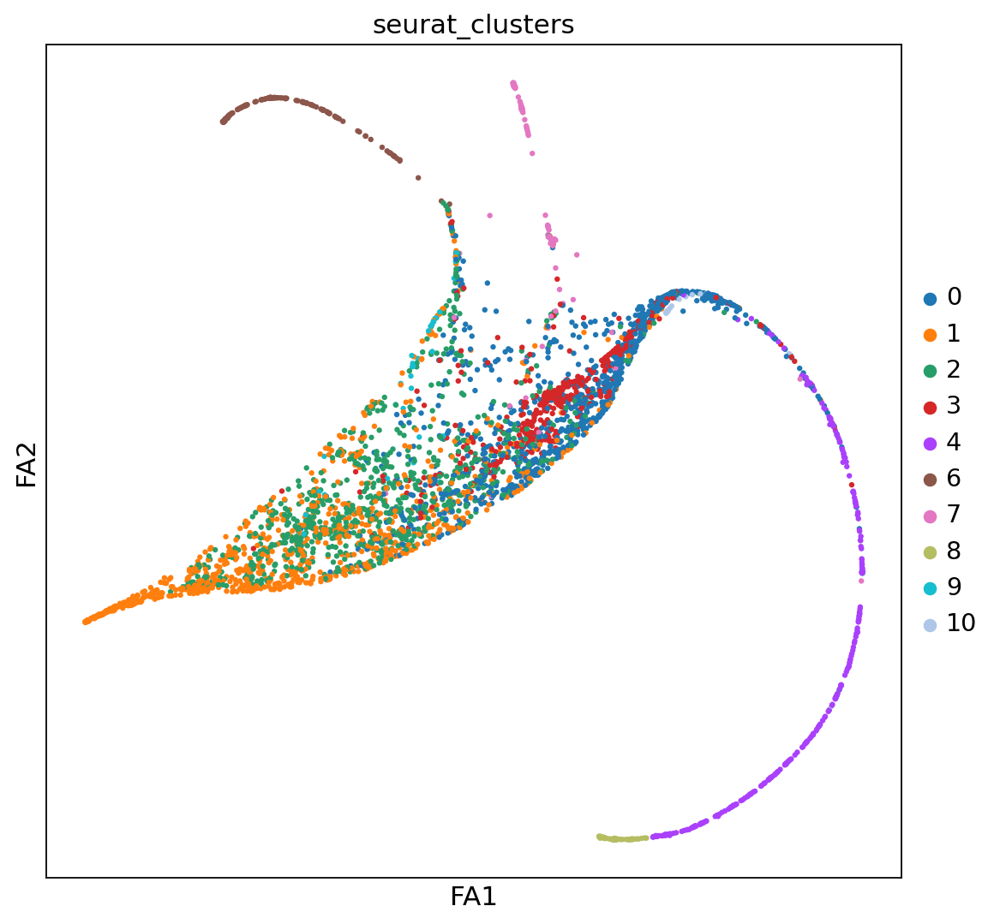

In [681]:
sc.pl.draw_graph(mgtotal,color=['seurat_clusters'], layout = 'fa') #WE USE THAT

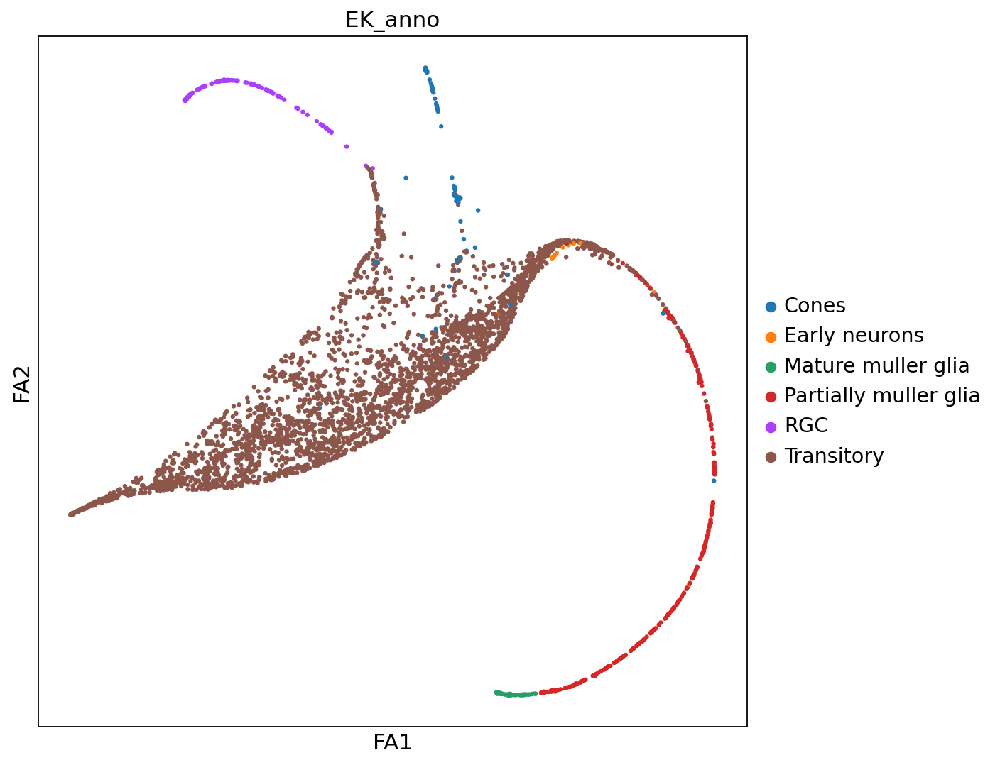

In [682]:
sc.pl.draw_graph(mgtotal,color=['EK_anno'], layout = 'fa') #WE USE THAT

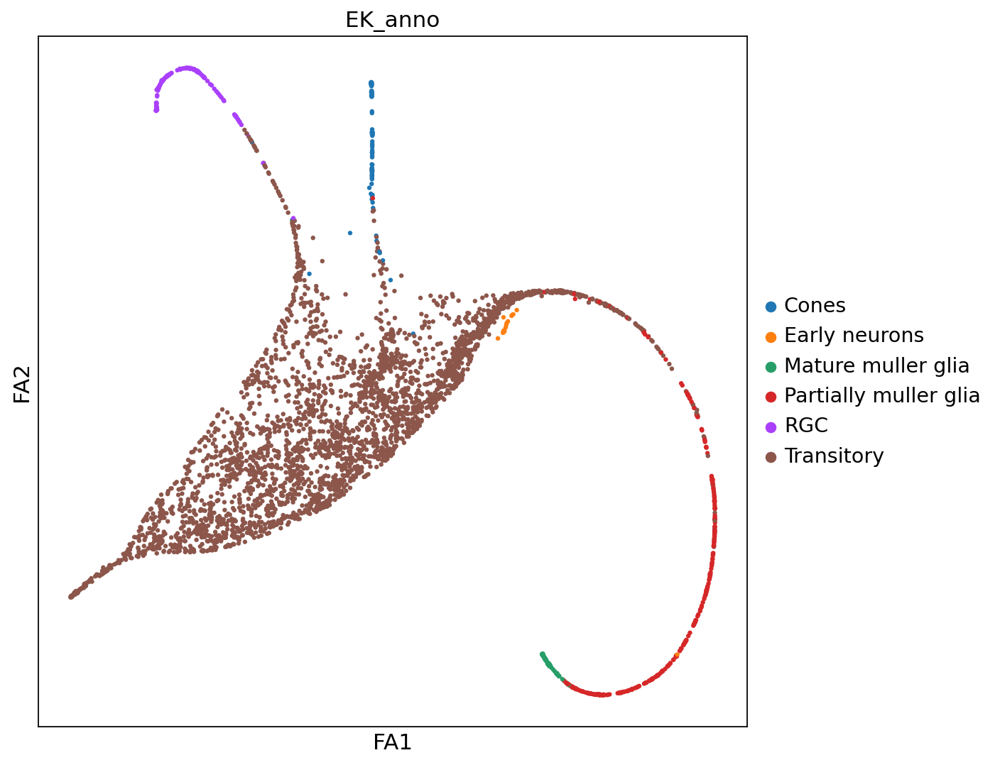

In [345]:
sc.pl.draw_graph(mgtotal,color=['EK_anno'], layout = 'fa', save = 'ascl1_total_fa.pdf') #WE USE THAT

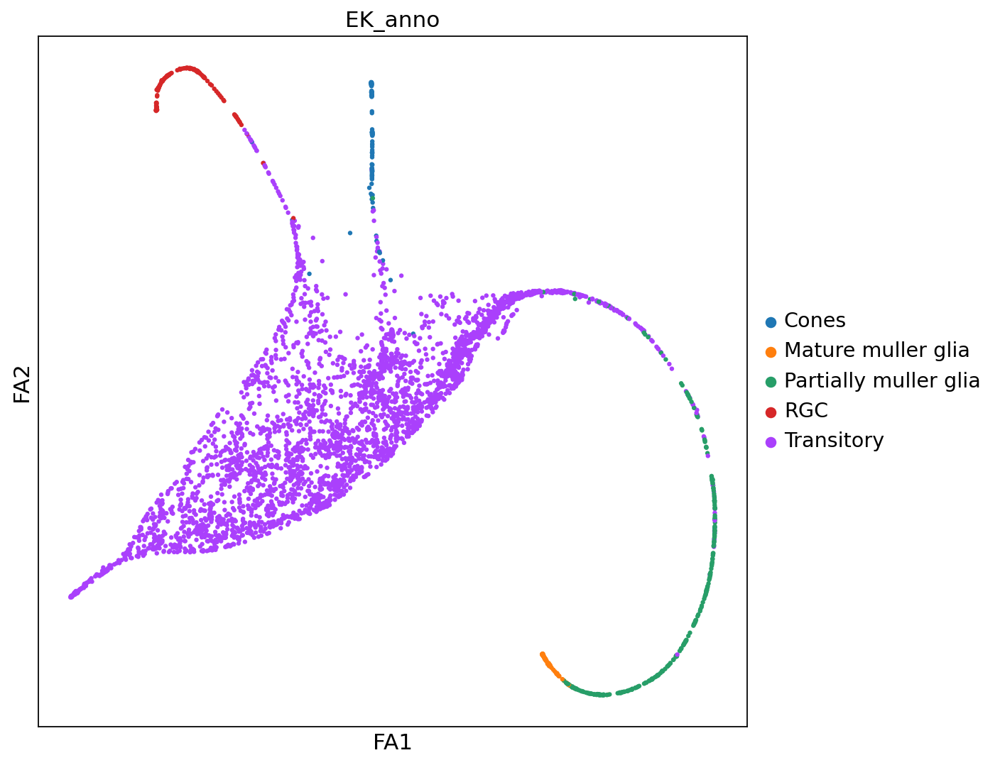

In [613]:
sc.pl.draw_graph(mg,color=['EK_anno'], layout = 'fa', save = 'umap_total.pdf')

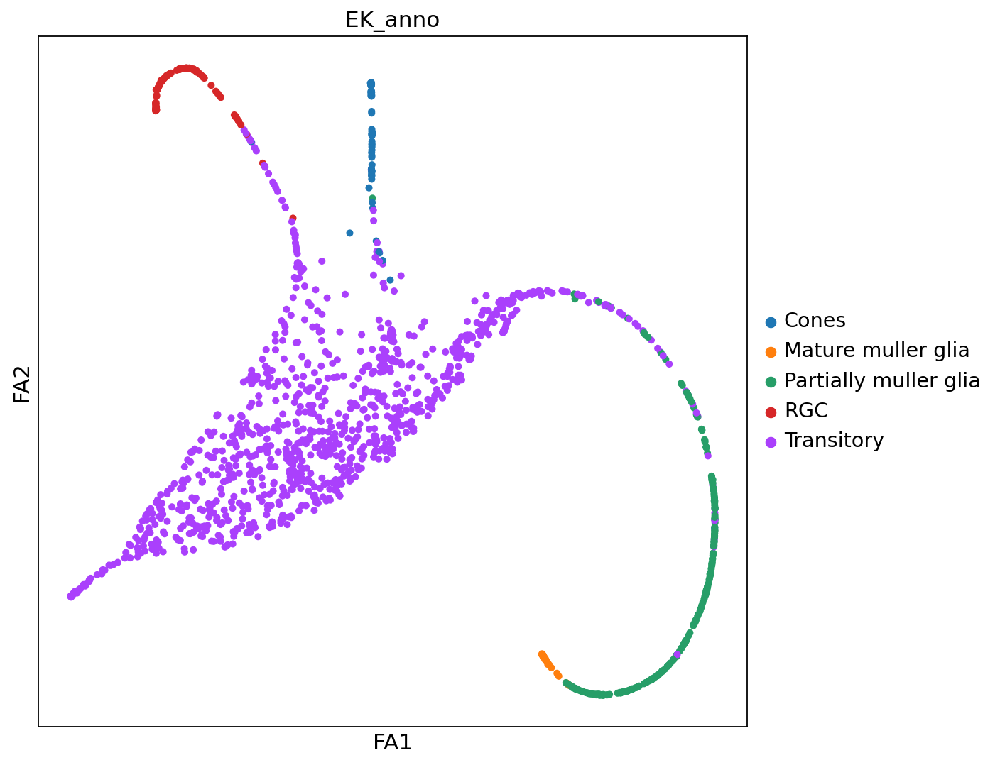

In [614]:
sc.pl.draw_graph(early,color=['EK_anno'], layout = 'fa', save = 'early_umap_total.pdf')

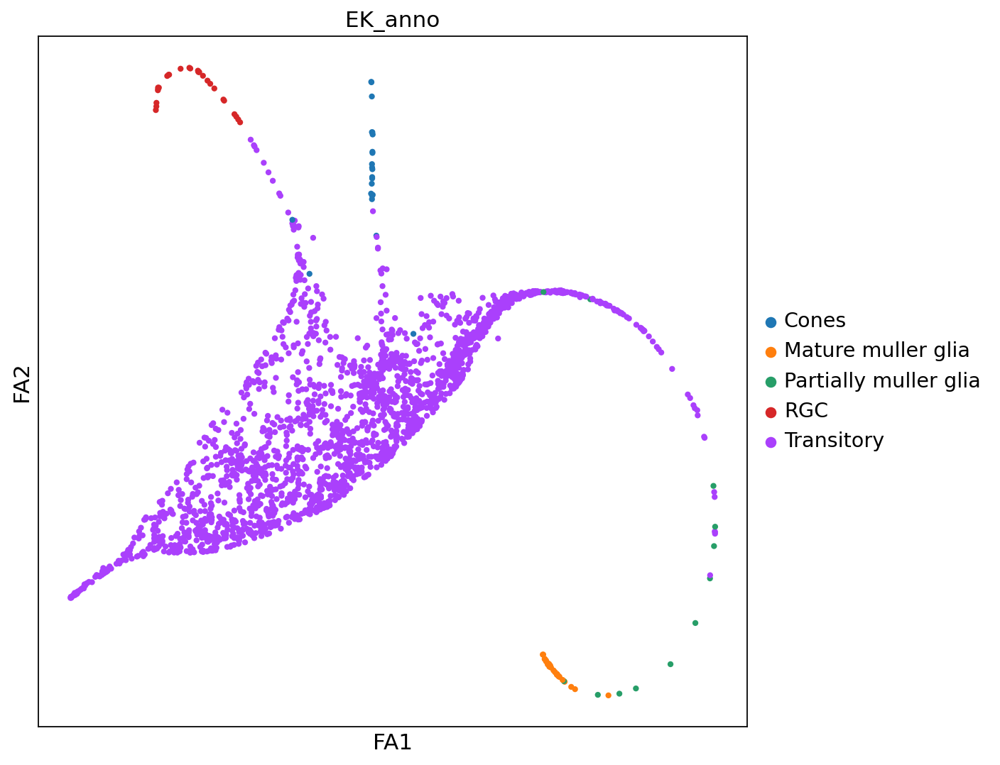

In [615]:
sc.pl.draw_graph(late,color=['EK_anno'], layout = 'fa', save = 'late_umap_total.pdf')

In [347]:
mg.obsm['X_draw_graph_fa'] = mgtotal.obsm['X_draw_graph_fa']

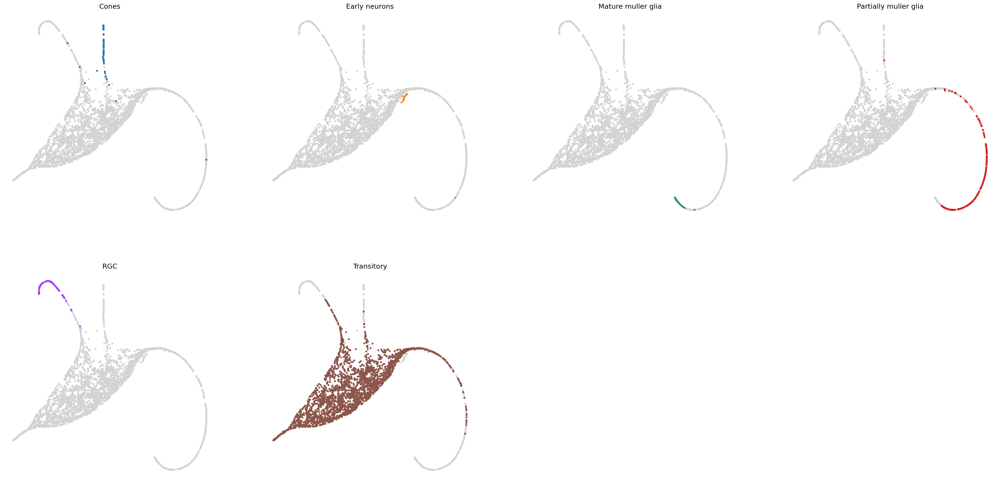

In [348]:
cluster_small_multiples(mgtotal, clust_key = 'EK_anno', layout = 'fa')

In [362]:
mg.layers['scaled'] = sc.pp.scale(mg, copy=True).X

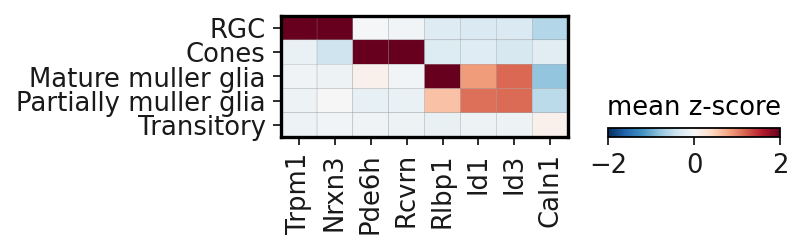

In [363]:
sc.pl.matrixplot(mg, ['Trpm1','Nrxn3','Pde6h','Rcvrn','Rlbp1','Id1','Id3','Caln1'], 'EK_anno',
                 colorbar_title='mean z-score',  vmin=-2, vmax=2, cmap='RdBu_r', layer = 'scaled', categories_order = ['RGC','Cones','Mature muller glia','Partially muller glia',
                                                                                                                   'Transitory'], figsize = [4,1], save = 'heatmap_levi1.pdf')

In [124]:
import scvelo as scv

In [125]:
I = scv.read("/mnt/c/Users/Emil/10X/Levi_Jon/early.loom", cache = True)
UI = scv.read("/mnt/c/Users/Emil/10X/Levi_Jon/late.loom", cache = True)

... reading from cache file cache/mnt-c-Users-Emil-10X-Levi_Jon-early.h5ad
... reading from cache file cache/mnt-c-Users-Emil-10X-Levi_Jon-late.h5ad


In [126]:
early = mg[mg.obs['orig.ident'].isin(['early'])]

In [127]:
late = mg[mg.obs['orig.ident'].isin(['late'])]

In [128]:
early_velo = scv.utils.merge(early, I)

In [129]:
late_velo = scv.utils.merge(late, UI)

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


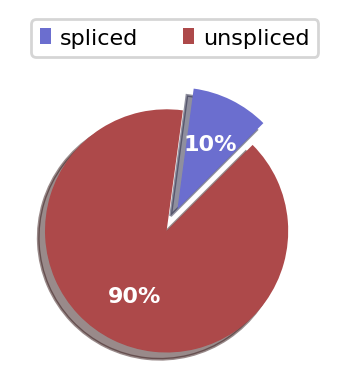

In [130]:
scv.pl.proportions(early_velo)

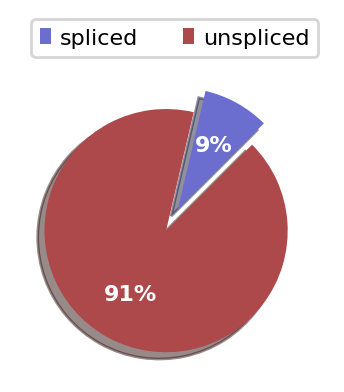

In [131]:
scv.pl.proportions(late_velo)

In [132]:
scv.pp.neighbors(late_velo)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [133]:
scv.pp.neighbors(early_velo)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [134]:
scv.pp.filter_and_normalize(late_velo, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(late_velo, n_pcs=30, n_neighbors=30)

Filtered out 760 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [135]:
scv.pp.filter_and_normalize(early_velo, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(early_velo, n_pcs=30, n_neighbors=30)

Filtered out 749 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [136]:

scv.tl.velocity(late_velo)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [137]:
scv.tl.velocity(early_velo)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [138]:
scv.tl.velocity_graph(early_velo)


computing velocity graph (using 1/12 cores)


  0%|          | 0/1475 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [139]:
scv.tl.velocity_graph(late_velo)

computing velocity graph (using 1/12 cores)


  0%|          | 0/2141 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


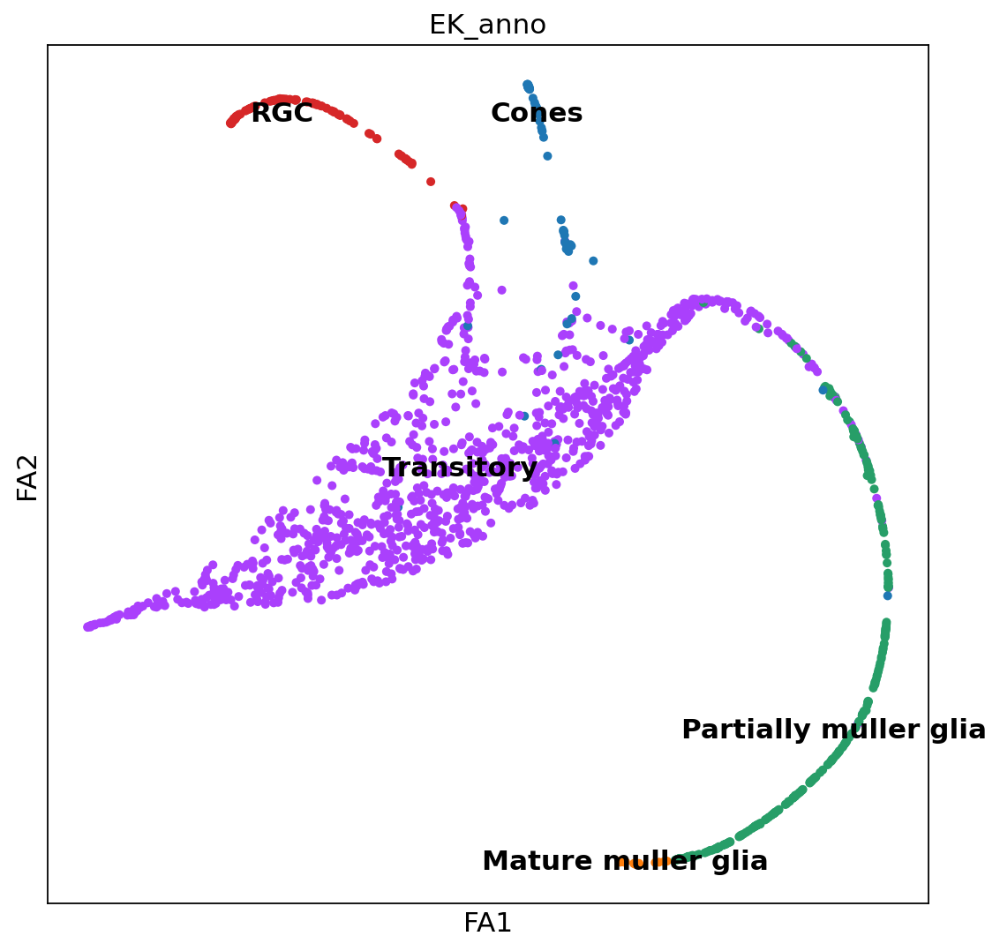

In [140]:
sc.set_figure_params(figsize = [8,8])
sc.pl.draw_graph(early_velo,color=['EK_anno'], layout = 'fa', legend_loc = 'on data',use_raw=False)

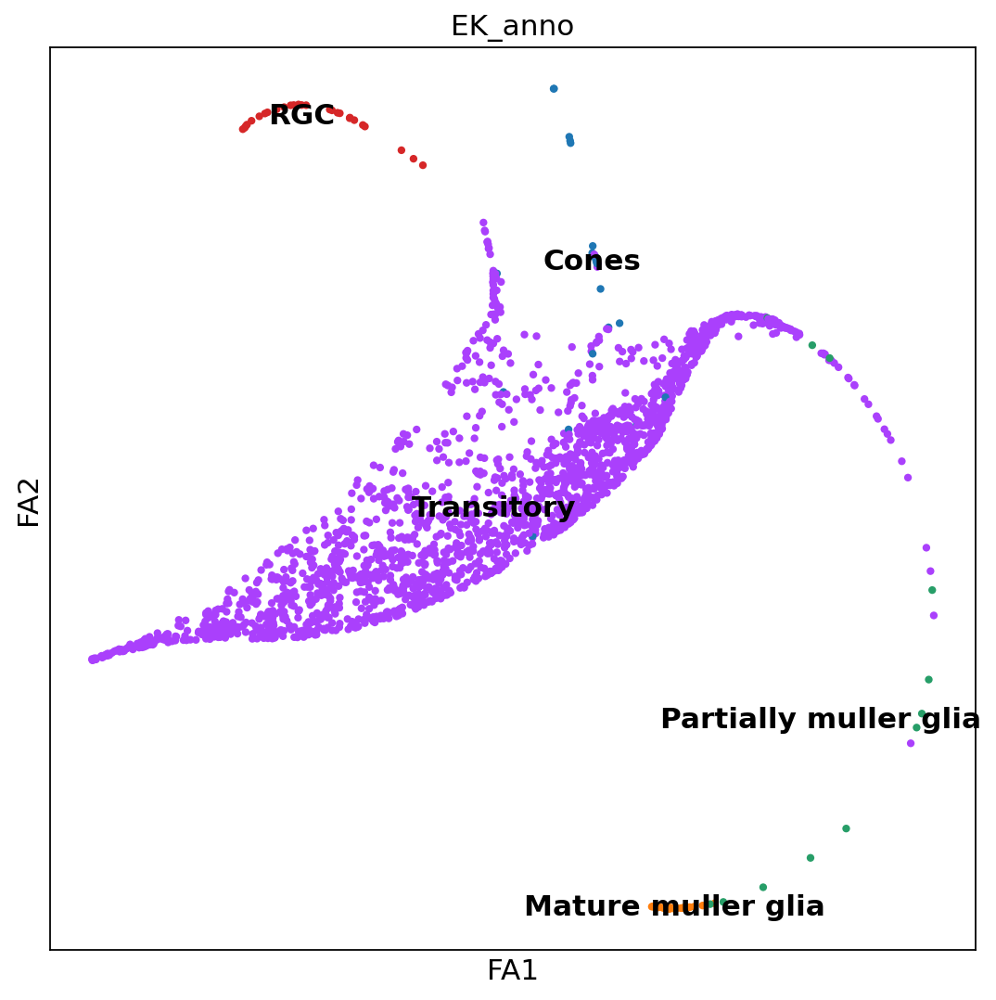

In [141]:
sc.set_figure_params(figsize = [8,8])
sc.pl.draw_graph(late_velo,color=['EK_anno'], layout = 'fa', legend_loc = 'on data',use_raw=False)

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


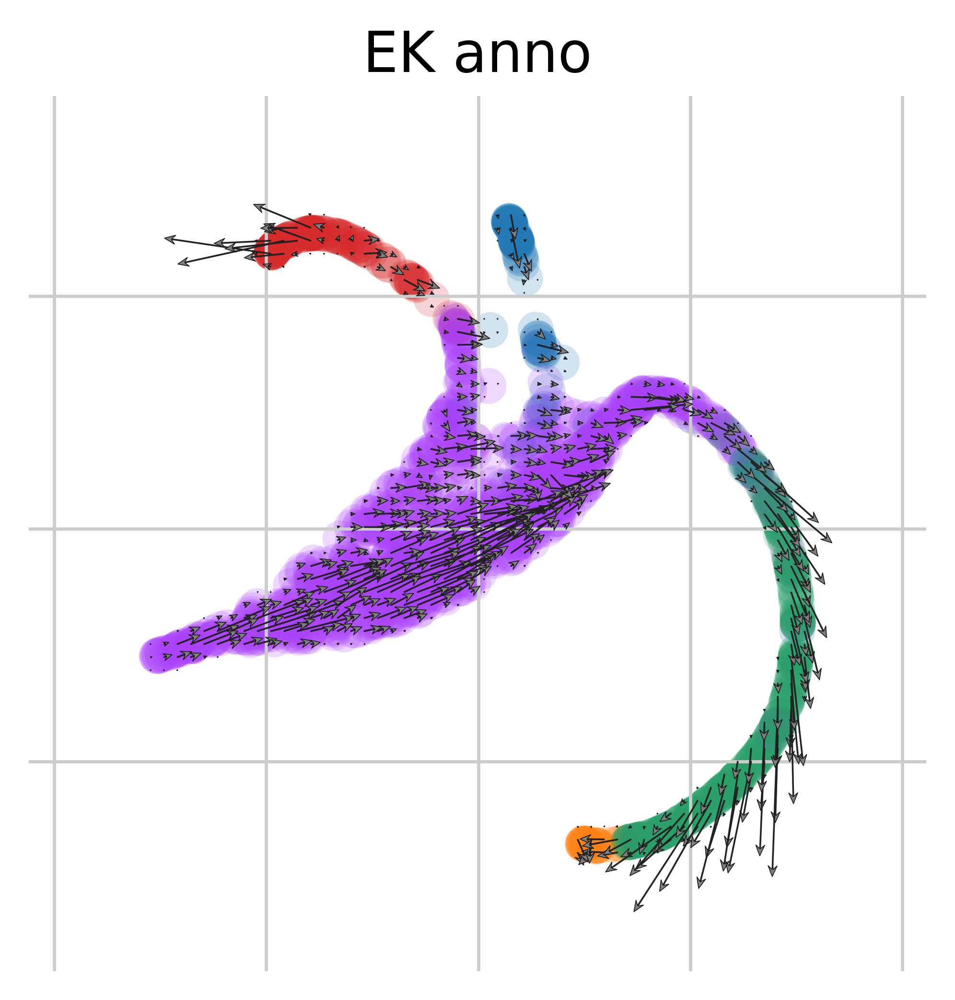

In [142]:
scv.pl.velocity_embedding_grid(early_velo, basis='draw_graph_fa', color = 'EK_anno', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 8, arrow_size = 2, density = 1)

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


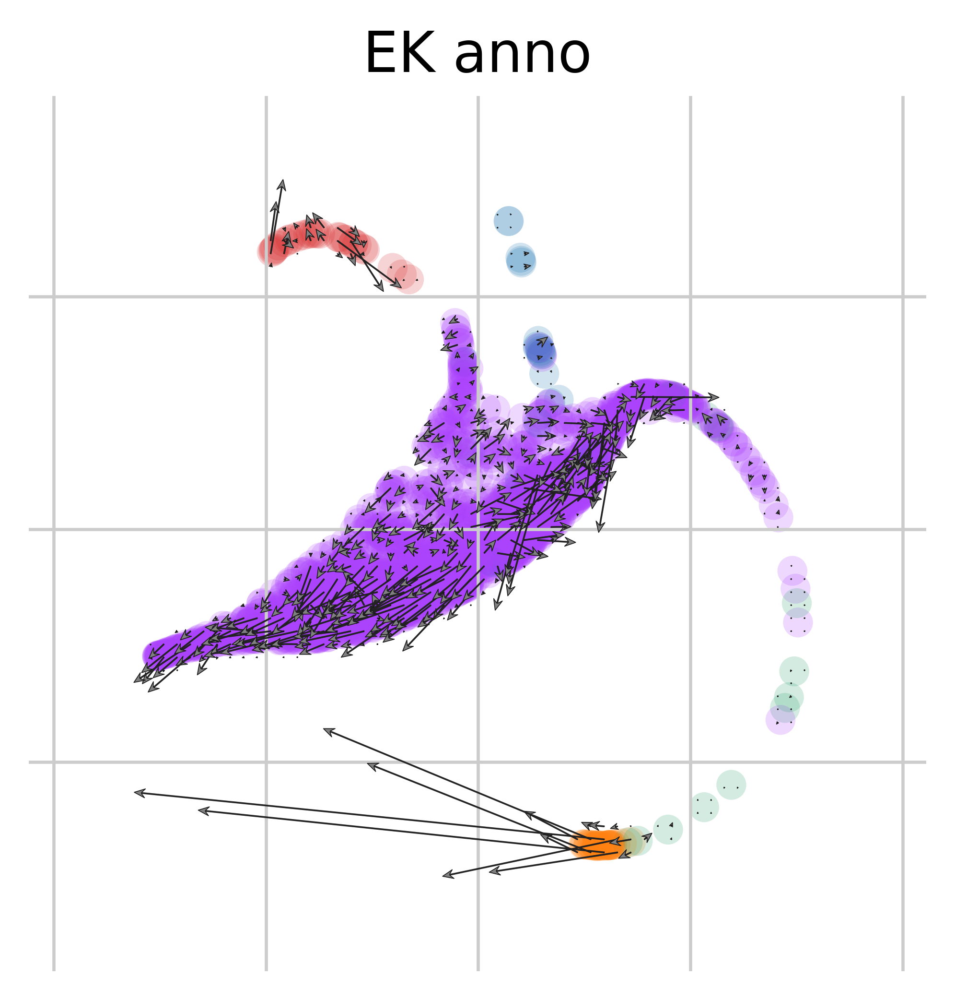

In [143]:
scv.pl.velocity_embedding_grid(late_velo, basis='draw_graph_fa', color = 'EK_anno', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 8, arrow_size = 2, density = 1)

saving figure to file ./figures/scvelo_velo_early_new.svg


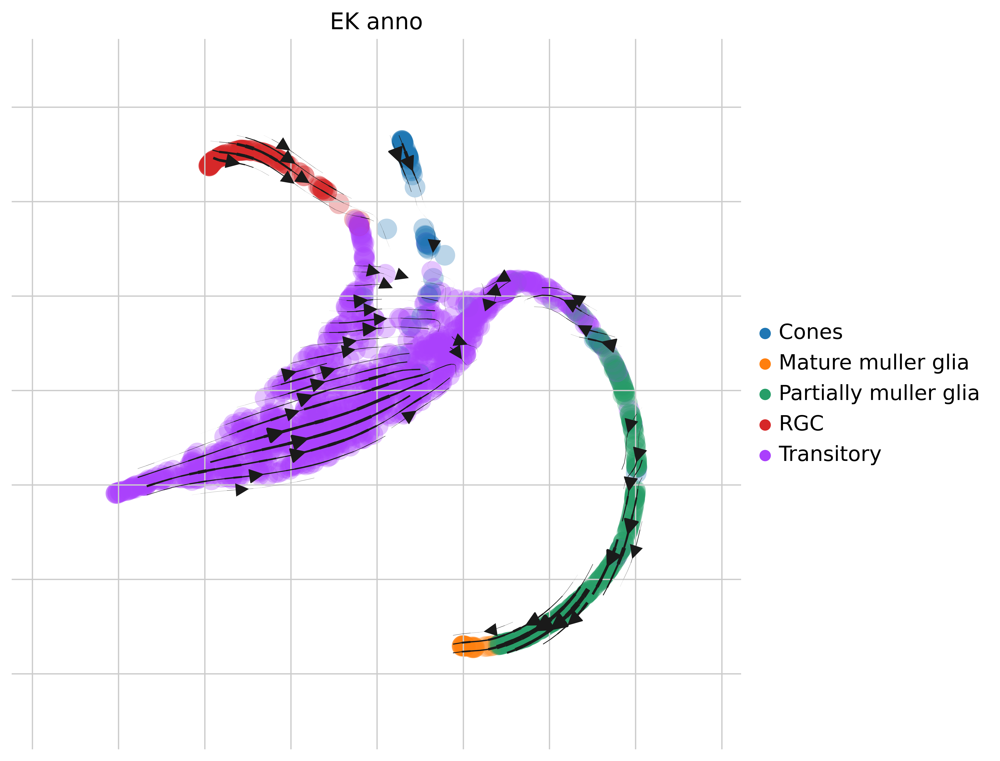

In [157]:
scv.pl.velocity_embedding_stream(early_velo, basis='draw_graph_fa', color = 'EK_anno', dpi = 300, density = 2, add_margin=0.2, arrow_size = 2, legend_loc = 'right margin', linewidth = 2, max_length = 8, save = 'velo_early_new.svg')

saving figure to file ./figures/scvelo_velo_late_new.svg


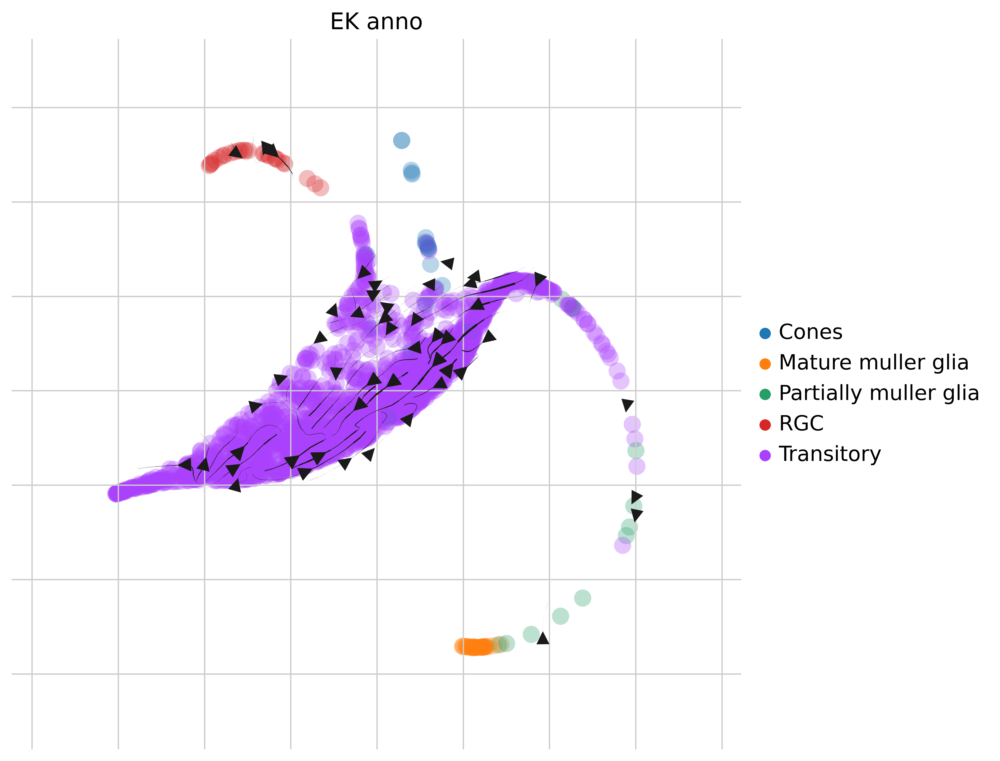

In [158]:
scv.pl.velocity_embedding_stream(late_velo, basis='draw_graph_fa', color = 'EK_anno', dpi = 300, density = 2, add_margin=0.2, arrow_size = 2, legend_loc = 'right margin', linewidth = 2, max_length = 8, save = 'velo_late_new.svg')

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


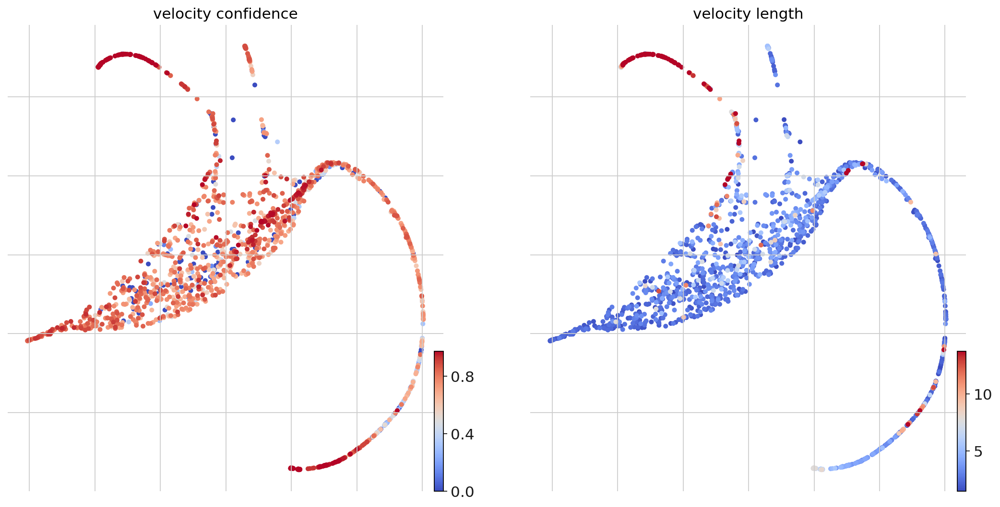

In [146]:
scv.tl.velocity_confidence(early_velo)
keys =  'velocity_confidence','velocity_length'
scv.pl.scatter(early_velo, c=keys, cmap='coolwarm', perc=[5, 95], basis='draw_graph_fa' )

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


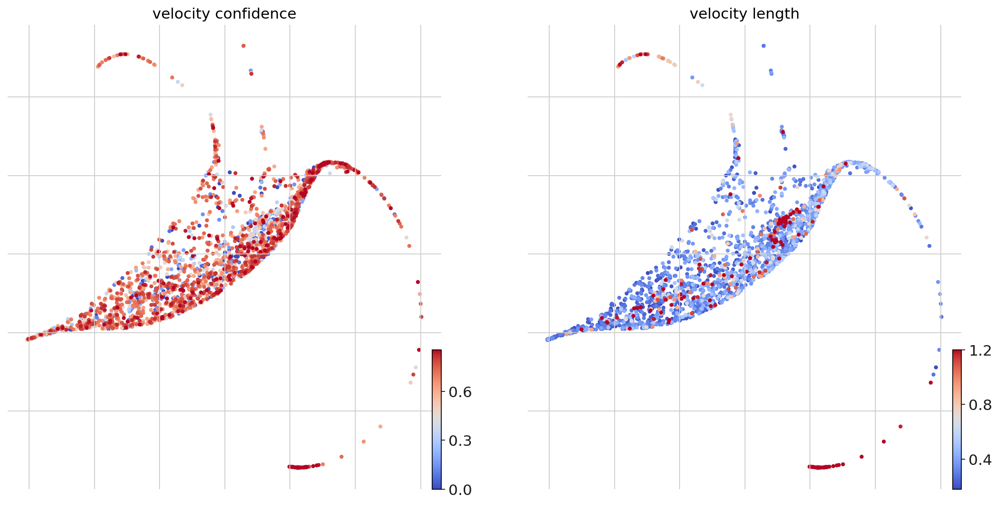

In [147]:
scv.tl.velocity_confidence(late_velo)
keys =  'velocity_confidence','velocity_length'
scv.pl.scatter(late_velo, c=keys, cmap='coolwarm', perc=[5, 95], basis='draw_graph_fa' )

computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


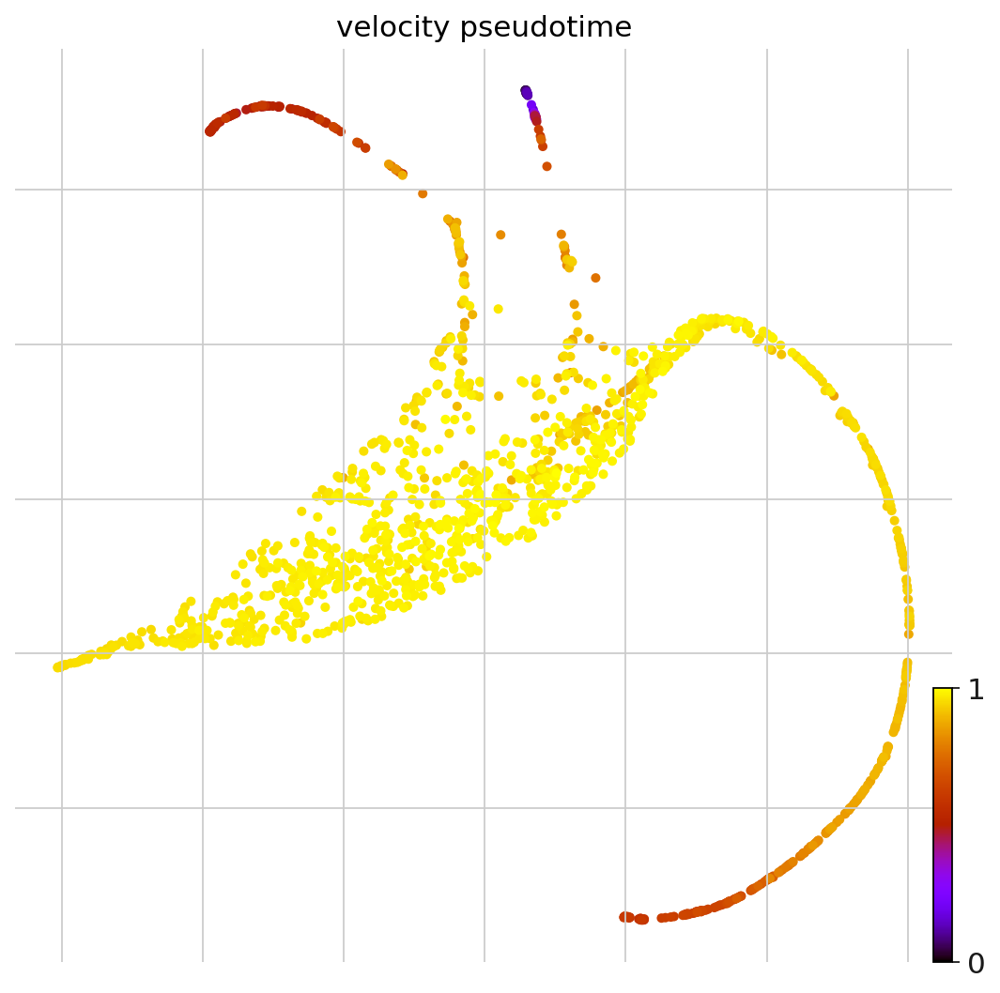

In [148]:
scv.tl.velocity_pseudotime(early_velo)
scv.pl.scatter(early_velo, color='velocity_pseudotime', cmap='gnuplot', basis='draw_graph_fa')

computing terminal states
    identified 5 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


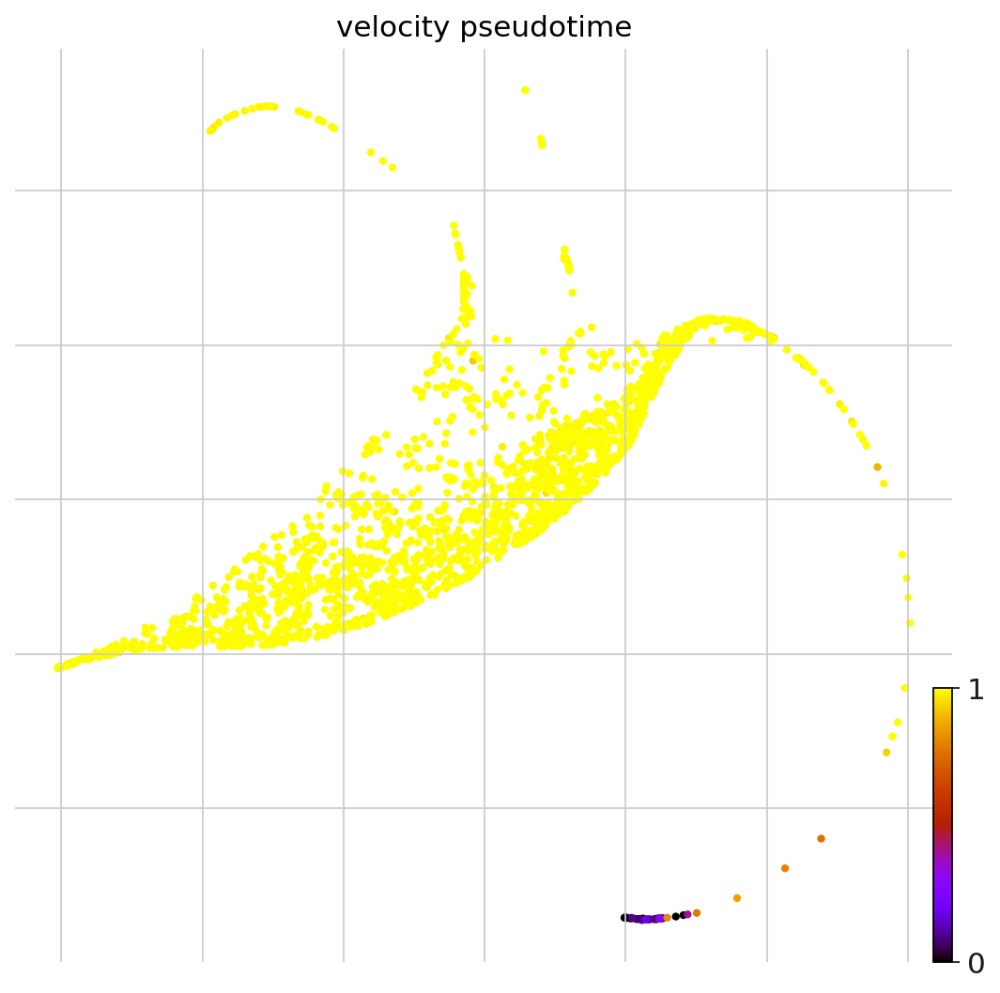

In [149]:
scv.tl.velocity_pseudotime(late_velo)
scv.pl.scatter(late_velo, color='velocity_pseudotime', cmap='gnuplot', basis='draw_graph_fa')

In [150]:
scv.tl.recover_dynamics(early_velo)

recovering dynamics (using 1/12 cores)


  0%|          | 0/15 [00:00<?, ?gene/s]

    finished (0:00:03) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [151]:
scv.tl.recover_dynamics(late_velo)

recovering dynamics (using 1/12 cores)
    finished (0:00:00) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)

outputs model fit of gene: Ptprz1


In [152]:
scv.tl.velocity(early_velo, mode='dynamical')
scv.tl.velocity_graph(early_velo)
scv.tl.velocity(late_velo, mode='dynamical')
scv.tl.velocity_graph(late_velo)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/12 cores)


  0%|          | 0/1475 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/12 cores)


  0%|          | 0/2141 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


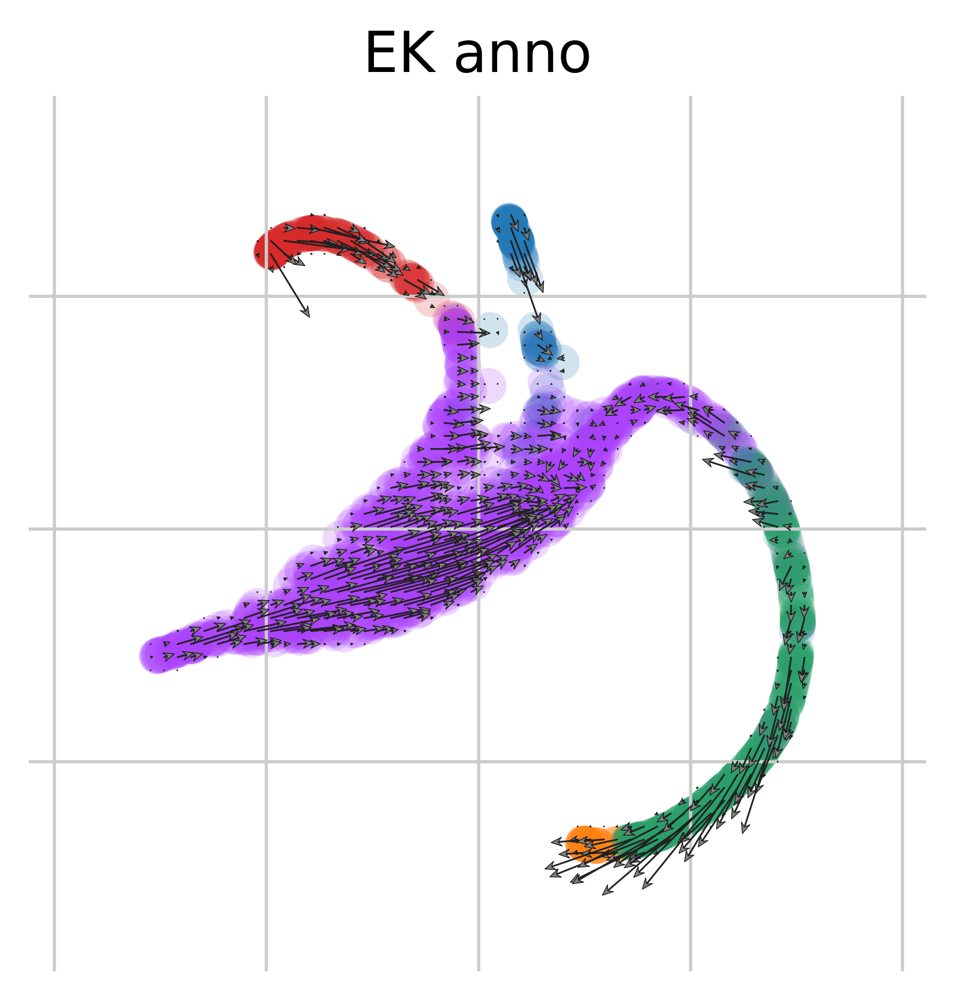

In [153]:
scv.pl.velocity_embedding_grid(early_velo, basis='draw_graph_fa', color = 'EK_anno', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 8, arrow_size = 2, density = 1)

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


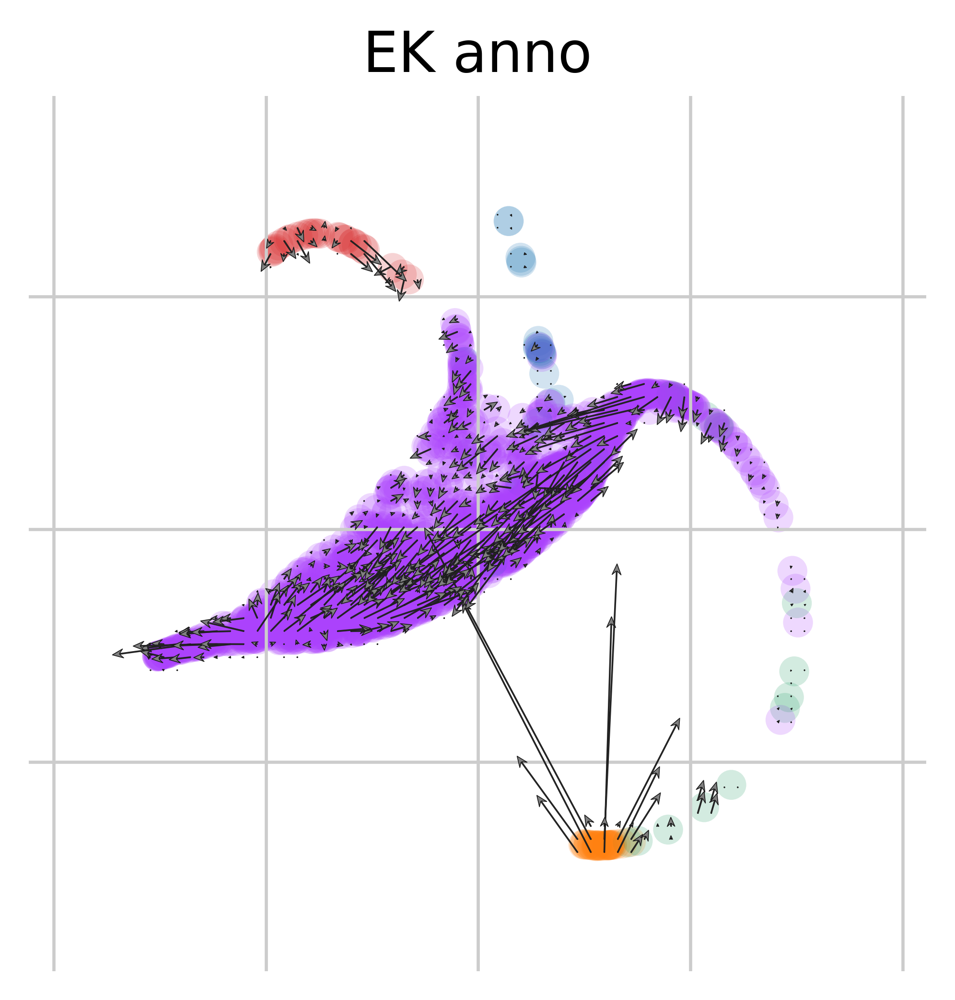

In [154]:
scv.pl.velocity_embedding_grid(late_velo, basis='draw_graph_fa', color = 'EK_anno', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 8, arrow_size = 2, density = 1)

computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


/home/mcrewcow/anaconda3/lib/python3.7/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)


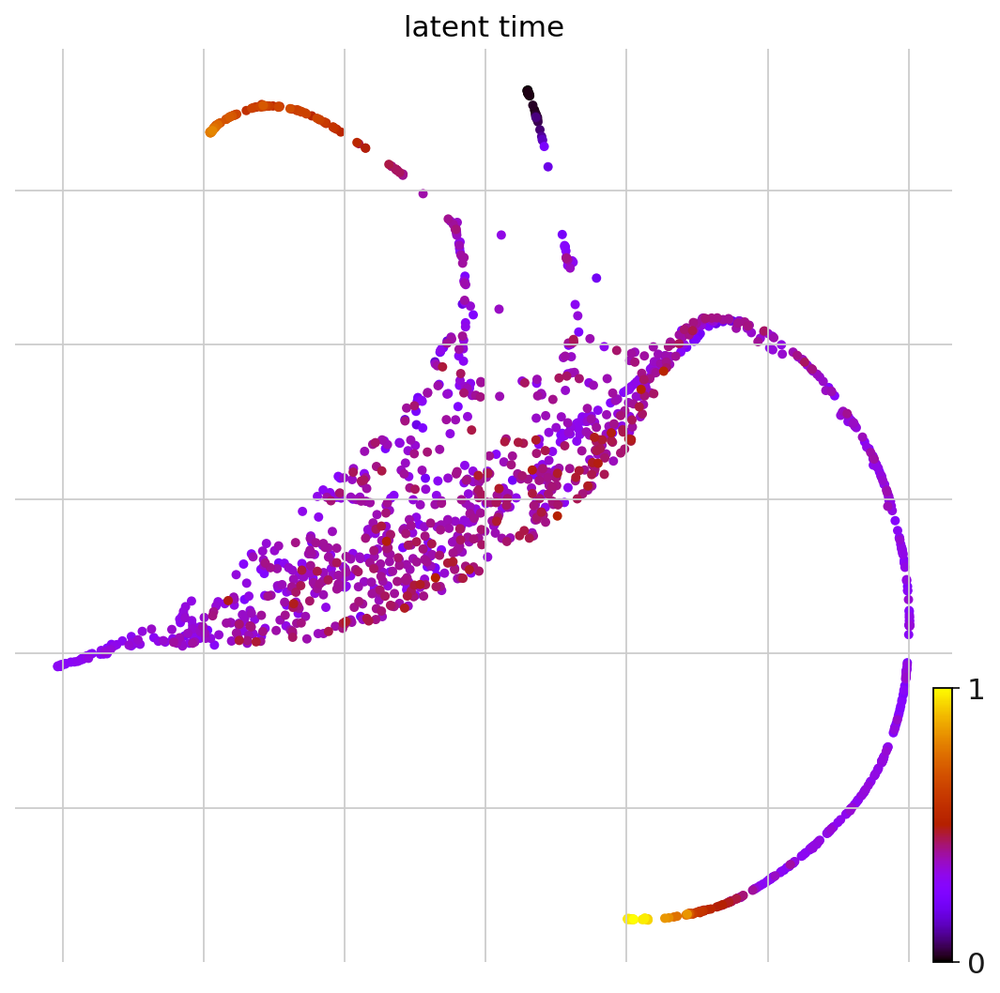

In [765]:
scv.tl.latent_time(early_velo)
scv.pl.scatter(early_velo, color='latent_time', color_map='gnuplot', size=80, basis = 'draw_graph_fa')

computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


/home/mcrewcow/anaconda3/lib/python3.7/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)


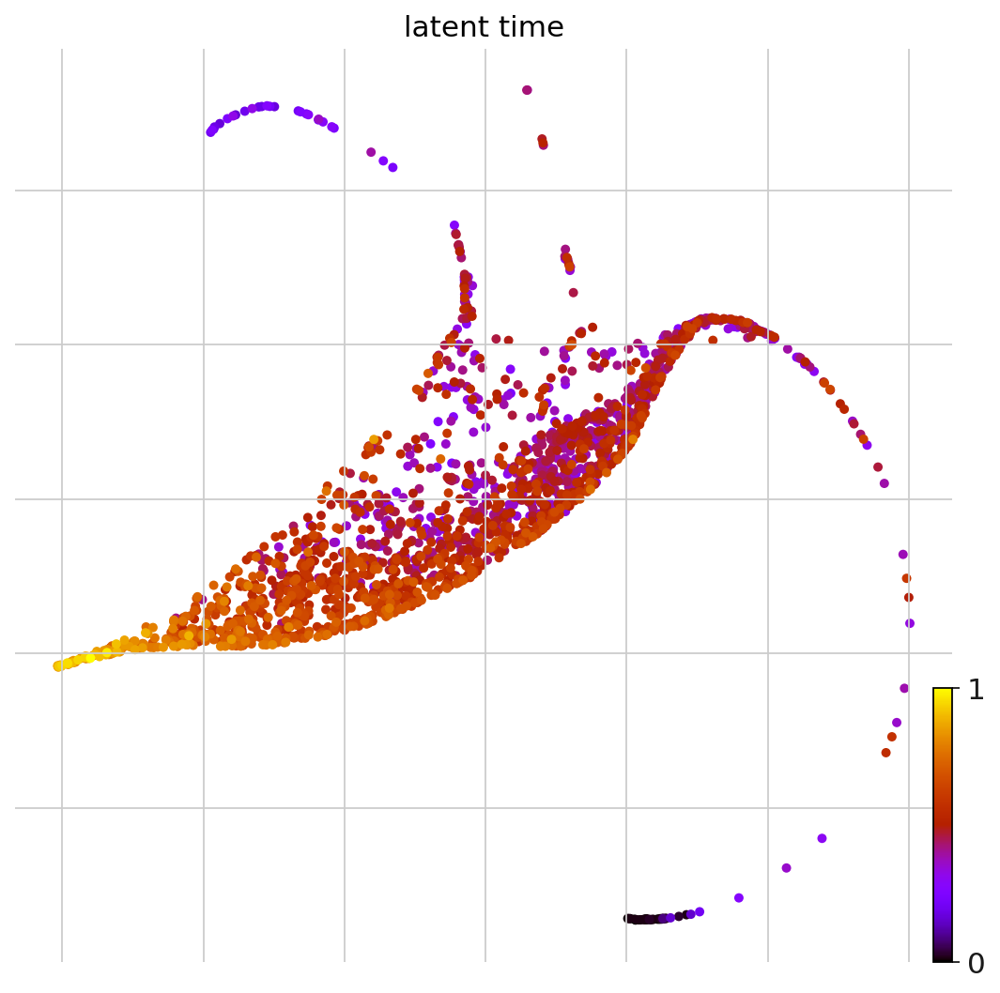

In [766]:
scv.tl.latent_time(late_velo)
scv.pl.scatter(late_velo, color='latent_time', color_map='gnuplot', size=80, basis = 'draw_graph_fa')

In [767]:
early_velo.uns['neighbors']['distances'] = early_velo.obsp['distances']
early_velo.uns['neighbors']['connectivities'] = early_velo.obsp['connectivities']

scv.tl.paga(early_velo, groups='EK_anno')
df = scv.get_df(early_velo, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,Cones,Mature muller glia,Partially muller glia,RGC,Transitory
Cones,0,0,0.19,0.097,0
Mature muller glia,0,0,0,0,0
Partially muller glia,0,0,0,0,0
RGC,0,0,0,0,0.88
Transitory,0,0,0,0,0


In [768]:
late_velo.uns['neighbors']['distances'] = late_velo.obsp['distances']
late_velo.uns['neighbors']['connectivities'] = late_velo.obsp['connectivities']

scv.tl.paga(late_velo, groups='EK_anno')
df = scv.get_df(late_velo, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,Cones,Mature muller glia,Partially muller glia,RGC,Transitory
Cones,0,0,0,0,0
Mature muller glia,0,0,0.22,0,0
Partially muller glia,0,0,0,0,0.34
RGC,0.11,0,0,0,1.3
Transitory,0,0,0,0,0


/home/mcrewcow/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:724: MatplotlibDeprecationWarning: Passing *transOffset* without *offsets* has no effect. This behavior is deprecated since 3.5 and in 3.6, *transOffset* will begin having an effect regardless of *offsets*. In the meantime, if you wish to set *transOffset*, call collection.set_offset_transform(transOffset) explicitly.
  alpha=alpha,


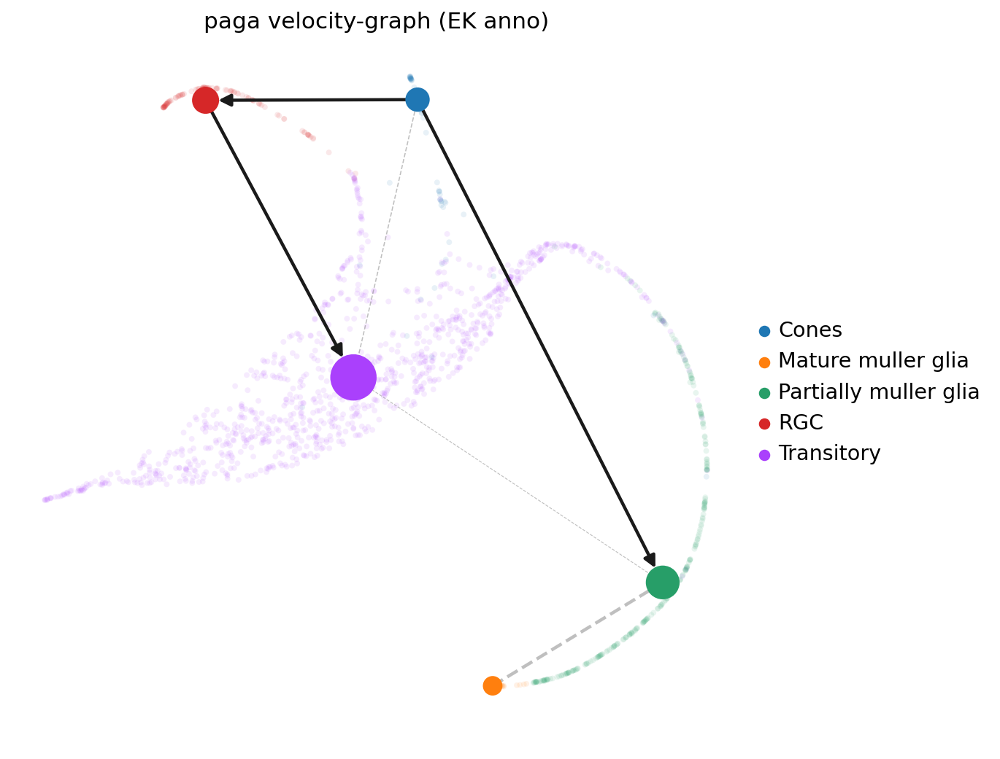

In [769]:
scv.pl.paga(early_velo, basis='draw_graph_fa', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

/home/mcrewcow/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:724: MatplotlibDeprecationWarning: Passing *transOffset* without *offsets* has no effect. This behavior is deprecated since 3.5 and in 3.6, *transOffset* will begin having an effect regardless of *offsets*. In the meantime, if you wish to set *transOffset*, call collection.set_offset_transform(transOffset) explicitly.
  alpha=alpha,


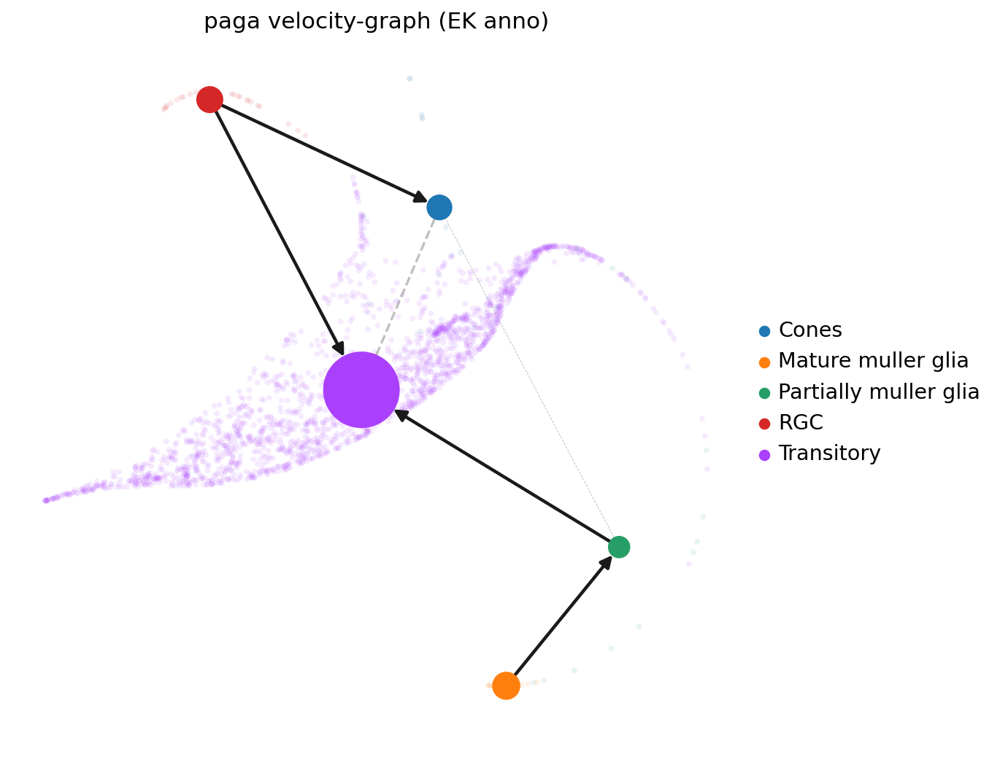

In [770]:
scv.pl.paga(late_velo, basis='draw_graph_fa', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

In [771]:
sc.tl.leiden(early_velo)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [772]:
sc.tl.leiden(late_velo)

running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [773]:
early_velo.uns['neighbors']['distances'] = early_velo.obsp['distances']
early_velo.uns['neighbors']['connectivities'] = early_velo.obsp['connectivities']

scv.tl.paga(early_velo, groups='leiden')
df = scv.get_df(early_velo, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1,2,3,4,5,6,7,8,9,10
0,0,0,0,0,0,0,0,0,0,0,0
1,1.4,0,0,0,1.3,0,0,0,0,0,0
2,0.83,0,0,0,0,0,0,0,0,0,0
3,0.57,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0
5,0.58,0,0,0,0,0,0,0,0,0,0.017
6,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0.13,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0
9,0.13,0,0,0,0,0,0,0,0,0,0


In [774]:
late_velo.uns['neighbors']['distances'] = late_velo.obsp['distances']
late_velo.uns['neighbors']['connectivities'] = late_velo.obsp['connectivities']

scv.tl.paga(late_velo, groups='leiden')
df = scv.get_df(late_velo, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1,2,3,4,5,6,7
0,0,0,0,0,0,0,0,0
1,1.2,0,0,0,0,0,0,0
2,1.2,0,0,0,0,0,0,0
3,1.3,0,0,0,0,0,0,0
4,1.3,0,0,0,0,0,0,0
5,0.5,0,0,0,0,0,0,0
6,0.28,0,0,0,0,0,0,0
7,0.91,0,0,0,0,0,0,0


/home/mcrewcow/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:724: MatplotlibDeprecationWarning: Passing *transOffset* without *offsets* has no effect. This behavior is deprecated since 3.5 and in 3.6, *transOffset* will begin having an effect regardless of *offsets*. In the meantime, if you wish to set *transOffset*, call collection.set_offset_transform(transOffset) explicitly.
  alpha=alpha,


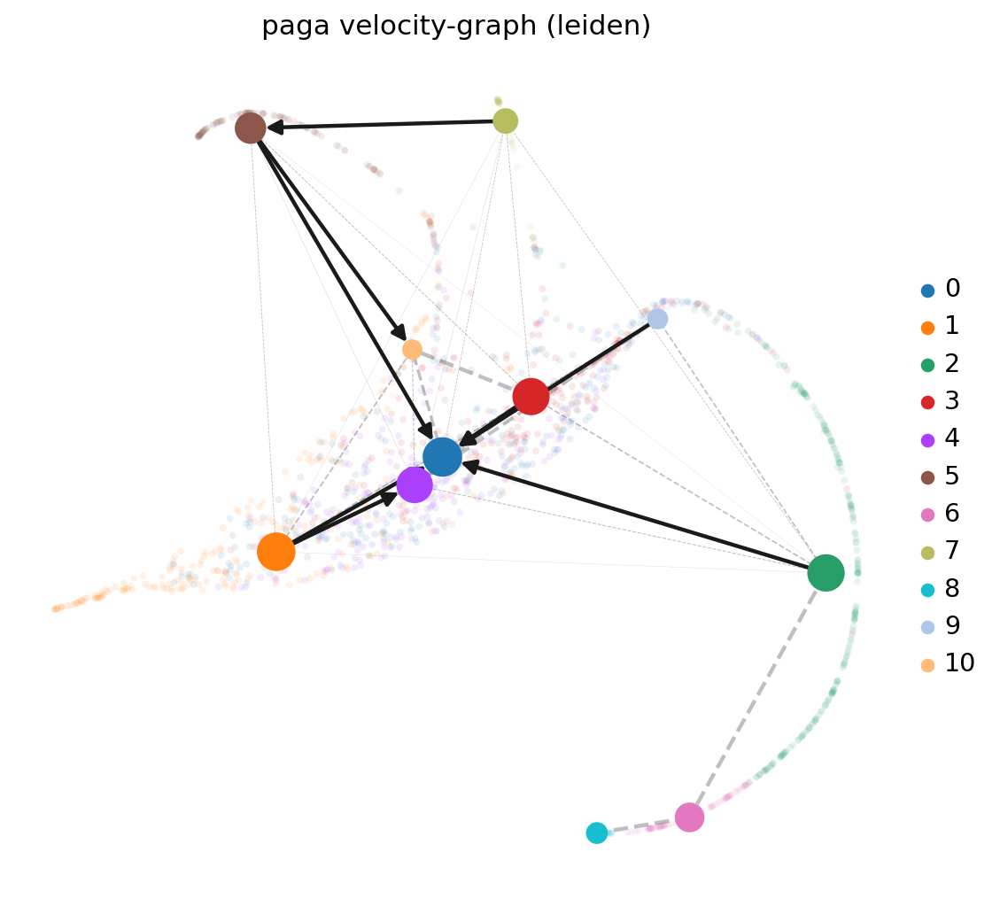

In [775]:
scv.pl.paga(early_velo, basis='draw_graph_fa', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

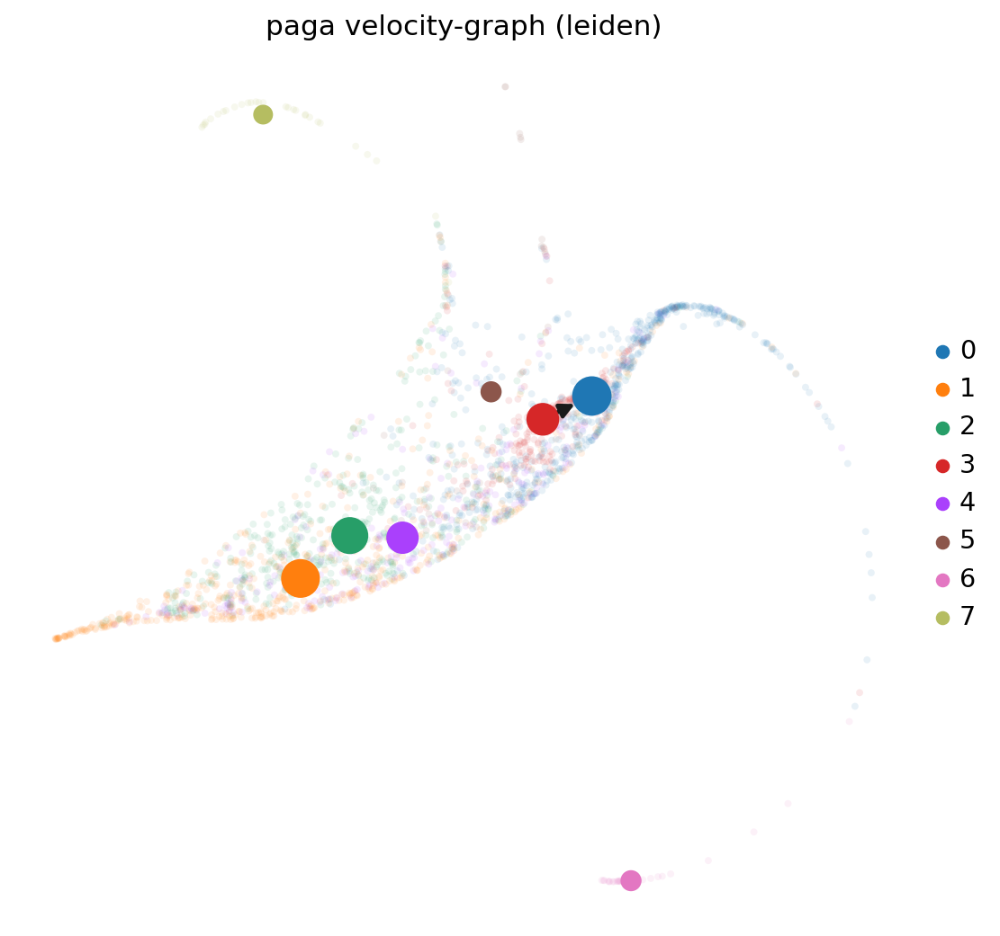

In [776]:
scv.pl.paga(late_velo, basis='draw_graph_fa', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

In [777]:
import cellrank as cr

In [778]:
cr.tl.terminal_states(early_velo, cluster_key="leiden", weight_connectivities=0.2, force_recompute = True, n_states = 1)

Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/1475 [00:00<?, ?cell/s]

Setting `softmax_scale=1.0995`


  0%|          | 0/1475 [00:00<?, ?cell/s]

    Finish (0:00:01)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on connectivities
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `.eigendecomposition`
       `adata.uns['eig_fwd']`
    Finish (0:00:07)
Adding `.macrostates_memberships`
        `.macrostates`
    Finish (0:00:00)
Adding `adata.obs['terminal_states_probs']`
       `adata.obs['terminal_states']`
       `adata.obsm['macrostates_fwd']`
       `.terminal_states_probabilities`
       `.terminal_states`


/home/mcrewcow/anaconda3/lib/python3.7/site-packages/cellrank/tl/_utils.py:1247: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  a_fuzzy.shape, dtype=np.bool
/home/mcrewcow/anaconda3/lib/python3.7/site-packages/cellrank/tl/_utils.py:1310: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if membership.dtype != np.bool:
/home/mcrewcow/anaconda3/lib/python

In [786]:
cr.tl.terminal_states(late_velo, cluster_key="leiden", weight_connectivities=0.2, n_states = 3)

Using precomputed transition matrix
Computing Schur decomposition
Adding `.eigendecomposition`
       `adata.uns['eig_fwd']`
       `.schur`
       `.schur_matrix`
    Finish (0:00:21)
Computing `3` macrostates
Adding `.macrostates_memberships`
       `.macrostates`
       `.schur`
       `.coarse_T`
       `.coarse_stationary_distribution`
    Finish (0:00:00)
Adding `adata.obs['terminal_states_probs']`
       `adata.obs['terminal_states']`
       `adata.obsm['macrostates_fwd']`
       `.terminal_states_probabilities`
       `.terminal_states`


/home/mcrewcow/anaconda3/lib/python3.7/site-packages/cellrank/tl/_utils.py:1247: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  a_fuzzy.shape, dtype=np.bool
/home/mcrewcow/anaconda3/lib/python3.7/site-packages/cellrank/tl/_utils.py:1310: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if membership.dtype != np.bool:
/home/mcrewcow/anaconda3/lib/python

/home/mcrewcow/anaconda3/lib/python3.7/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)


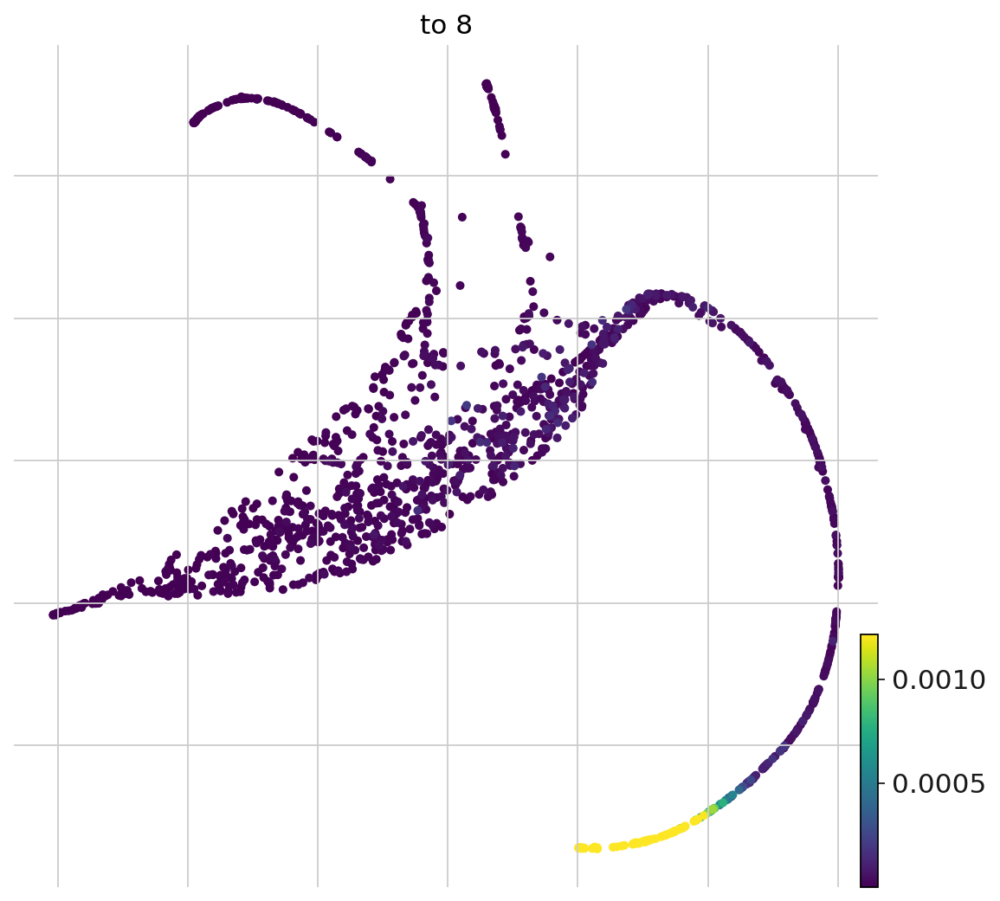

In [780]:
cr.pl.terminal_states(early_velo, basis = 'draw_graph_fa')

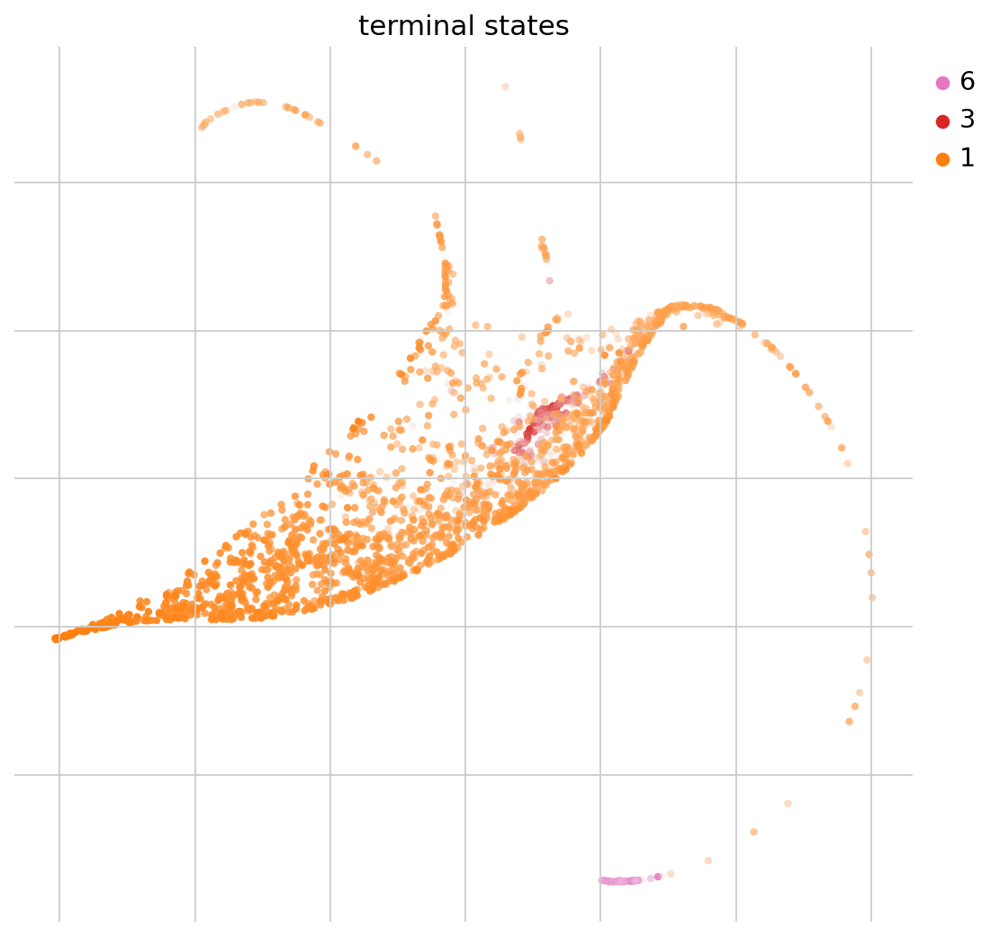

In [787]:
cr.pl.terminal_states(late_velo, basis = 'draw_graph_fa')

Using precomputed transition matrix
Computing Schur decomposition
Adding `.eigendecomposition`
       `adata.uns['eig_bwd']`
       `.schur`
       `.schur_matrix`
    Finish (0:00:08)
Computing `4` macrostates
Adding `.macrostates_memberships`
       `.macrostates`
       `.schur`
       `.coarse_T`
       `.coarse_stationary_distribution`
    Finish (0:00:00)
Adding `adata.obs['initial_states_probs']`
       `adata.obs['initial_states']`
       `adata.obsm['macrostates_bwd']`
       `.terminal_states_probabilities`
       `.terminal_states`


/home/mcrewcow/anaconda3/lib/python3.7/site-packages/cellrank/tl/_utils.py:1247: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  a_fuzzy.shape, dtype=np.bool
/home/mcrewcow/anaconda3/lib/python3.7/site-packages/cellrank/tl/_utils.py:1310: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if membership.dtype != np.bool:
/home/mcrewcow/anaconda3/lib/python

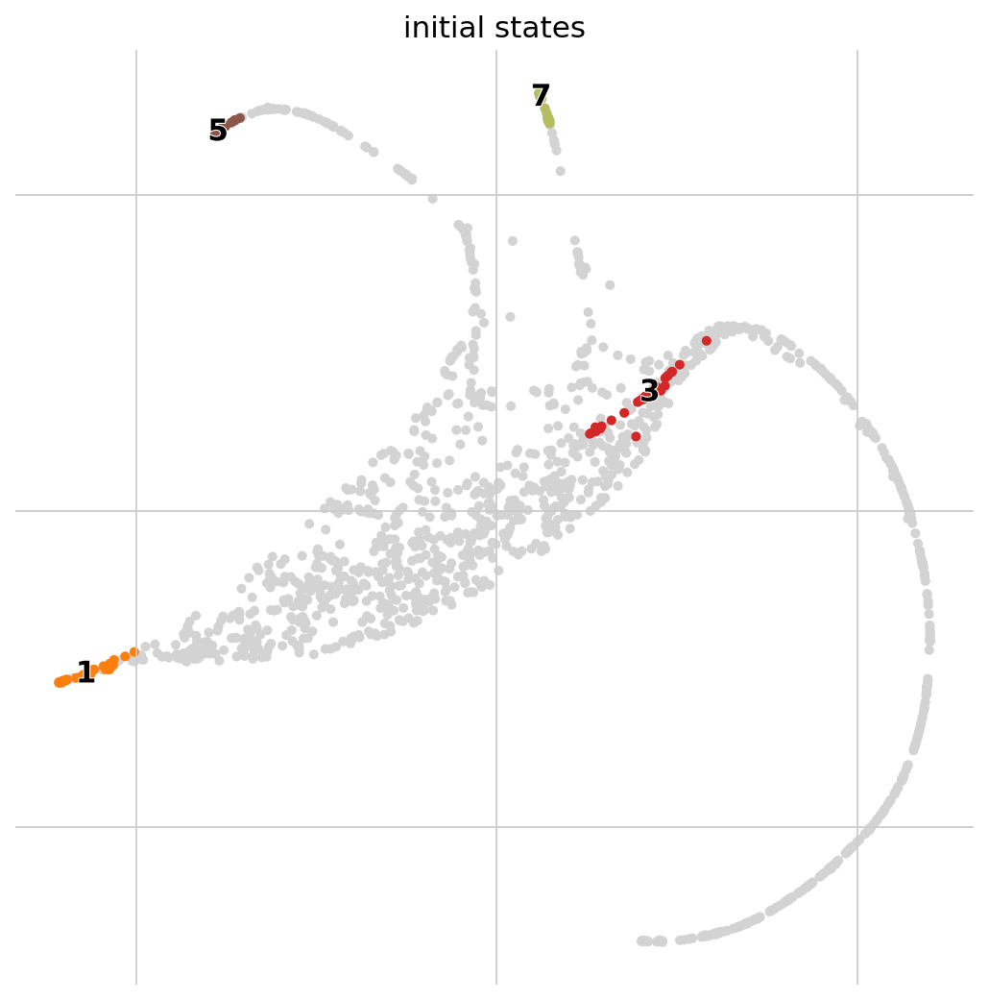

In [790]:
cr.tl.initial_states(early_velo, cluster_key="leiden", n_states = 4)
cr.pl.initial_states(early_velo, discrete=True, basis = 'draw_graph_fa')

Using precomputed transition matrix
Computing Schur decomposition
Adding `.eigendecomposition`
       `adata.uns['eig_bwd']`
       `.schur`
       `.schur_matrix`
    Finish (0:00:16)
Computing `2` macrostates
Adding `.macrostates_memberships`
       `.macrostates`
       `.schur`
       `.coarse_T`
       `.coarse_stationary_distribution`
    Finish (0:00:00)
Adding `adata.obs['initial_states_probs']`
       `adata.obs['initial_states']`
       `adata.obsm['macrostates_bwd']`
       `.terminal_states_probabilities`
       `.terminal_states`


/home/mcrewcow/anaconda3/lib/python3.7/site-packages/cellrank/tl/_utils.py:1247: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  a_fuzzy.shape, dtype=np.bool
/home/mcrewcow/anaconda3/lib/python3.7/site-packages/cellrank/tl/_utils.py:1310: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if membership.dtype != np.bool:
/home/mcrewcow/anaconda3/lib/python

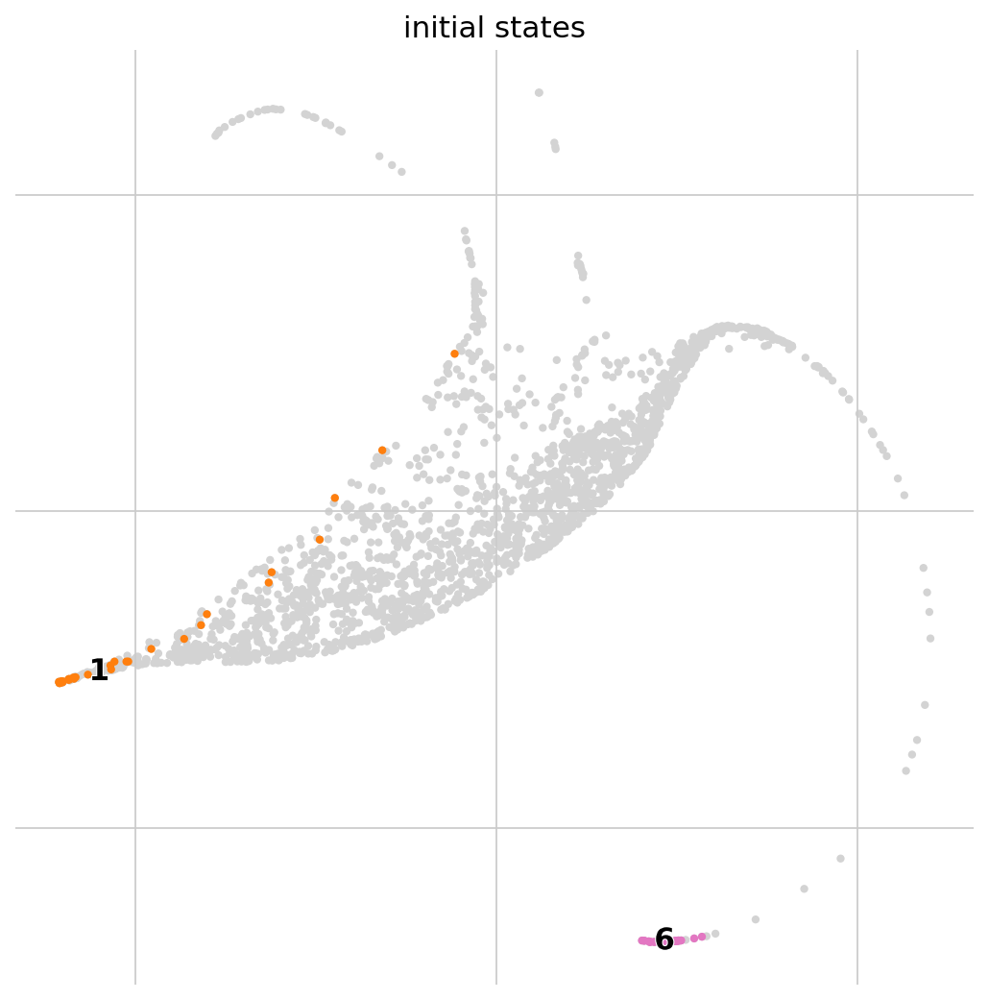

In [792]:
cr.tl.initial_states(late_velo, cluster_key="leiden", n_states = 2)
cr.pl.initial_states(late_velo, discrete=True, basis = 'draw_graph_fa')

Computing lineage probabilities towards terminal states
Computing absorption probabilities
Adding `adata.obsm['to_terminal_states']`
       `adata.obs['to_terminal_states_dp']`
       `.absorption_probabilities`
       `.diff_potential`
    Finish (0:00:01)
Adding lineages to `adata.obsm['to_terminal_states']`
    Finish (0:00:01)


/home/mcrewcow/anaconda3/lib/python3.7/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)


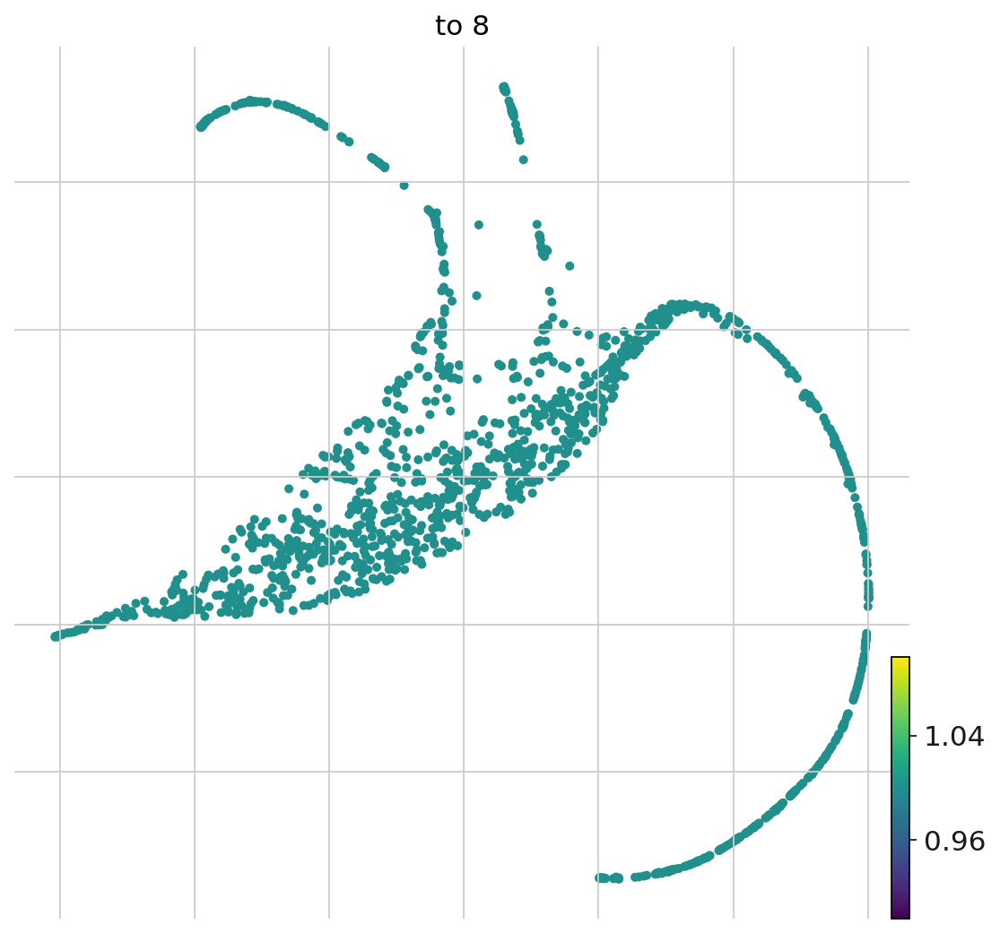

In [793]:
cr.tl.lineages(early_velo, backward= False)
cr.pl.lineages(early_velo, same_plot=False, basis = 'draw_graph_fa')

Computing lineage probabilities towards terminal states
Computing absorption probabilities
Adding `adata.obsm['to_terminal_states']`
       `adata.obs['to_terminal_states_dp']`
       `.absorption_probabilities`
       `.diff_potential`
    Finish (0:00:00)
Adding lineages to `adata.obsm['to_terminal_states']`
    Finish (0:00:00)


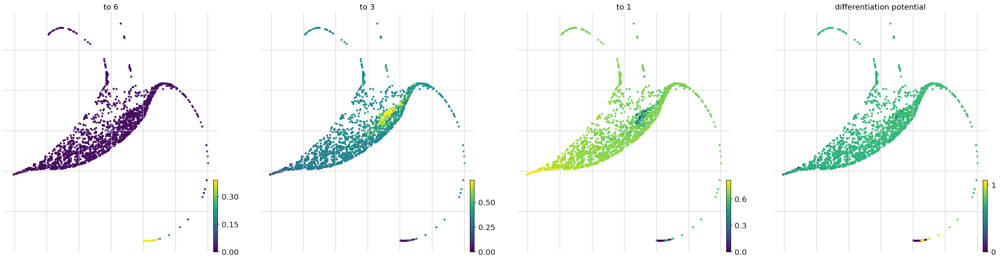

In [794]:
cr.tl.lineages(late_velo, backward= False)
cr.pl.lineages(late_velo, same_plot=False, basis = 'draw_graph_fa')

In [795]:
scv.tl.recover_latent_time(  
    early_velo, root_key="initial_states_probs", end_key="terminal_states_probs"  
)

computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


In [796]:
scv.tl.recover_latent_time(  
    late_velo, root_key="initial_states_probs", end_key="terminal_states_probs"  
)

computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


In [797]:
scv.tl.paga(
    early_velo,
    groups="leiden",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="latent_time",
)

running PAGA using priors: ['latent_time', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


In [798]:
scv.tl.paga(
    late_velo,
    groups="leiden",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="latent_time",
)

running PAGA using priors: ['latent_time', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


/home/mcrewcow/anaconda3/lib/python3.7/site-packages/cellrank/pl/_cluster_fates.py:488: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.array(mask, dtype=np.bool)
/home/mcrewcow/anaconda3/lib/python3.7/site-packages/cellrank/tl/_lineage.py:414: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if item_1.dtype == np.bool:
/home/mcrewcow/anaconda

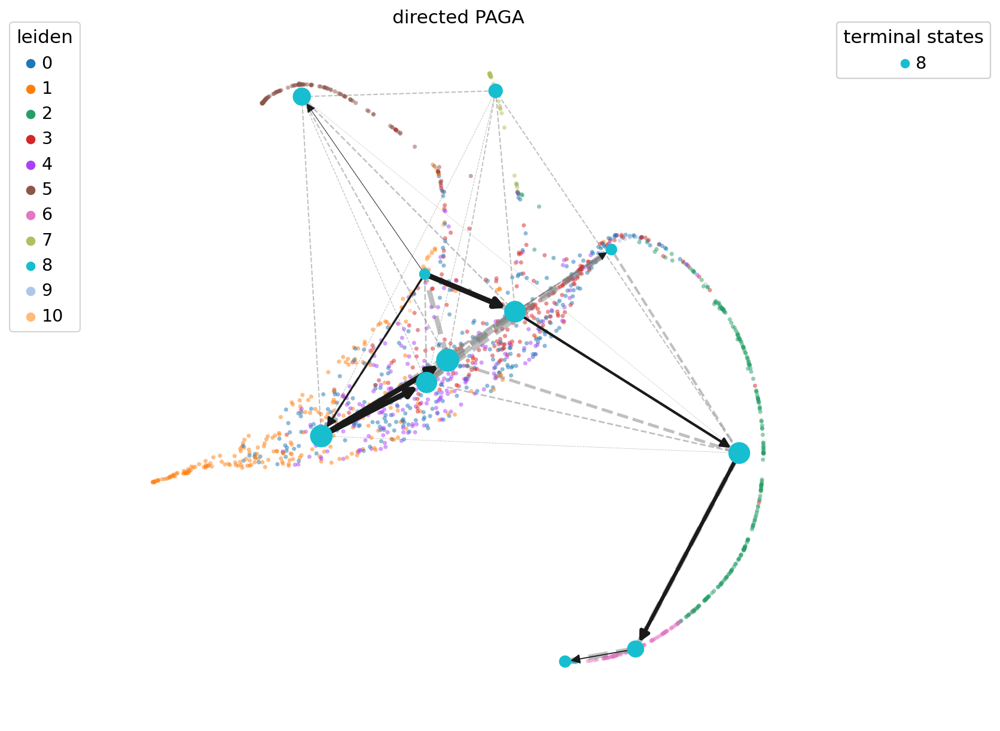

In [799]:
cr.pl.cluster_fates(
    early_velo,
    mode="paga_pie",
    cluster_key="leiden",
    basis="draw_graph_fa",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=1,
    edge_width_scale=1,
    max_edge_width=4,
    title="directed PAGA",
)

/home/mcrewcow/anaconda3/lib/python3.7/site-packages/cellrank/pl/_cluster_fates.py:488: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.array(mask, dtype=np.bool)
/home/mcrewcow/anaconda3/lib/python3.7/site-packages/cellrank/tl/_lineage.py:414: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if item_1.dtype == np.bool:
/home/mcrewcow/anaconda

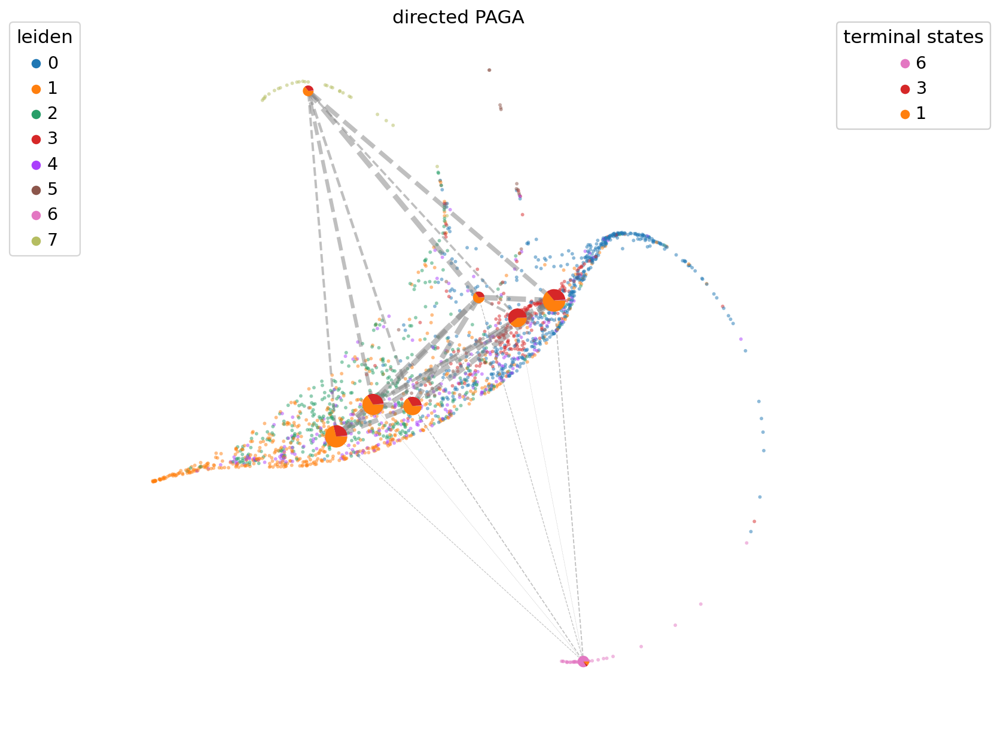

In [800]:
cr.pl.cluster_fates(
    late_velo,
    mode="paga_pie",
    cluster_key="leiden",
    basis="draw_graph_fa",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=1,
    edge_width_scale=1,
    max_edge_width=4,
    title="directed PAGA",
)

In [801]:
# compue DPT, starting from CellRank defined root cell
root_idx = np.where(early_velo.obs["initial_states"] == "Transitory")[0][0]
early_velo.uns["iroot"] = root_idx
sc.tl.dpt(early_velo)

scv.pl.scatter(
    early_velo, basis = 'draw_graph_fa',
    color=["leiden", root_idx, "latent_time", "dpt_pseudotime"],
    fontsize=16,
    cmap="viridis",
    perc=[2, 98],
    colorbar=True,
    rescale_color=[0, 1],
    title=["leiden", "root cell", "latent time", "dpt pseudotime"],
)

IndexError: index 0 is out of bounds for axis 0 with size 0

(array([], dtype=int64),)

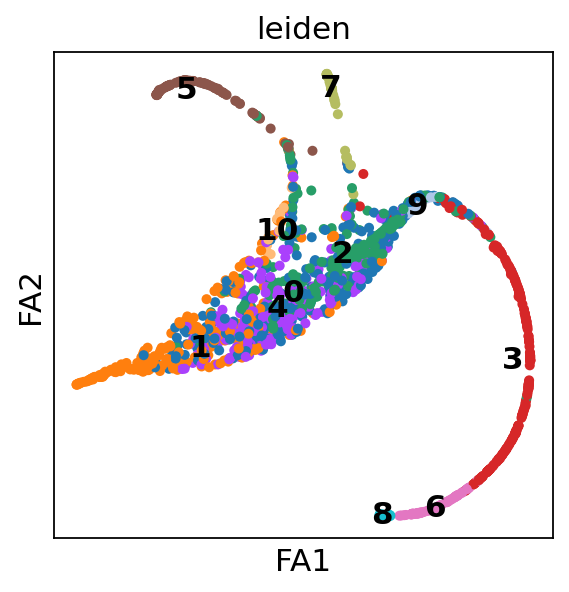

In [248]:
sc.pl.draw_graph(early_velo,color="leiden", layout = 'fa', legend_loc = 'on data')

In [606]:
cr.tl.lineage_drivers(early_velo, lineages='5', use_raw=False, backward=False)

Computing correlations for lineages `['5']` restricted to clusters `None` in layer `X` with `use_raw=False`
Adding `.lineage_drivers`
       `adata.var['to 5 corr']`
    Finish (0:00:00)


,5 corr,5 pval,5 qval,5 ci low,5 ci high
Flt1,0.44,3.69e-75,3.40e-73,0.40,0.48
Cav1,0.37,7.59e-51,3.49e-49,0.33,0.42
Kcnj10,0.33,1.91e-39,5.86e-38,0.28,0.37
Trpm3,0.27,7.83e-27,1.80e-25,0.22,0.32
Acsl3,0.22,4.80e-18,8.82e-17,0.17,0.27
...,...,...,...,...,...
Caln1,-0.14,5.83e-08,4.88e-07,-0.19,-0.09
Ncald,-0.14,4.21e-08,3.87e-07,-0.19,-0.09
Syt1,-0.17,5.26e-11,5.38e-10,-0.22,-0.12
Dync1i1,-0.19,1.60e-13,1.84e-12,-0.24,-0.14


In [257]:
cr.tl.lineage_drivers(early_velo, cluster_key = 'leiden',clusters = ['7','2','8'])

Computing correlations for lineages `['8']` restricted to clusters `['7', '2', '8']` in layer `X` with `use_raw=False`
Adding `.lineage_drivers`
       `adata.var['to 8 corr']`
    Finish (0:00:00)


,8 corr,8 pval,8 qval,8 ci low,8 ci high
Trpm3,6.96e-01,3.40e-49,1.90e-47,0.63,7.51e-01
Acsl3,5.00e-01,4.69e-21,1.31e-19,0.41,5.81e-01
Ctnnbip1,4.02e-01,2.90e-13,5.41e-12,0.30,4.93e-01
Ptprz1,2.04e-01,3.83e-04,2.97e-03,0.09,3.11e-01
Unc13c,1.68e-01,3.68e-03,2.29e-02,0.06,2.76e-01
Gkap1,1.29e-01,2.64e-02,8.71e-02,0.02,2.39e-01
Zfp398,1.29e-01,2.64e-02,8.71e-02,0.02,2.39e-01
Kazn,6.42e-02,2.70e-01,4.32e-01,-0.05,1.77e-01
Dusp16,5.59e-02,3.37e-01,5.10e-01,-0.06,1.69e-01
Asrgl1,2.16e-02,7.11e-01,7.97e-01,-0.09,1.35e-01


In [256]:
cr.tl.lineage_drivers(early_velo, cluster_key = 'leiden',clusters = ['5','10','8'])

Computing correlations for lineages `['8']` restricted to clusters `['5', '10', '8']` in layer `X` with `use_raw=False`
Adding `.lineage_drivers`
       `adata.var['to 8 corr']`
    Finish (0:00:00)


,8 corr,8 pval,8 qval,8 ci low,8 ci high
Acsl3,6.93e-01,1.14e-24,6.37e-23,0.60,7.69e-01
Trpm3,6.60e-01,1.74e-21,4.87e-20,0.56,7.43e-01
Ctnnbip1,4.82e-01,2.85e-10,5.33e-09,0.35,5.97e-01
Ahnak,2.81e-01,5.28e-04,2.95e-03,0.12,4.24e-01
Gkap1,2.74e-01,7.50e-04,3.82e-03,0.12,4.17e-01
Kazn,1.79e-01,2.95e-02,9.18e-02,0.02,3.32e-01
Dusp16,1.15e-01,1.67e-01,2.76e-01,-0.05,2.71e-01
Unc13c,1.08e-01,1.95e-01,3.08e-01,-0.06,2.65e-01
Zfp398,1.04e-01,2.10e-01,3.08e-01,-0.06,2.61e-01
Opn1sw,4.80e-02,5.64e-01,6.73e-01,-0.11,2.08e-01


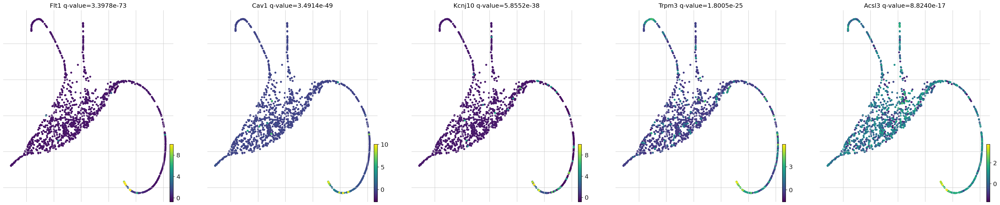

In [607]:
cr.pl.lineage_drivers(early_velo, lineage="5", n_genes=5, basis = 'draw_graph_fa')

In [603]:
early_velo.var_names

Index(['Opn1sw', 'Tnnt1', 'Itgb5', 'Mef2c', 'Cav1', 'Nxph1', 'Cntn5', 'Flt1',
       'Slit2', 'Nrxn3', 'Trpm3', 'Sphkap', 'Adarb2', 'Ptpn6', 'Tgfbr1', 'Gem',
       'Zfhx3', 'Acsl3', 'Cngb3', 'Ssh2', 'Fermt3', 'Cntnap5a', 'Unc13c',
       'Gm32647', 'Dync1i1', 'Gabrr2', 'Nudt4', 'Ptprz1', 'Plch2', 'Kcnb1',
       'Basp1', 'Car10', 'Tmem108', 'Kcnq3', 'Gpr179', 'Kcnj10', 'Psap',
       'Nol4l', 'Tnrc18', 'Igfbpl1', 'Col7a1', 'Zfp804b', 'Spint2', 'Mest',
       'Smg6', 'Ncald', 'Tpx2', 'Hhip', 'Ptafr', 'Lhfpl3', 'Kcnma1', 'Eml5',
       'Cdk6', 'Zfp398', 'Zfp462', 'Gkap1', 'Gabrr1', 'Lncpint', 'Dusp16',
       'Add2', 'Nrxn1', 'Cpeb4', 'Taf1', 'Ctnnbip1', 'Sult2b1', 'Ahnak',
       'Tet1', 'Impdh1', 'Tnr', 'Rit2', 'Asrgl1', 'Celf4', 'Syt1', 'Hivep2',
       'Zfyve9', 'Kazn', 'Epc1', 'Esco1', 'Myt1l', 'Mgat4b', 'Caln1', 'R3hdm2',
       'Maml2', 'Tmem178b', 'Cwf19l2', 'Opcml', 'Srrm4', 'Crb2', 'Cttnbp2',
       'Ccdc88c', 'Ncam2', 'Ica1'],
      dtype='object')

In [802]:
model = cr.ul.models.GAM(early_velo)
cr.pl.gene_trends(
    early_velo,
    model=model,
    data_key="X",
    genes=["Trpm3"],
    ncols=3,
    time_key="latent_time",
    same_plot=True,
    hide_cells=True,
    figsize=(15, 4),
    n_test_points=200
)

Computing trends using `1` core(s)


  0%|          | 0/1 [00:00<?, ?gene/s]

    Finish (0:00:00)


RuntimeError: Fatal model failure `<FailedModel[origin=GAM[gene='Trpm3', lineage='8', model=GammaGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, max_iter=2000, scale=None, terms=s(0), tol=0.0001, verbose=False)]]>`.

In [804]:
cr.pl.heatmap(
    late_velo,
    model,
    genes=late_velo.varm['terminal_lineage_drivers']["5_corr"].sort_values(ascending=False).index[:100],
    show_absorption_probabilities=True,
    lineages="5",
    n_jobs=1,
    backend="loky",
)

KeyError: 'terminal_lineage_drivers'

In [807]:
late_velo

AnnData object with n_obs × n_vars = 2141 × 45
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'percent.mt', 'RNA_snn_res.0.5', 'seurat_clusters', 'pANN_0.25_0.04_241', 'DF.classifications_0.25_0.04_241', 'DF.classifications_0.25_0.04_191', 'pANN_0.25_0.06_182', 'DF.classifications_0.25_0.06_182', 'DF.classifications_0.25_0.06_153', 'integrated_snn_res.0.5', 'EK_anno', 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time', 'leiden', 'terminal_states', 'terminal_states_probs', 'clusters_gradients', 'initial_states', 'initial_states_probs', 'to_terminal_states_dp'
    var: 'features', 'n_counts', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes', 'f

Solving TSP for `3` states


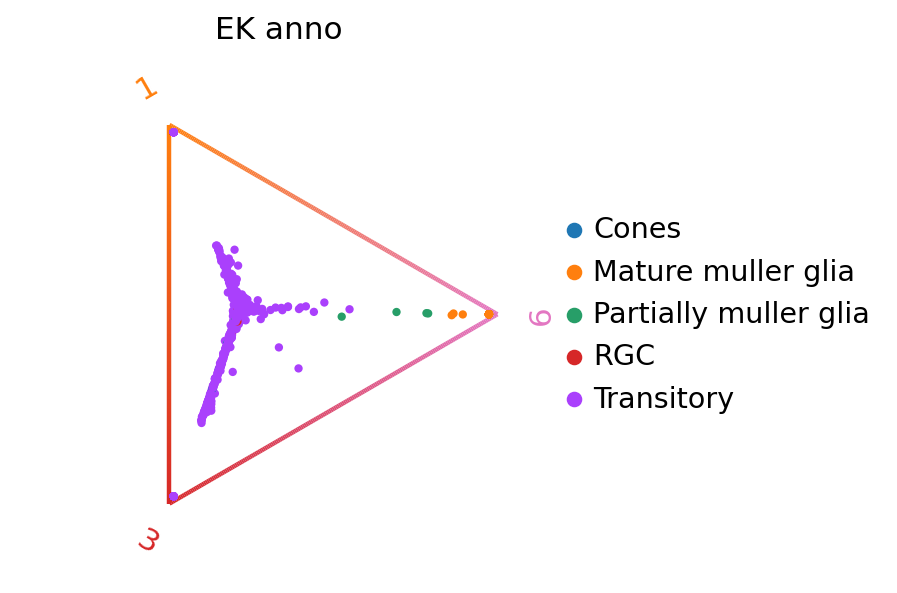

In [809]:
cr.pl.circular_projection(late_velo, keys="EK_anno", legend_loc="right")

Solving TSP for `3` states


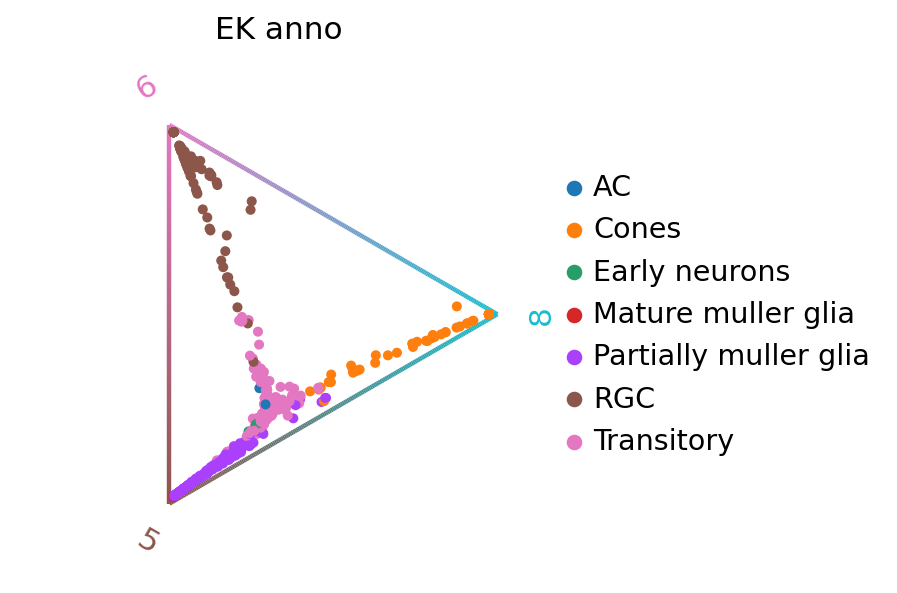

In [157]:
cr.pl.circular_projection(early_velo, keys="EK_anno", legend_loc="right", save = 'figures/triangle.pdf') #do reversed to find genes

In [178]:
import sys
!{sys.executable} -m pip -q install palantir fa2

In [179]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
sc.settings.logfile = sys.stdout
## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline

sc.set_figure_params()
scf.set_figure_pubready()

In [199]:
sc.pp.pca(early_velo)
pca_projections = pd.DataFrame(early_velo.obsm["X_pca"],index=early_velo.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
early_velo.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(early_velo,n_neighbors=30,use_rep="X_palantir")
early_velo.obsm["X_pca2d"]=early_velo.obsm["X_pca"][:,:2]
sc.tl.draw_graph(early_velo,init_pos='X_pca2d')

computing PCA
    with n_comps=50
    finished (0:00:00)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:06)


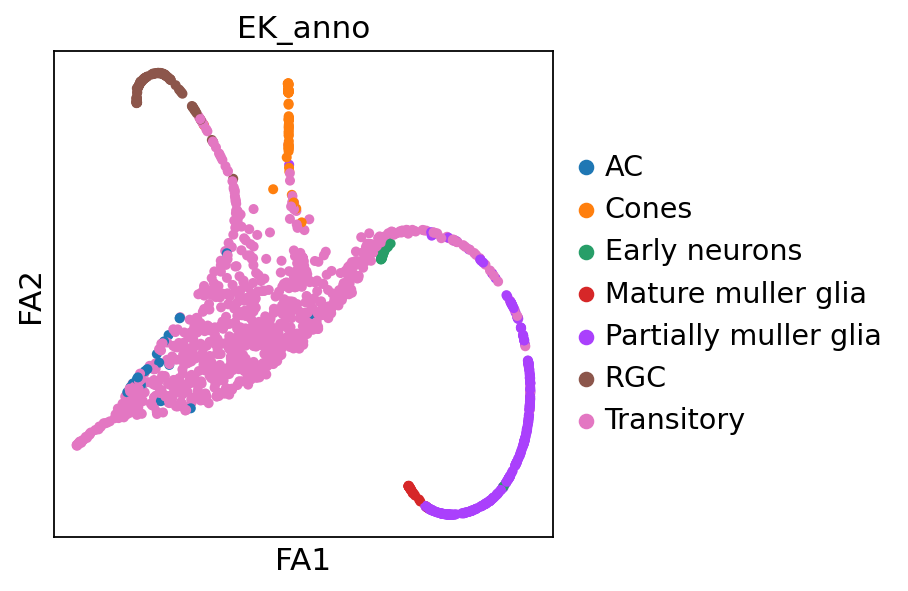

In [211]:
sc.set_figure_params()
sc.pl.draw_graph(early_velo,color="EK_anno", layout = 'fa')

In [180]:
scf.tl.tree(mg,method="ppt",Nodes=400,use_rep="palantir",
            device="cpu",seed=1,ppt_lambda=1,ppt_sigma=0.07,ppt_nsteps=100)

inferring a principal tree --> parameters used 
    400 principal points, sigma = 0.07, lambda = 1, metric = euclidean
    fitting: 100%|████████████████████████████████████████████████████████████████████| 100/100 [00:11<00:00,  8.40it/s]
    not converged (error: 0.014504685434798891)
    more than 30 tips detected!
    finished (0:00:12) --> added 
    .uns['ppt'], dictionnary containing inferred tree.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.


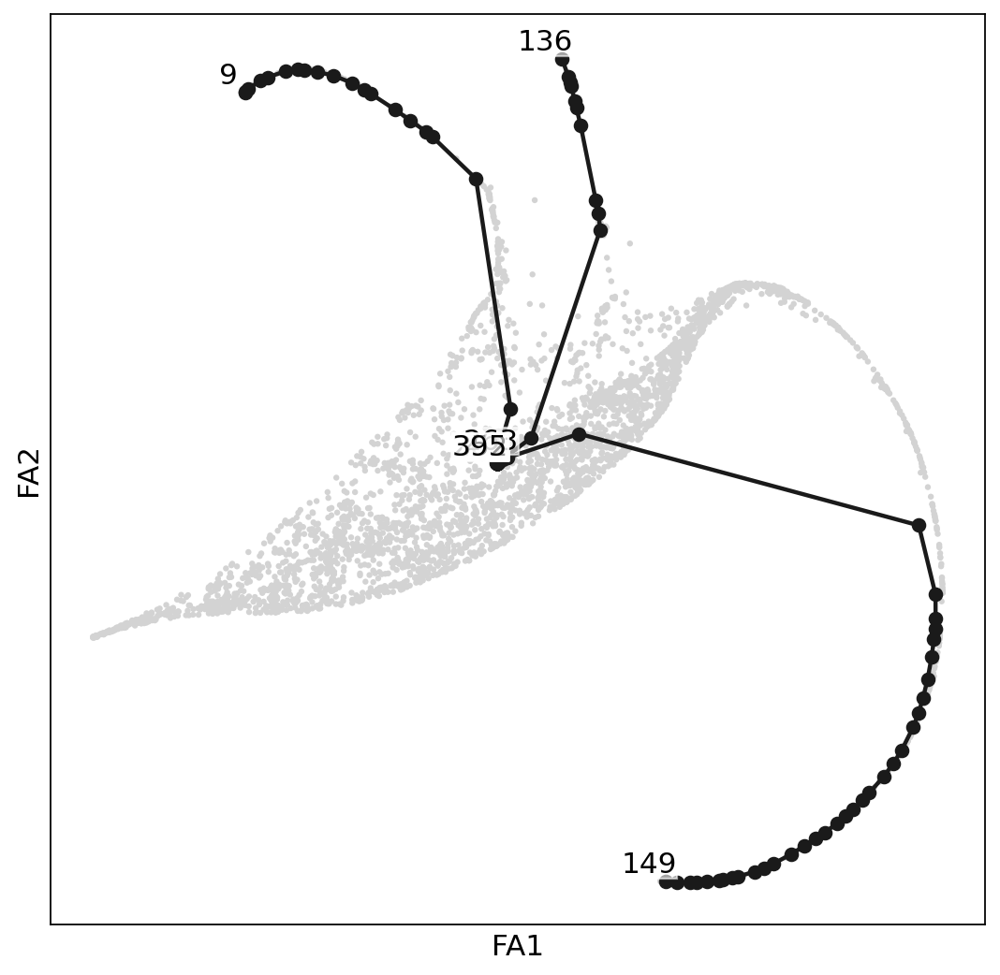

In [182]:
sc.set_figure_params(figsize = [8,8])
scf.pl.graph(mg)

In [183]:
sc.set_figure_params()
scf.tl.root(mg,395)

node 395 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.


In [184]:
scf.tl.pseudotime(mg,n_jobs=20,n_map=100,seed=42)

projecting cells onto the principal graph
    mappings: 100%|███████████████████████████████████████████████████████████████████| 100/100 [03:00<00:00,  1.80s/it]


ValueError: Unable to coerce to DataFrame, shape must be (28, 273): given (28, 288)

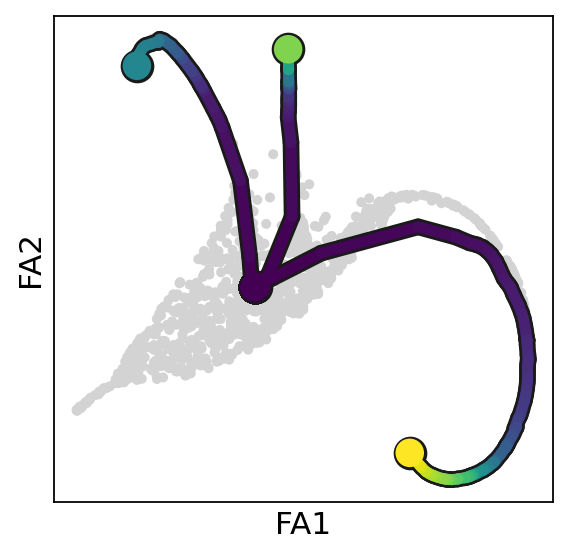

In [285]:
scf.pl.trajectory(mg)

KeyError: 'milestones'

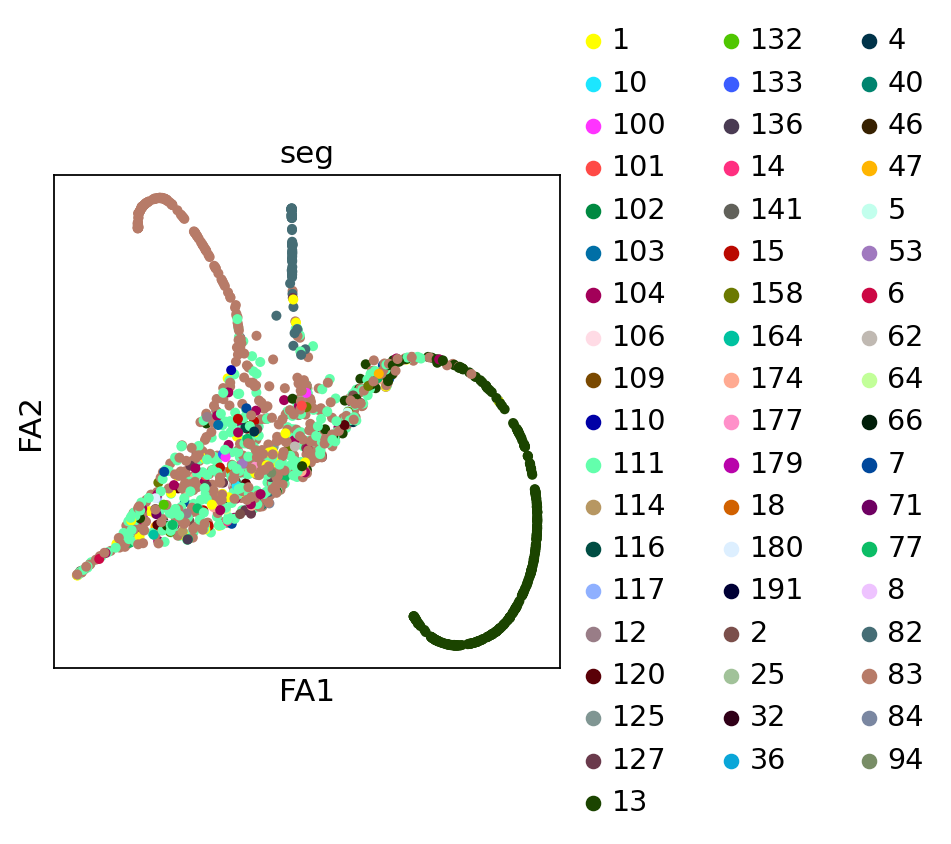

In [255]:
sc.pl.draw_graph(early,color=["seg","milestones"])
#scf.tl.rename_milestones(early_velo,["bifA","Ery","DC","Root","BifB","Mono"])
# we change the color of the root milestone for better visualisations
early.uns["milestones_colors"][3]="#17bece"

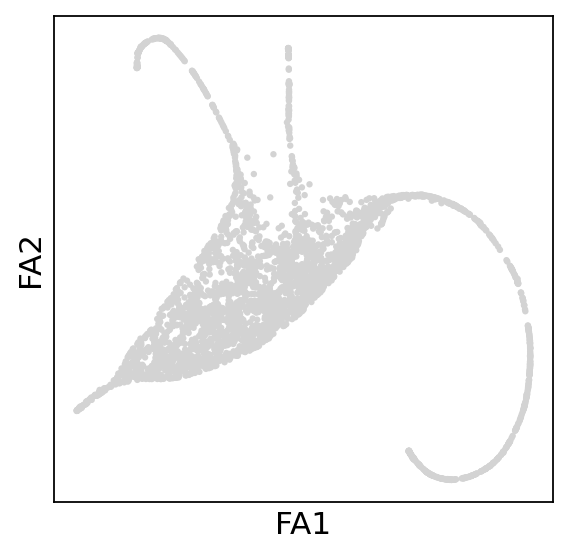

In [276]:
sc.pl.draw_graph(mg, layout = 'fa')

In [275]:
mg

AnnData object with n_obs × n_vars = 3616 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'percent.mt', 'RNA_snn_res.0.5', 'seurat_clusters', 'pANN_0.25_0.04_241', 'DF.classifications_0.25_0.04_241', 'DF.classifications_0.25_0.04_191', 'pANN_0.25_0.06_182', 'DF.classifications_0.25_0.06_182', 'DF.classifications_0.25_0.06_153', 'integrated_snn_res.0.5', 'EK_anno', 'sample_batch'
    var: 'features'
    uns: 'neighbors', 'pca', 'draw_graph', 'orig.ident_colors', 'seurat_clusters_colors', 'EK_anno_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [ ]:
scf.tl.test_association(early,n_jobs=20)

test features for association with the trajectory
    single mapping :   4%|██▎                                                         | 79/2000 [00:48<19:49,  1.62it/s]

In [ ]:
scf.pl.test_association(early)

In [ ]:
scf.tl.fit(early,n_jobs=20)

In [312]:
top_genes = early_velo.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.pl.heatmap(early_velo, var_names=top_genes, sortby='latent_time', col_color='EK_anno', n_convolve=300,yticklabels=True, figsize = (8,32))

KeyError: 'fit_likelihood'

In [313]:
early_velo.var

,features,Accession,Chromosome,End,Start,Strand,velocity_gamma,velocity_qreg_ratio,velocity_r2,velocity_genes
Opn1sw,Opn1sw,ENSMUSG00000058831.14,6,29388467,29376670,-,0.02,0.02,0.98,True
Tnnt1,Tnnt1,ENSMUSG00000064179.14,7,4519381,4507569,-,0.31,0.33,0.43,True
Itgb5,Itgb5,ENSMUSG00000022817.16,16,33769708,33650035,+,15.51,15.51,-1.51,False
Mef2c,Mef2c,ENSMUSG00000005583.17,13,83815199,83652153,+,6.27,6.27,-7.56,False
Cav1,Cav1,ENSMUSG00000007655.17,6,17341451,17306334,+,1.14,1.06,0.92,True
...,...,...,...,...,...,...,...,...,...,...
Crb2,Crb2,ENSMUSG00000035403.11,2,37689115,37666261,+,0.75,0.75,-0.32,False
Cttnbp2,Cttnbp2,ENSMUSG00000000416.17,6,18514842,18366477,-,1.84,1.84,-0.33,False
Ccdc88c,Ccdc88c,ENSMUSG00000021182.17,12,100995315,100877782,-,1.31,1.31,-1.24,False
Ncam2,Ncam2,ENSMUSG00000022762.19,16,81423716,80997585,+,6.56,8.17,0.45,True


In [160]:
sc.tl.leiden(early)

running Leiden clustering
    finished: found 28 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


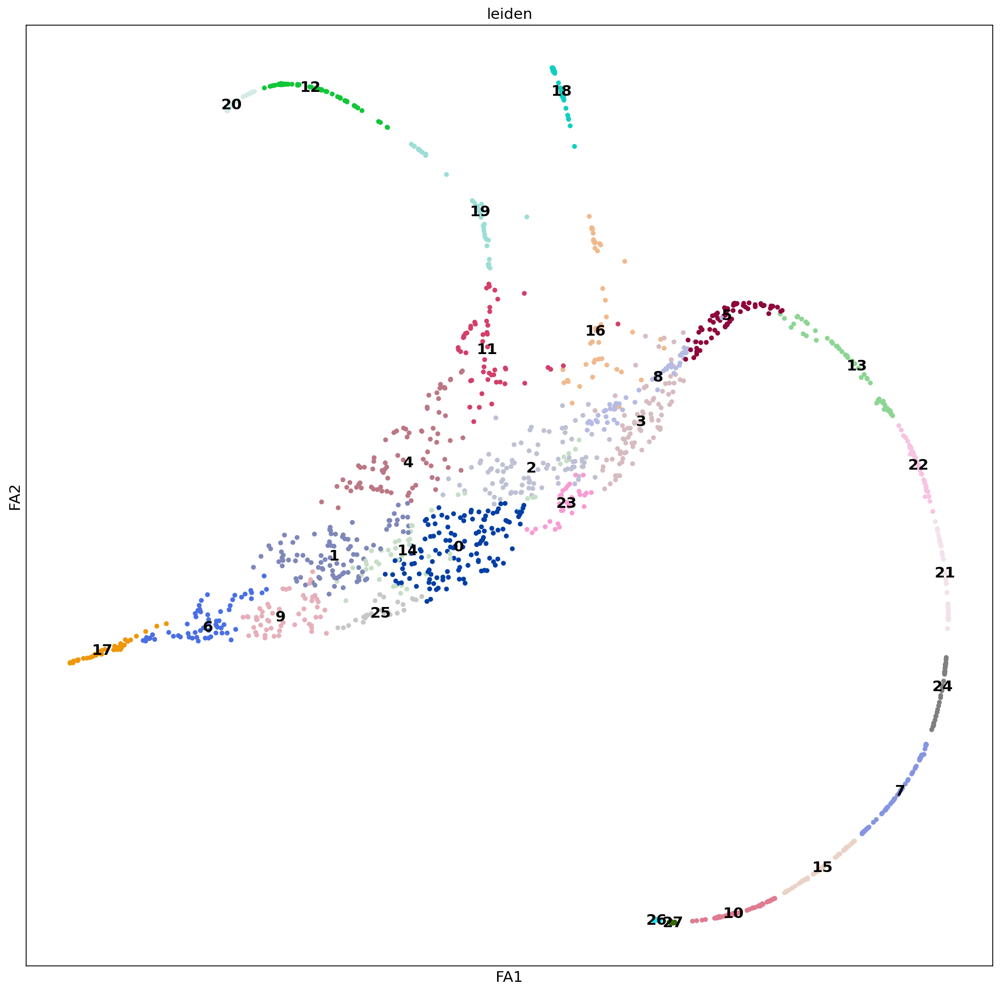

In [161]:
sc.set_figure_params(figsize = [16,16])
sc.pl.draw_graph(early,color="leiden", layout = 'fa', legend_loc = 'on data')

In [234]:
early_rgc = early[early.obs['leiden'].isin(['20','2','12','19','11','8','5','13','22','21','24','7','10','15','26','27'])]

In [261]:
early_cones= early[early.obs['leiden'].isin(['18','16','8','5','13','22','21','24','7','10','15','26','27'])]

In [262]:
early_mg= early[early.obs['leiden'].isin(['17','6','9','25','1','14','0','2','23','3','8','5','13','22','21','24','7','10','15','26','27'])]

In [263]:
early_mg = early_mg[early_mg.obs['EK_anno'].isin(['Transitory','Partially muller glia','Mature muller glia'])]

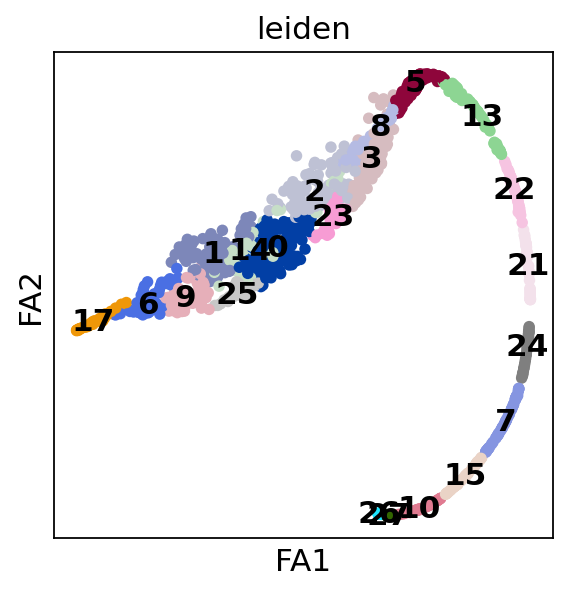

In [264]:
sc.set_figure_params()
sc.pl.draw_graph(early_mg,color="leiden", layout = 'fa', legend_loc = 'on data')

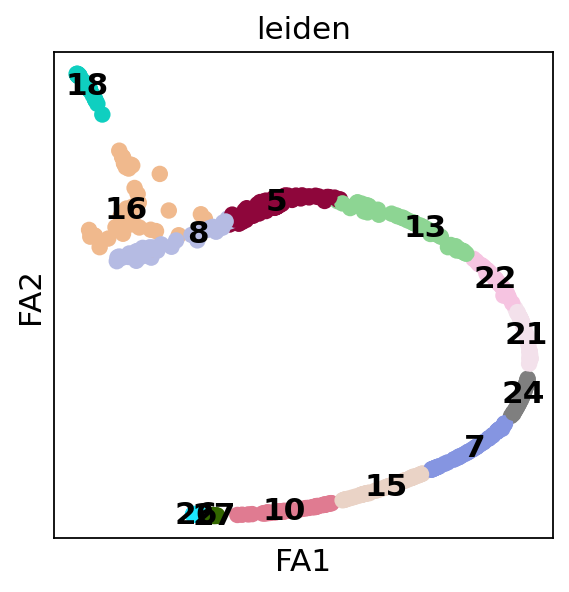

In [265]:
sc.set_figure_params()
sc.pl.draw_graph(early_cones,color="leiden", layout = 'fa', legend_loc = 'on data')

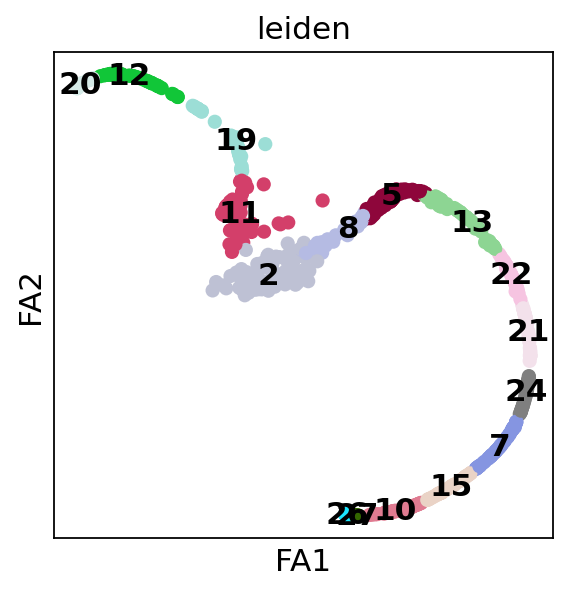

In [235]:
sc.set_figure_params()
sc.pl.draw_graph(early_rgc,color="leiden", layout = 'fa', legend_loc = 'on data')

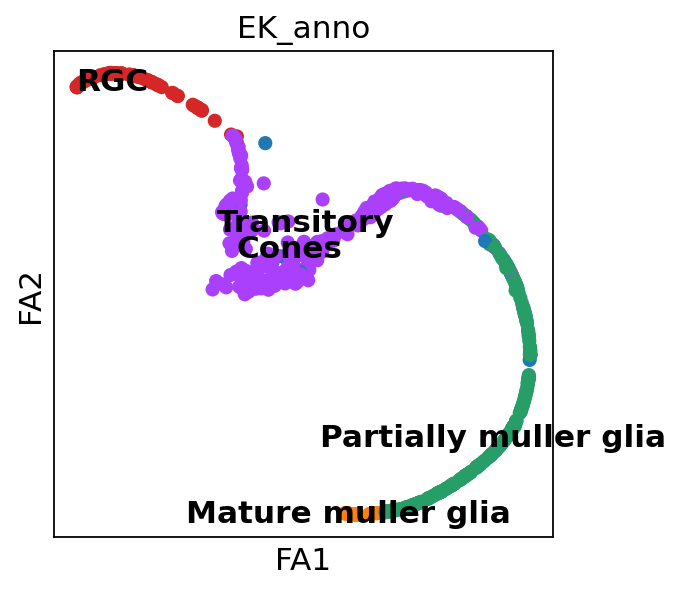

In [236]:
sc.set_figure_params()
sc.pl.draw_graph(early_rgc,color="EK_anno", layout = 'fa', legend_loc = 'on data')

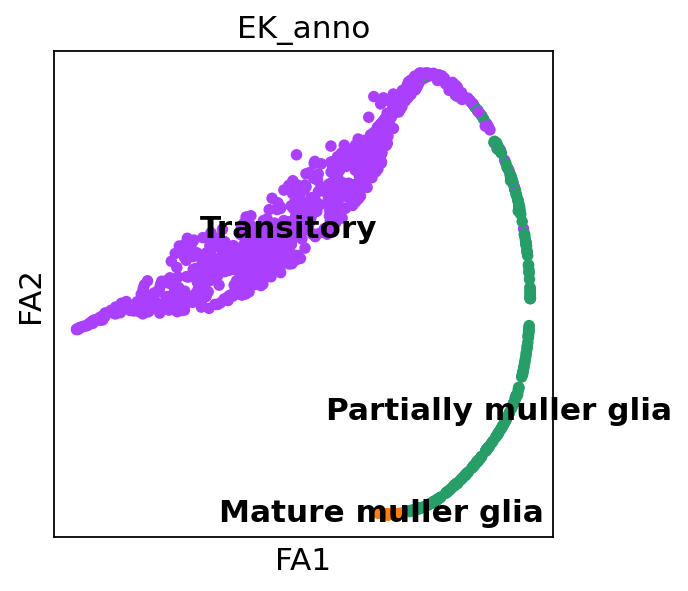

In [266]:
sc.set_figure_params()
sc.pl.draw_graph(early_mg,color="EK_anno", layout = 'fa', legend_loc = 'on data')

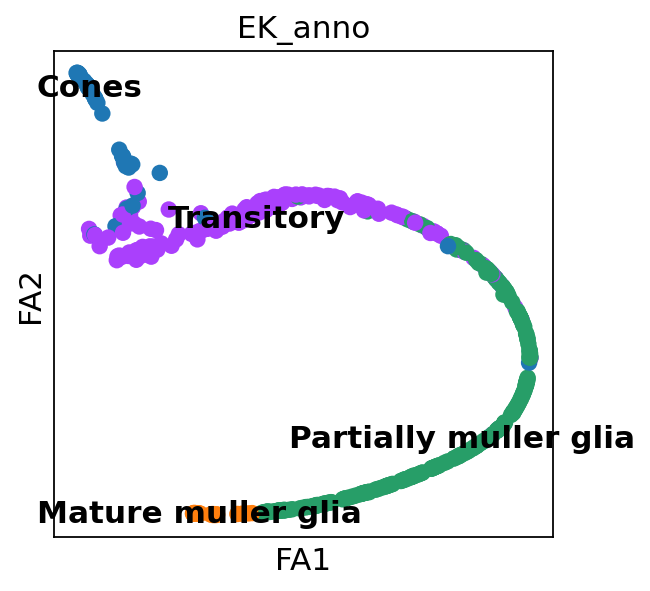

In [267]:
sc.set_figure_params()
sc.pl.draw_graph(early_cones,color="EK_anno", layout = 'fa', legend_loc = 'on data')

In [237]:
early_rgc = early_rgc[early_rgc.obs['EK_anno'].isin(['RGC','Transitory','Partially muller glia','Mature muller glia'])]

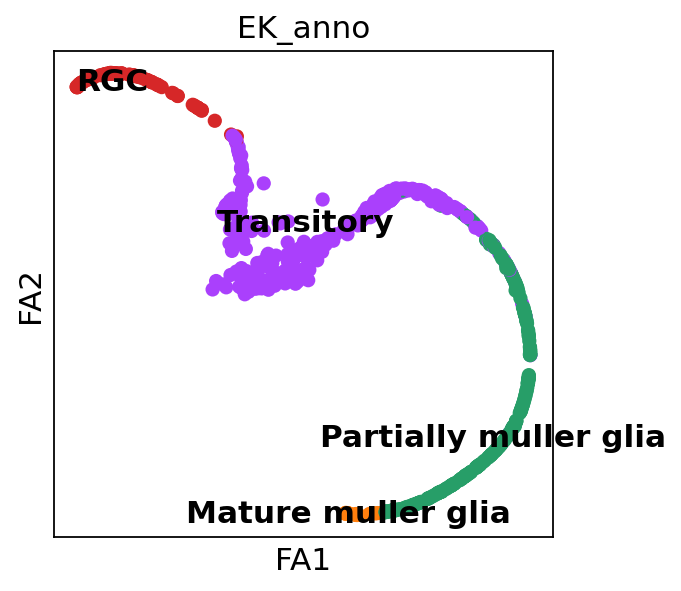

In [238]:
sc.set_figure_params()
sc.pl.draw_graph(early_rgc,color="EK_anno", layout = 'fa', legend_loc = 'on data')

In [198]:
import scFates as scf

In [199]:
early_mg.var

,features,n_counts,2->0_rss,p_val,A,fdr,st,signi,cluters
Rlbp1,Rlbp1,26.646727,-0.050128,3.137807e-184,4.095522,2.544762e-181,1,True,1
Clu,Clu,92.726753,-0.058109,1.826522e-252,3.354744,1.481309e-249,1,True,1
Hes1,Hes1,86.620300,-0.029917,1.366198e-112,3.511827,1.107986e-109,1,True,1
Vim,Vim,59.719753,-0.025231,2.532577e-183,4.072307,2.053920e-180,1,True,1
Ccn1,Ccn1,27.548258,-0.042642,1.256114e-97,3.516939,1.018708e-94,1,True,2
...,...,...,...,...,...,...,...,...,...
Uqcr11,Uqcr11,173.649353,-0.036794,1.874463e-33,1.168971,1.520190e-30,1,True,0
Ndrg2,Ndrg2,99.471489,0.024551,1.258448e-15,1.013744,1.020601e-12,1,True,0
Eef1a2,Eef1a2,203.719147,0.031119,4.243652e-38,1.130223,3.441602e-35,1,True,0
Cox5a,Cox5a,141.132629,-0.060856,2.236015e-33,1.026923,1.813408e-30,1,True,0


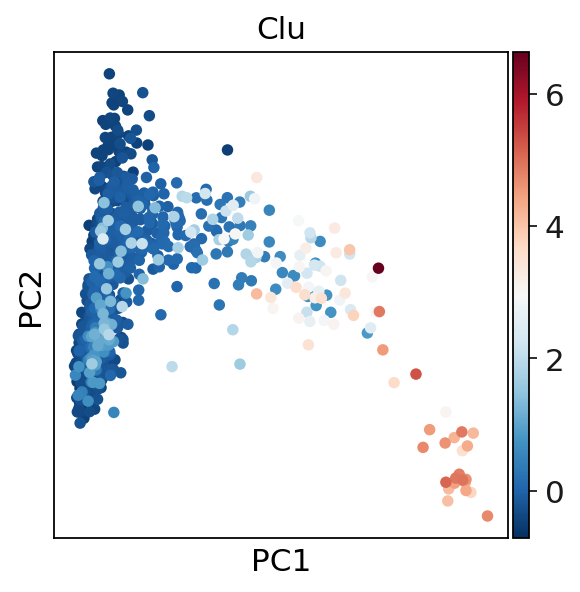

In [200]:
sc.pl.pca(early_mg,color="Clu",cmap="RdBu_r", use_raw = False)

In [241]:
early_rgc.var_names

Index(['Opn1sw', 'Rlbp1', 'Clu', 'Rho', 'Gng13', 'Hes1', 'Vim', 'Ccn1', 'Ccn2',
       'Gsg1',
       ...
       'Ndst1', 'Ffar4', 'Cycs', 'Lin7a', 'Ext1', 'Ica1', 'Smc6', 'Impg2',
       'Sh3gl3', 'Cend1'],
      dtype='object', length=811)

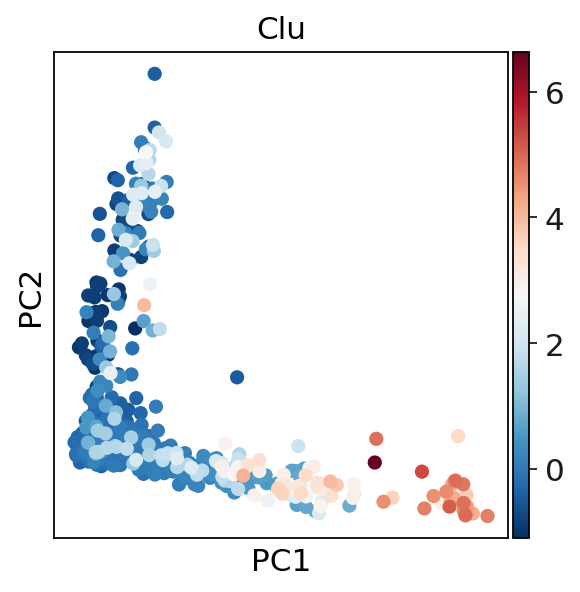

In [242]:
sc.pl.pca(early_rgc,color="Clu",cmap="RdBu_r", use_raw = False)

In [268]:
sc.pp.pca(early_mg)

computing PCA
    with n_comps=50
    finished (0:00:00)


In [269]:
sc.pp.pca(early_cones)

computing PCA
    with n_comps=50
    finished (0:00:00)


In [243]:
sc.pp.pca(early_rgc)

computing PCA
    with n_comps=50
    finished (0:00:00)


In [270]:
scf.tl.curve(early_mg,Nodes=30,use_rep="X_draw_graph_fa",ndims_rep=2,)

inferring a principal curve --> parameters used 
    30 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:00) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] hard assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.


In [271]:
scf.tl.curve(early_cones,Nodes=30,use_rep="X_draw_graph_fa",ndims_rep=2,)

inferring a principal curve --> parameters used 
    30 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:00) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] hard assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.


In [244]:
scf.tl.curve(early_rgc,Nodes=30,use_rep="X_draw_graph_fa",ndims_rep=2,)

inferring a principal curve --> parameters used 
    30 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:00) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] hard assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.


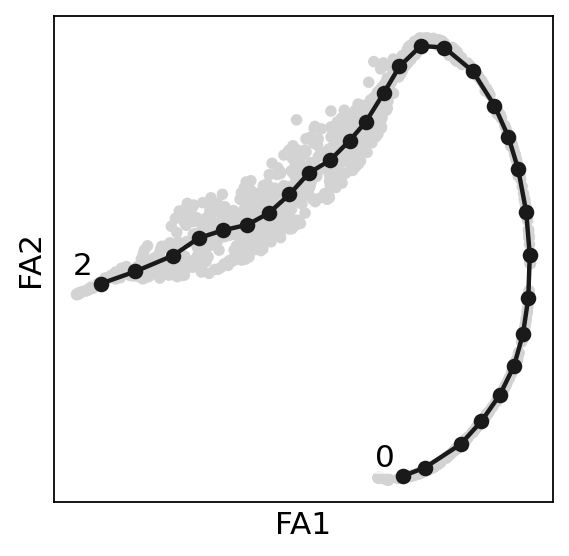

In [302]:
scf.pl.graph(early_mg,basis="draw_graph_fa", save = 'mg1.pdf')

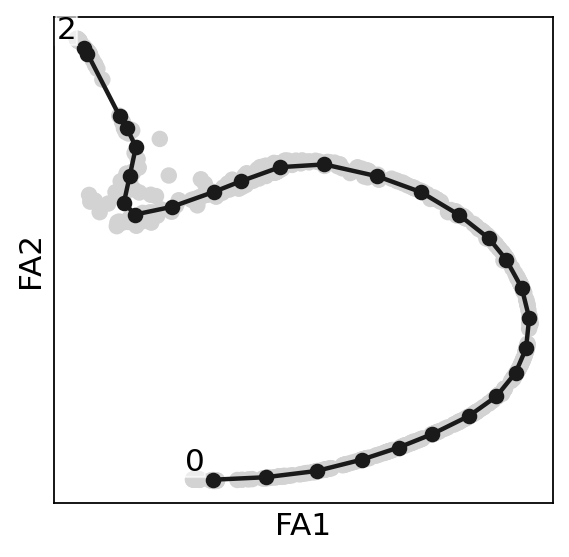

In [310]:
scf.pl.graph(early_cones,basis="draw_graph_fa", save = 'mg2.pdf')

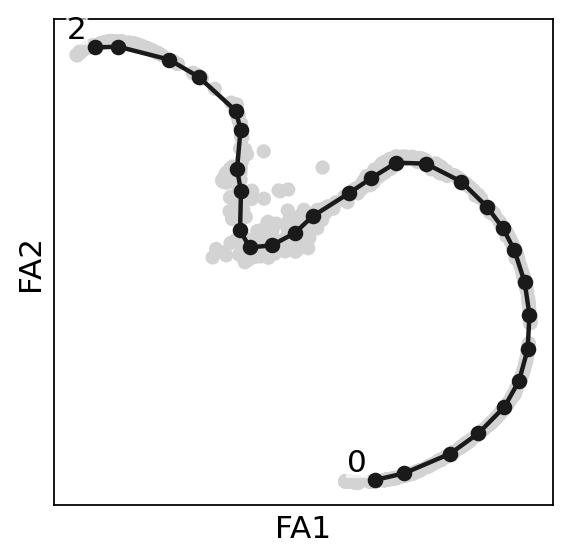

In [311]:
scf.pl.graph(early_rgc,basis="draw_graph_fa", save = 'mg3.pdf')

In [274]:
scf.tl.root(early_mg, root = 2)

node 2 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.


In [275]:
scf.tl.root(early_cones, root = 2)

node 2 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.


In [246]:
scf.tl.root(early_rgc, root = 2)

node 2 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.


In [276]:
scf.tl.pseudotime(early_mg,seed=42)

projecting cells onto the principal graph
    finished (0:00:00) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.


In [277]:
scf.tl.pseudotime(early_cones,seed=42)

projecting cells onto the principal graph
    finished (0:00:00) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.


In [247]:
scf.tl.pseudotime(early_rgc,seed=42)

projecting cells onto the principal graph
    finished (0:00:00) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.


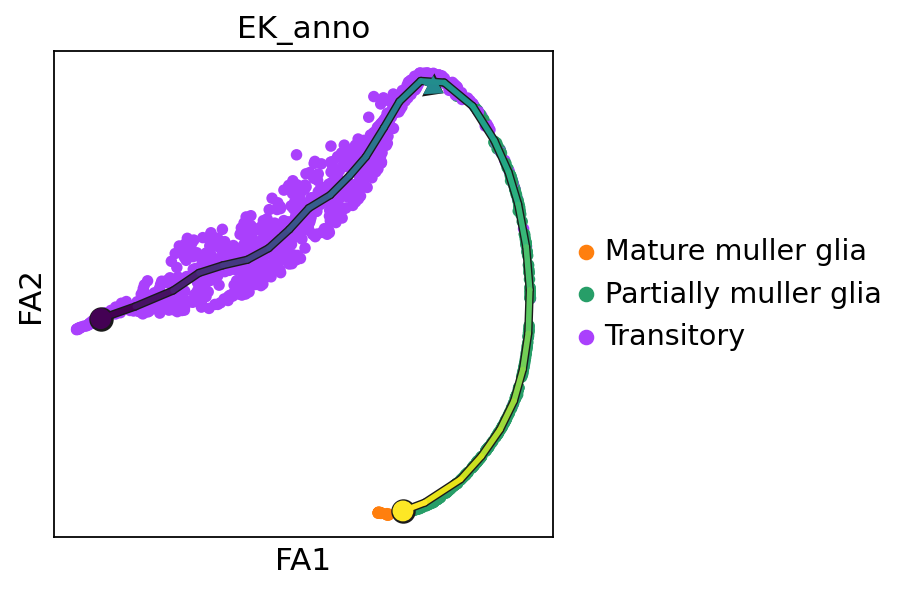

In [301]:
scf.pl.trajectory(early_mg,basis="draw_graph_fa",arrows=True,arrow_offset=3, color_cells = 'EK_anno', alpha = 1, scale_path = 0.5, save = 'mg.pdf')

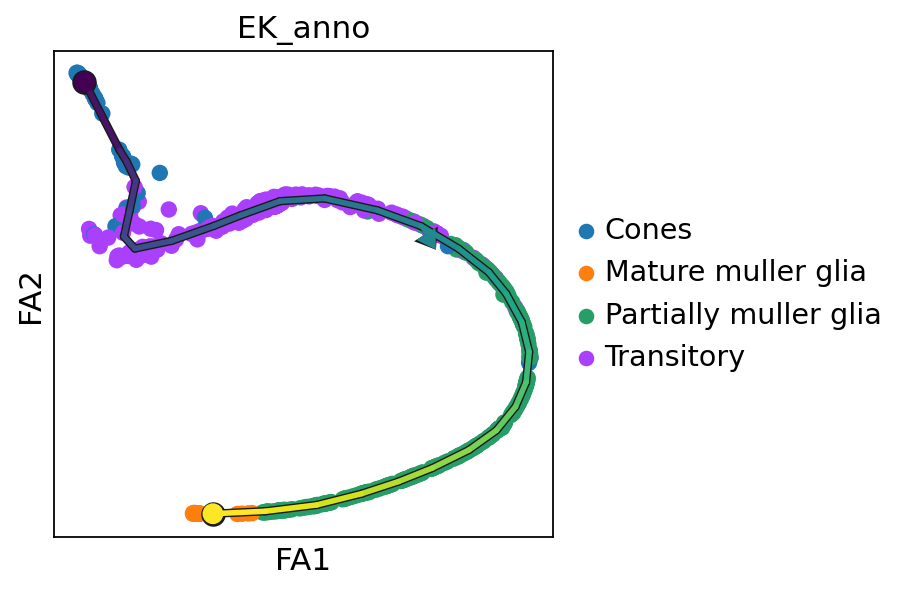

In [279]:
scf.pl.trajectory(early_cones,basis="draw_graph_fa",arrows=True,arrow_offset=3, color_cells = 'EK_anno', alpha = 1, scale_path = 0.5)

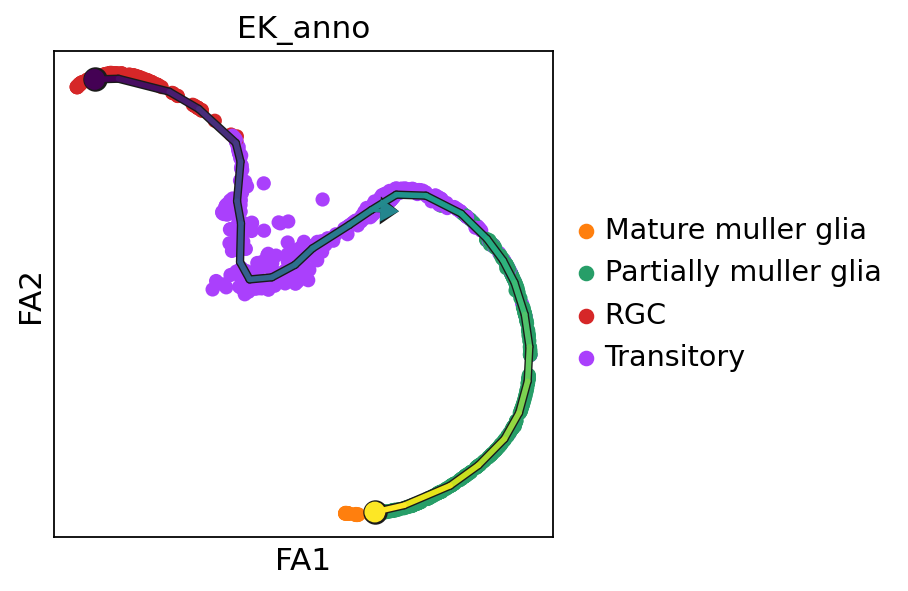

In [248]:
scf.pl.trajectory(early_rgc,basis="draw_graph_fa",arrows=True,arrow_offset=3, color_cells = 'EK_anno', alpha = 1, scale_path = 0.5)

In [207]:
early_mg.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.rb,S.Score,G2M.Score,Phase,percent.mt,RNA_snn_res.0.5,seurat_clusters,...,DF.classifications_0.25_0.06_182,DF.classifications_0.25_0.06_153,integrated_snn_res.0.5,EK_anno,leiden,t,seg,edge,milestones,2->0_lindev_sel
AAACCCAGTTACCTTT,early,4568.0,2200,4.203152,-0.077495,-0.056039,G1,2.057793,9,8,...,Singlet,Singlet,8,Mature muller glia,26,99115.791810,1,0|8,0,putative progenies
AAACGAACAAATGAGT,early,832.0,649,3.125000,-0.027044,0.007312,G2M,0.240385,6,3,...,Singlet,Singlet,3,Transitory,8,43354.574177,1,16|21,2,putative bridge
AAACGAACAGCGCTTG,early,2807.0,1633,11.506947,-0.007308,0.162735,G2M,2.529391,2,4,...,Singlet,Singlet,4,Partially muller glia,7,83521.951275,1,23|29,0,putative progenies
AAACGCTGTTGTTTGG,early,3126.0,1806,8.509277,-0.008596,0.075293,G2M,3.198976,4,4,...,Singlet,Singlet,4,Partially muller glia,15,88619.196913,1,19|26,0,putative progenies
AAAGGATAGGGATCAC,early,1820.0,1145,9.945055,0.090873,0.022933,S,7.527473,2,4,...,Singlet,Singlet,4,Partially muller glia,22,61499.107095,1,4|28,0,putative bridge
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTTCGCTTTAT,early,9661.0,3806,10.268088,0.049211,0.002371,S,5.858607,1,2,...,Singlet,Singlet,2,Transitory,2,30937.896330,1,3|9,2,putative bridge
TTTGGAGGTCCTCAGG,early,3166.0,1687,11.939356,-0.060528,0.077702,G2M,7.548958,2,4,...,Singlet,Singlet,4,Partially muller glia,21,71976.195758,1,6|11,0,putative progenies
TTTGGTTTCTCTCCGA,early,4794.0,2441,9.198999,-0.013216,-0.055211,G1,6.633292,0,2,...,Singlet,Singlet,2,Transitory,1,13345.466721,1,5|13,2,putative progenitors
TTTGTTGCAGTGCGCT,early,3848.0,1914,12.733888,0.054813,0.040794,S,8.030146,2,4,...,Singlet,Singlet,4,Partially muller glia,7,81153.321733,1,15|29,0,putative progenies


Estimation of deviation from linearity
    cells on the bridge: 100%|███████████████████████████████████████████████████████| 674/674 [00:06<00:00, 101.59it/s]


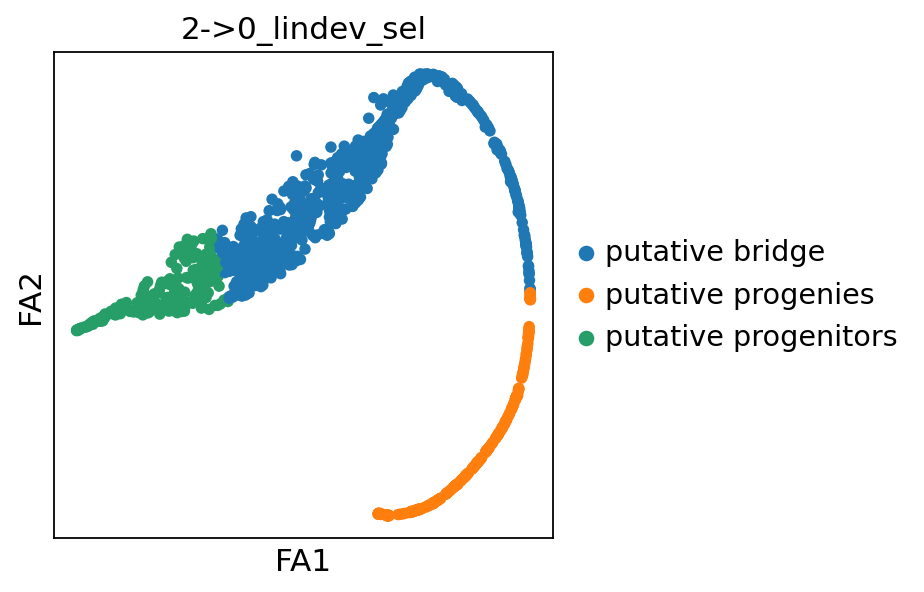

    finished (0:00:06) --> added 
    .var['2->0_rss'], pearson residuals of the linear fit.
    .obs['2->0_lindev_sel'], cell selections used for the test.


In [280]:
scf.tl.linearity_deviation(early_mg,start_milestone="2",end_milestone="0",n_jobs=20,plot=True,basis="draw_graph_fa")

Estimation of deviation from linearity
    cells on the bridge: 100%|███████████████████████████████████████████████████████| 329/329 [00:01<00:00, 297.04it/s]


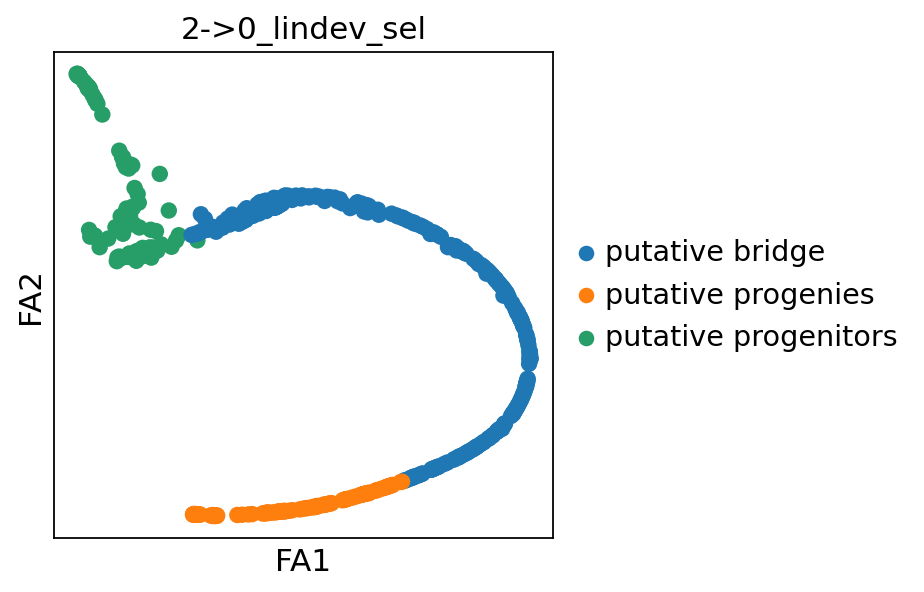

    finished (0:00:01) --> added 
    .var['2->0_rss'], pearson residuals of the linear fit.
    .obs['2->0_lindev_sel'], cell selections used for the test.


In [281]:
scf.tl.linearity_deviation(early_cones,start_milestone="2",end_milestone="0",n_jobs=20,plot=True,basis="draw_graph_fa")

Estimation of deviation from linearity
    cells on the bridge: 100%|████████████████████████████████████████████████████████| 438/438 [00:05<00:00, 81.01it/s]


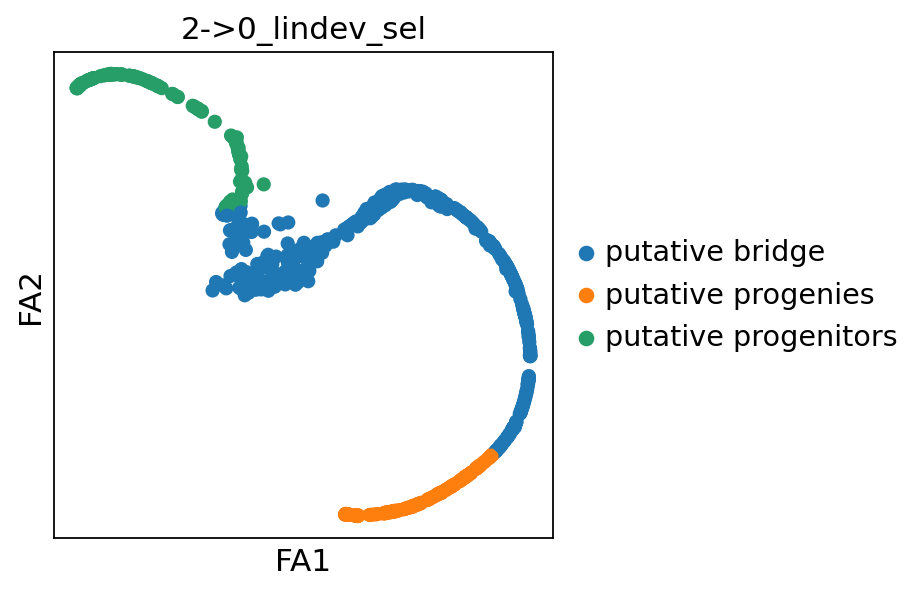

    finished (0:00:05) --> added 
    .var['2->0_rss'], pearson residuals of the linear fit.
    .obs['2->0_lindev_sel'], cell selections used for the test.


In [249]:
scf.tl.linearity_deviation(early_rgc,start_milestone="2",end_milestone="0",n_jobs=20,plot=True,basis="draw_graph_fa")

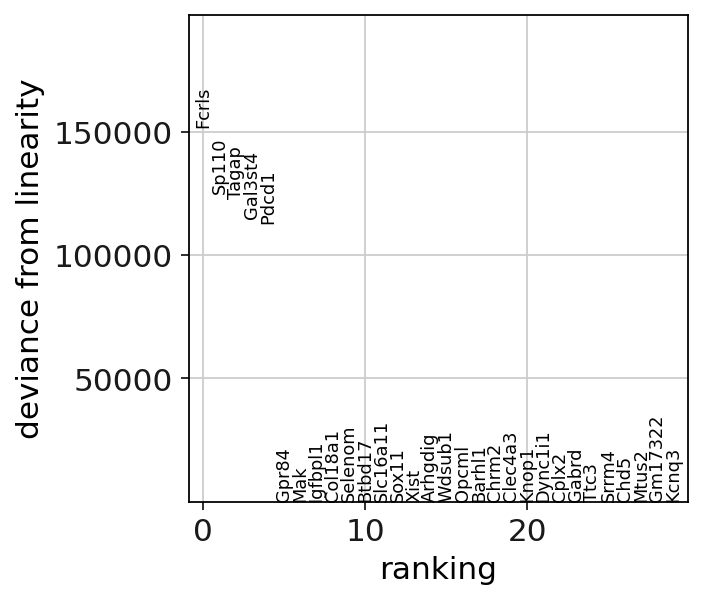

In [282]:
scf.pl.linearity_deviation(early_mg,start_milestone="2",end_milestone="0")

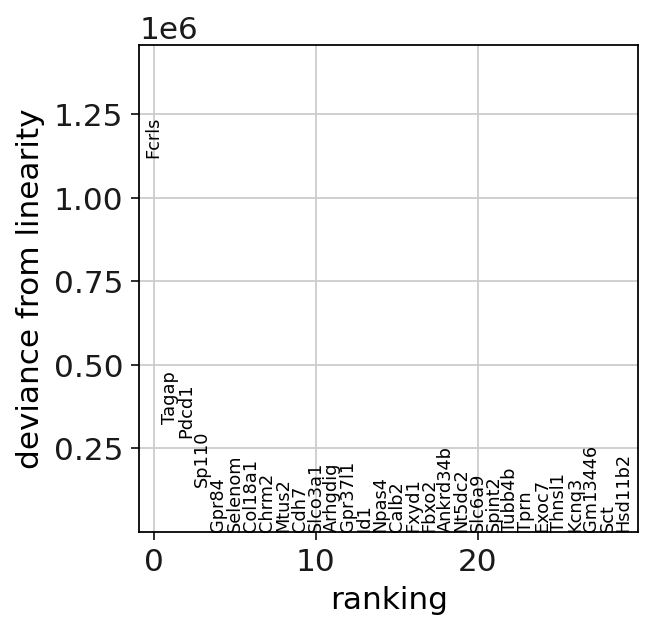

In [283]:
scf.pl.linearity_deviation(early_cones,start_milestone="2",end_milestone="0")

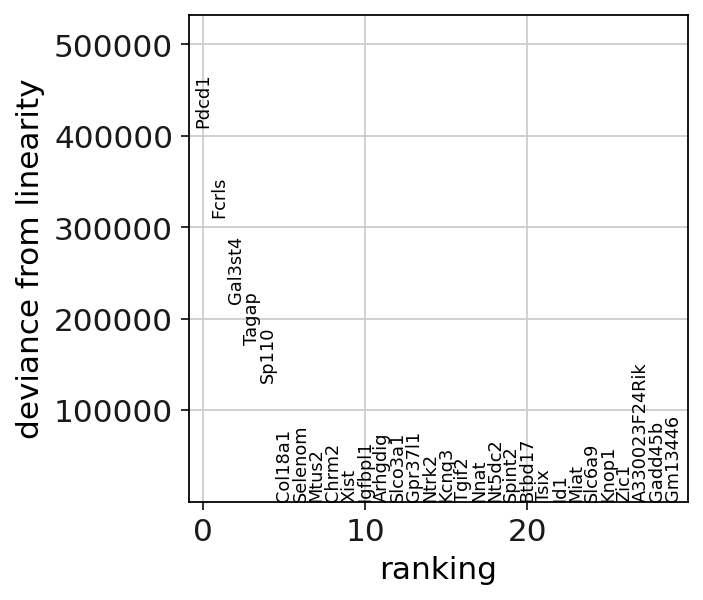

In [250]:
scf.pl.linearity_deviation(early_rgc,start_milestone="2",end_milestone="0")

In [210]:
import sys
sc.settings.verbosity = 3
sc.settings.logfile = sys.stdout

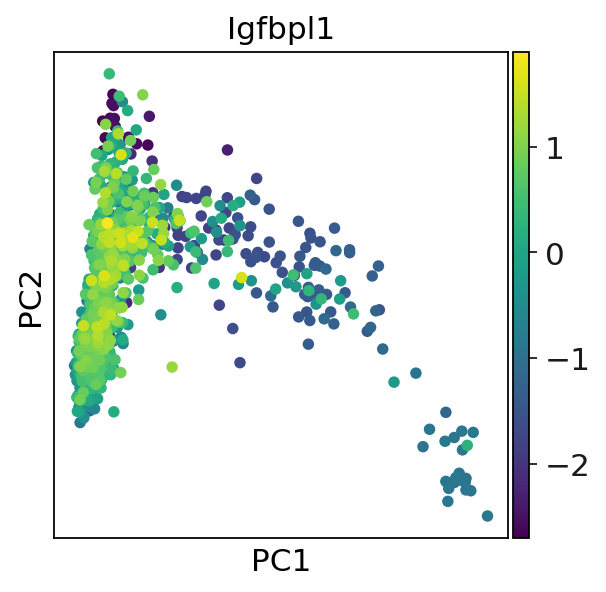

In [284]:
sc.pl.pca(early_mg,color=["Igfbpl1"], use_raw = False)

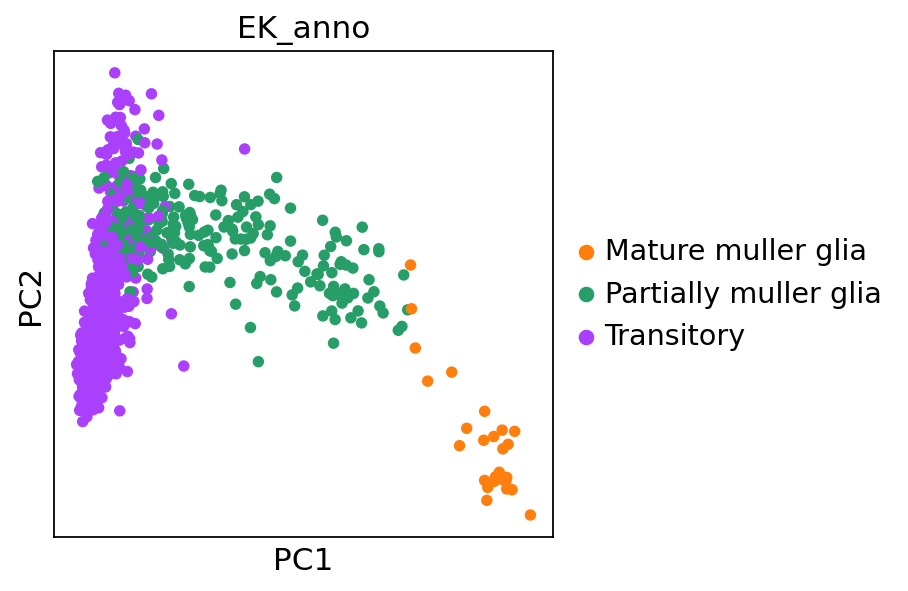

In [285]:
sc.pl.pca(early_mg,color=["EK_anno"], use_raw = False)

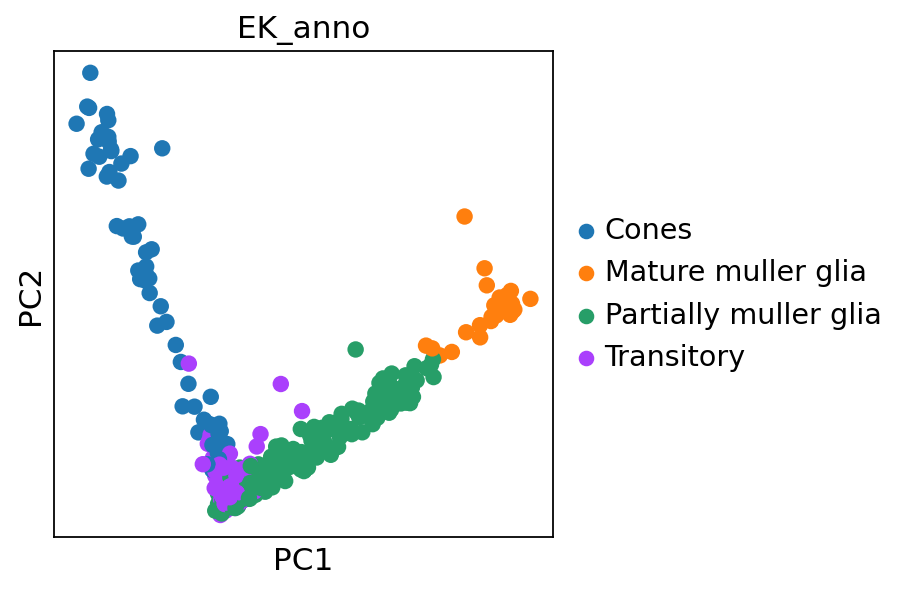

In [286]:
sc.pl.pca(early_cones,color=["EK_anno"], use_raw = False)

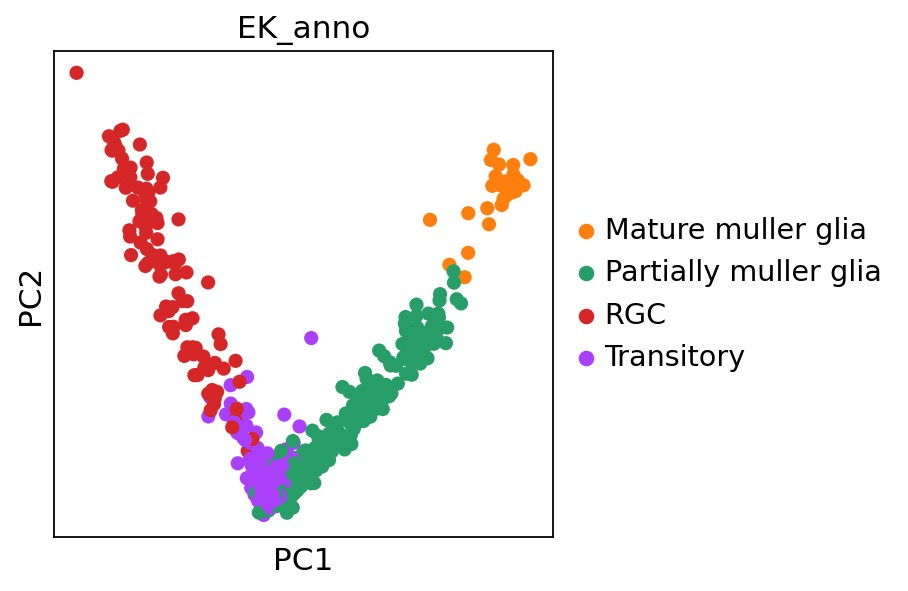

In [252]:
sc.pl.pca(early_rgc,color=["EK_anno"], use_raw = False)

In [287]:
scf.tl.test_association(early_mg,n_jobs=3)

test features for association with the trajectory
    single mapping : 100%|████████████████████████████████████████████████████████████| 811/811 [00:31<00:00, 25.96it/s]
    found 143 significant features (0:00:31) --> added
    .var['p_val'] values from statistical test.
    .var['fdr'] corrected values from multiple testing.
    .var['st'] proportion of mapping in which feature is significant.
    .var['A'] amplitue of change of tested feature.
    .var['signi'] feature is significantly changing along pseudotime.
    .uns['stat_assoc_list'] list of fitted features on the graph for all mappings.


In [288]:
scf.tl.test_association(early_cones,n_jobs=3)

test features for association with the trajectory
    single mapping : 100%|████████████████████████████████████████████████████████████| 811/811 [00:10<00:00, 78.69it/s]
    found 179 significant features (0:00:10) --> added
    .var['p_val'] values from statistical test.
    .var['fdr'] corrected values from multiple testing.
    .var['st'] proportion of mapping in which feature is significant.
    .var['A'] amplitue of change of tested feature.
    .var['signi'] feature is significantly changing along pseudotime.
    .uns['stat_assoc_list'] list of fitted features on the graph for all mappings.


In [253]:
scf.tl.test_association(early_rgc,n_jobs=3)

test features for association with the trajectory
    single mapping : 100%|████████████████████████████████████████████████████████████| 811/811 [00:22<00:00, 35.67it/s]
    found 194 significant features (0:00:22) --> added
    .var['p_val'] values from statistical test.
    .var['fdr'] corrected values from multiple testing.
    .var['st'] proportion of mapping in which feature is significant.
    .var['A'] amplitue of change of tested feature.
    .var['signi'] feature is significantly changing along pseudotime.
    .uns['stat_assoc_list'] list of fitted features on the graph for all mappings.


In [289]:
scf.tl.fit(early_mg,n_jobs=3)

fit features associated with the trajectory
    single mapping : 100%|████████████████████████████████████████████████████████████| 143/143 [00:07<00:00, 20.21it/s]
    finished (adata subsetted to keep only fitted features!) (0:00:07) --> added
    .layers['fitted'], fitted features on the trajectory for all mappings.
    .raw, unfiltered data.


In [290]:
scf.tl.fit(early_cones,n_jobs=3)

fit features associated with the trajectory
    single mapping : 100%|████████████████████████████████████████████████████████████| 179/179 [00:04<00:00, 43.47it/s]
    finished (adata subsetted to keep only fitted features!) (0:00:04) --> added
    .layers['fitted'], fitted features on the trajectory for all mappings.
    .raw, unfiltered data.


In [254]:
scf.tl.fit(early_rgc,n_jobs=3)

fit features associated with the trajectory
    single mapping : 100%|████████████████████████████████████████████████████████████| 194/194 [00:05<00:00, 35.96it/s]
    finished (adata subsetted to keep only fitted features!) (0:00:05) --> added
    .layers['fitted'], fitted features on the trajectory for all mappings.
    .raw, unfiltered data.


In [255]:
early_rgc.var

,features,n_counts,2->0_rss,p_val,A,fdr,st,signi
Rlbp1,Rlbp1,26.646727,-0.136264,9.004453e-133,4.251442,7.302611e-130,1,True
Clu,Clu,92.726753,-0.094603,2.163008e-143,3.451138,1.754199e-140,1,True
Gng13,Gng13,40.660114,0.012844,3.454442e-273,5.809842,2.801553e-270,1,True
Hes1,Hes1,86.620300,-0.096859,9.886246e-74,3.633829,8.017746e-71,1,True
Vim,Vim,59.719753,-0.050977,6.139439e-115,4.133482,4.979085e-112,1,True
...,...,...,...,...,...,...,...,...
Opcml,Opcml,167.664246,0.107666,1.394830e-29,1.236305,1.131207e-26,1,True
Gnao1,Gnao1,96.444504,-0.171518,6.818937e-19,1.102144,5.530158e-16,1,True
Nrn1l,Nrn1l,64.233681,-0.019289,3.902546e-32,2.395176,3.164965e-29,1,True
Rcn2,Rcn2,35.508636,-0.097841,2.397551e-10,1.018461,1.944413e-07,1,True


In [215]:
early_mg.var

,features,n_counts,2->0_rss,p_val,A,fdr,st,signi,cluters
Rlbp1,Rlbp1,26.646727,-0.020827,2.487653e-183,4.097667,3.557343e-181,1,True,1
Clu,Clu,92.726753,-0.036766,2.272671e-251,3.357380,3.249920e-249,1,True,1
Hes1,Hes1,86.620300,0.001202,5.059163e-112,3.514843,7.234603e-110,1,True,1
Vim,Vim,59.719753,0.011125,2.069305e-182,4.070905,2.959107e-180,1,True,1
Ccn1,Ccn1,27.548258,-0.002169,9.944389e-98,3.520576,1.422048e-95,1,True,2
...,...,...,...,...,...,...,...,...,...
Uqcr11,Uqcr11,173.649353,-0.000236,1.926242e-33,1.166070,2.754526e-31,1,True,0
Ndrg2,Ndrg2,99.471489,0.077592,2.055770e-15,1.009823,2.939751e-13,1,True,0
Eef1a2,Eef1a2,203.719147,0.069339,3.877737e-38,1.129329,5.545165e-36,1,True,0
Cox5a,Cox5a,141.132629,-0.016937,2.994668e-33,1.027578,4.282376e-31,1,True,0


In [216]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
sc.settings.logfile = sys.stdout
## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline

sc.set_figure_params()
scf.set_figure_pubready()

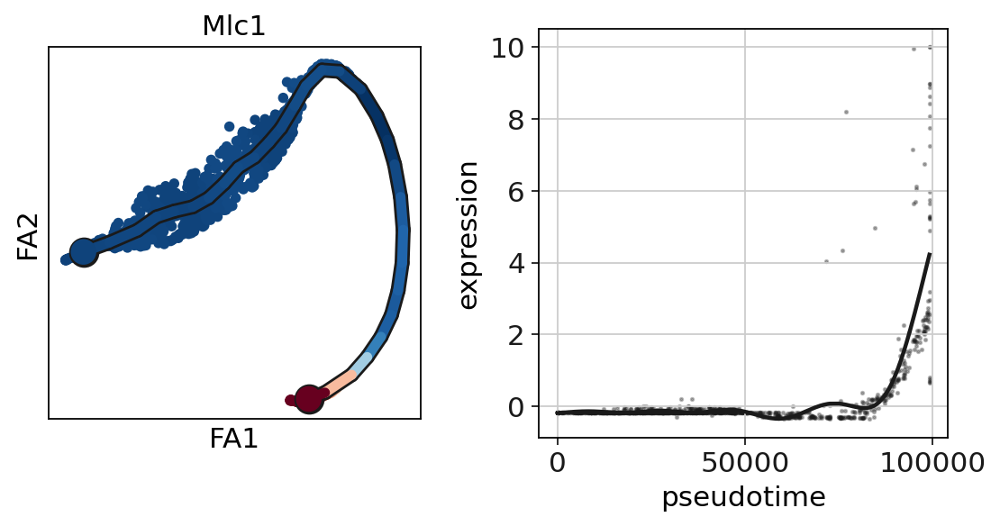

In [291]:
scf.pl.single_trend(early_mg,"Mlc1",basis="draw_graph_fa",color_exp="k", use_raw = False)

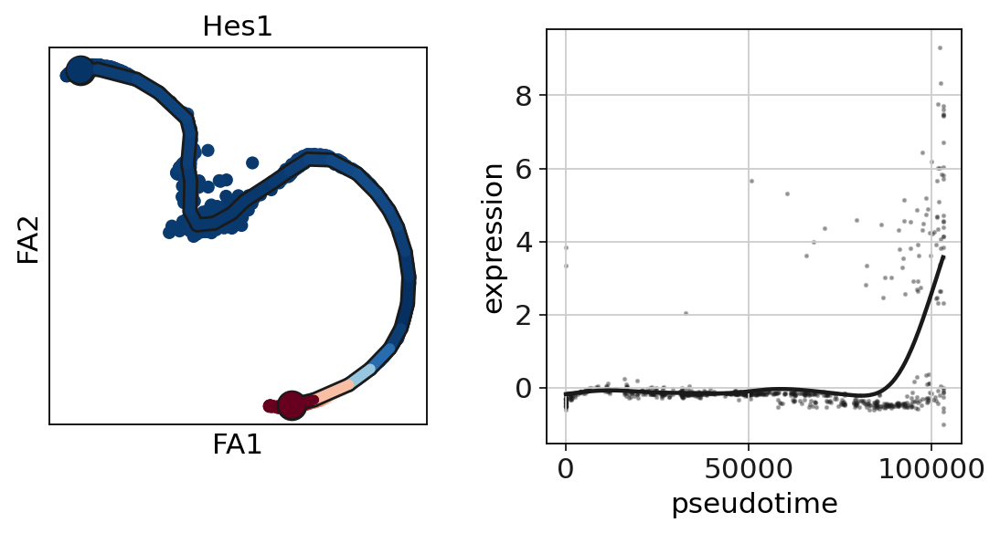

In [256]:
scf.pl.single_trend(early_rgc,"Hes1",basis="draw_graph_fa",color_exp="k", use_raw = False)

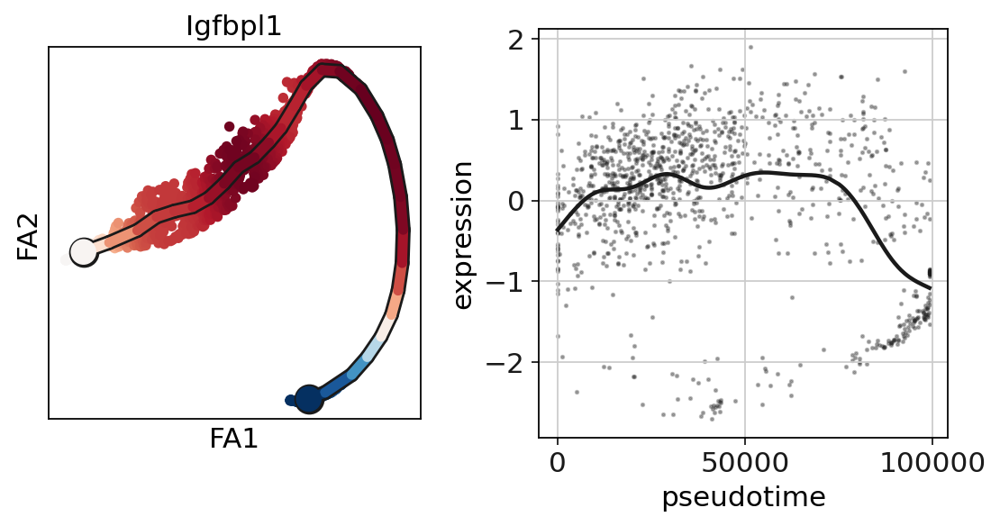

In [292]:
scf.pl.single_trend(early_mg,"Igfbpl1",basis="draw_graph_fa",color_exp="k", use_raw = False)

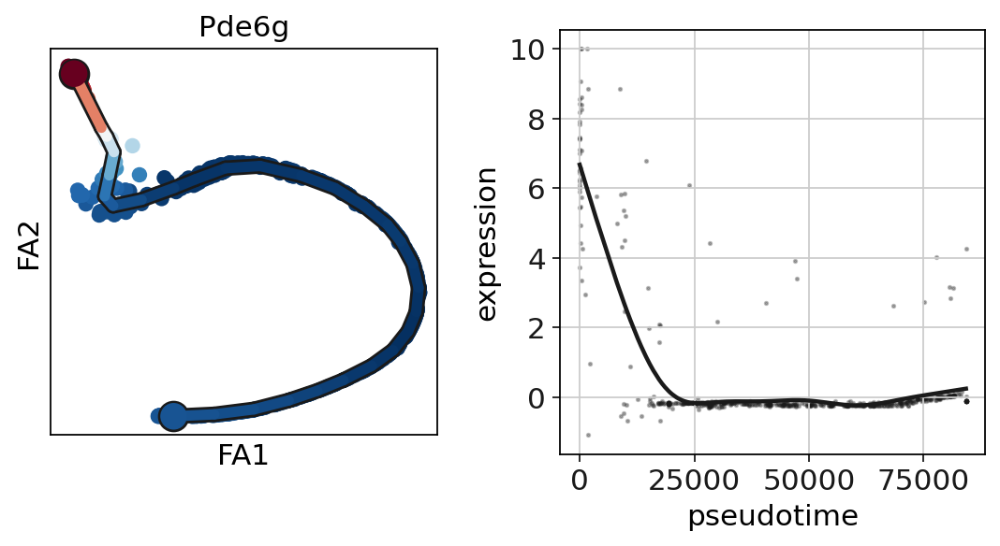

In [315]:
scf.pl.single_trend(early_cones,"Pde6g",basis="draw_graph_fa",color_exp="k", use_raw = False, save = 'pde.pdf')

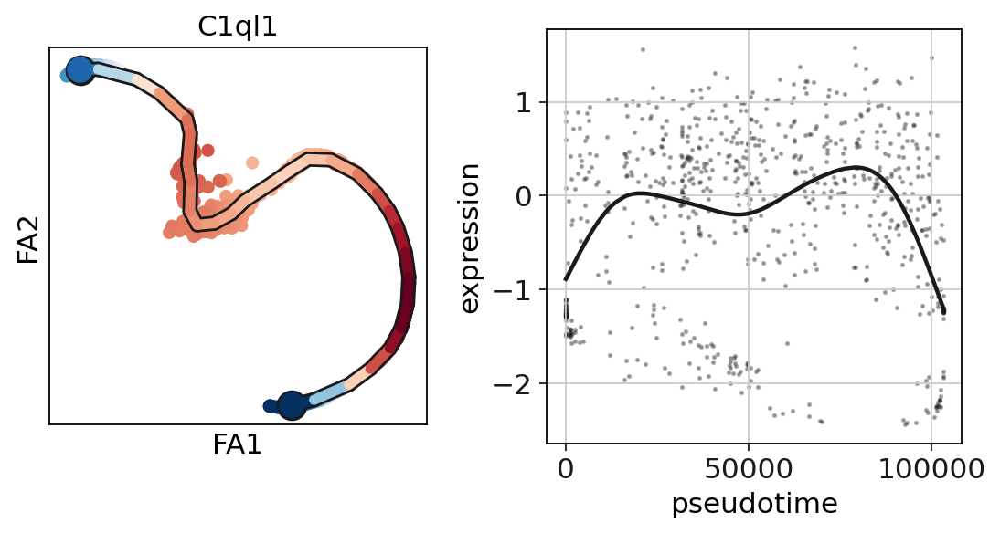

In [316]:
scf.pl.single_trend(early_rgc,"C1ql1",basis="draw_graph_fa",color_exp="k", use_raw = False, save = 'c1q.pdf')

In [294]:
scf.tl.cluster(early_mg, n_neighbors = 20, metric="correlation")

Clustering features using fitted layer
computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
    finished (0:00:00) --> added 
    .var['cluters'] identified modules.


In [295]:
scf.tl.cluster(early_cones, n_neighbors = 20, metric="correlation")

Clustering features using fitted layer
computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
    finished (0:00:00) --> added 
    .var['cluters'] identified modules.


In [257]:
scf.tl.cluster(early_rgc, n_neighbors = 20, metric="correlation")

Clustering features using fitted layer
computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
    finished (0:00:00) --> added 
    .var['cluters'] identified modules.


In [296]:
early_mg.var.cluters.unique()

['1', '2', '0', '3']
Categories (4, object): ['1', '2', '0', '3']

In [297]:
early_cones.var.cluters.unique()

['1', '0', '3', '4', '2', '5']
Categories (6, object): ['1', '0', '3', '4', '2', '5']

In [258]:
early_rgc.var.cluters.unique()

['1', '0', '2', '3']
Categories (4, object): ['1', '0', '2', '3']

In [308]:
'mgmg' + c + '.pdf'

'mgmg3.pdf'

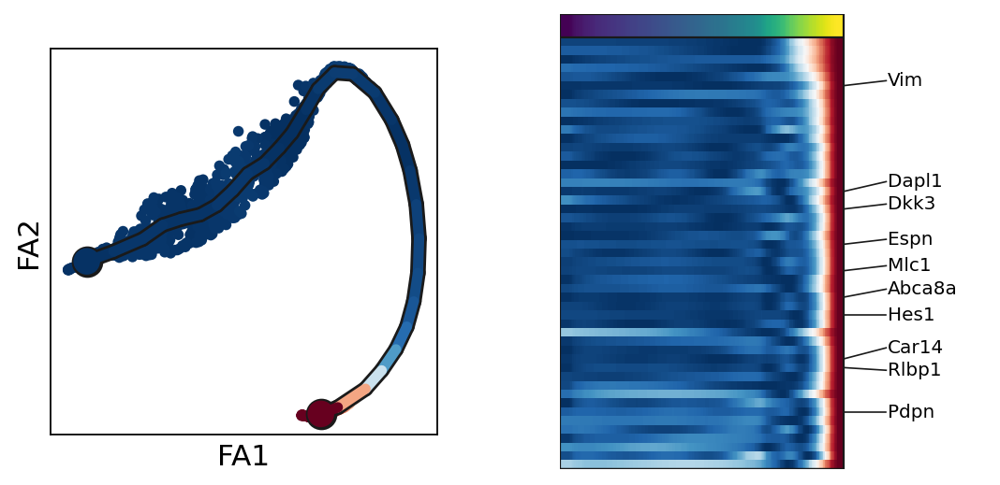

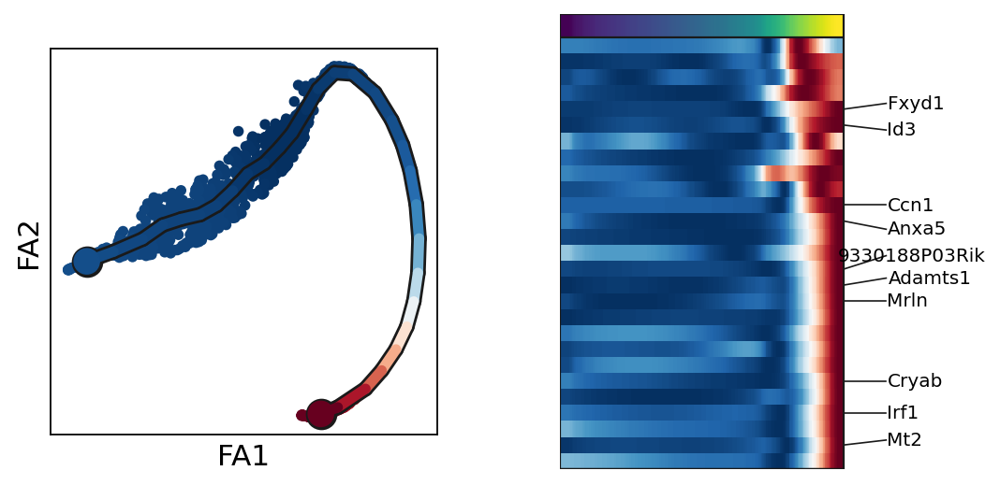

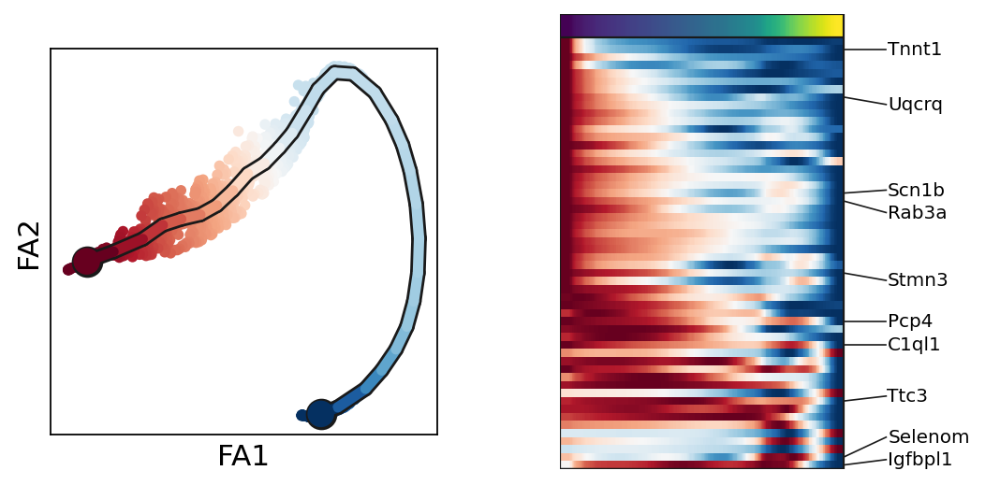

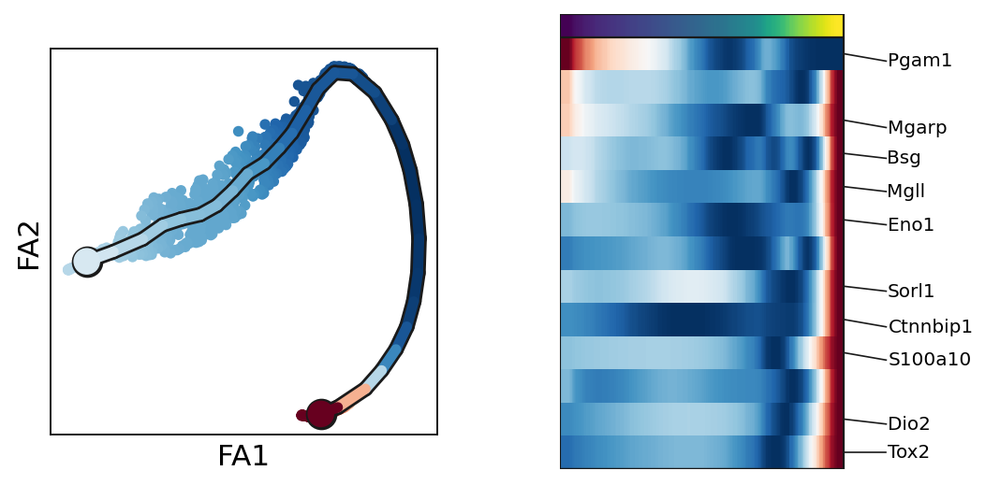

In [309]:
for c in early_mg.var["cluters"].unique():
    filename = 'mgmg' + c + '.pdf'
    scf.pl.trends(early_mg,features=early_mg.var_names[early_mg.var.cluters==c],basis="draw_graph_fa", save = filename)

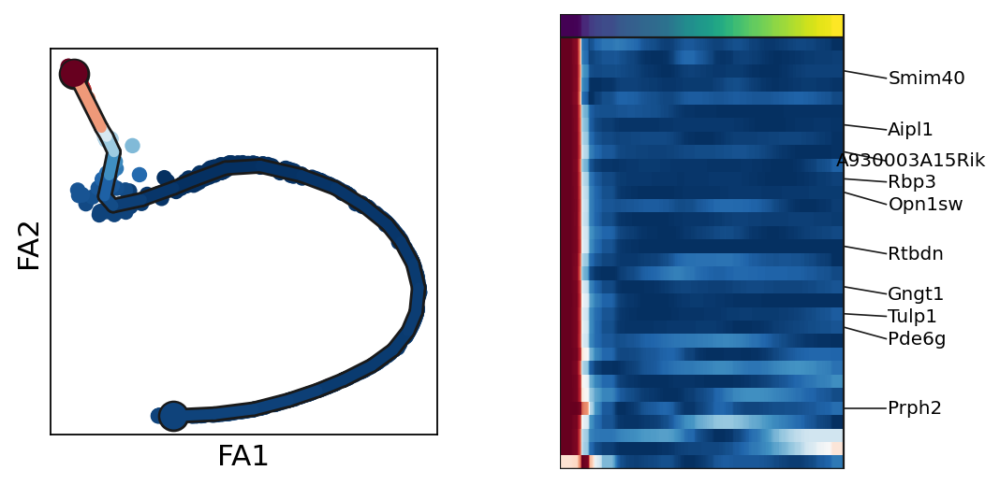

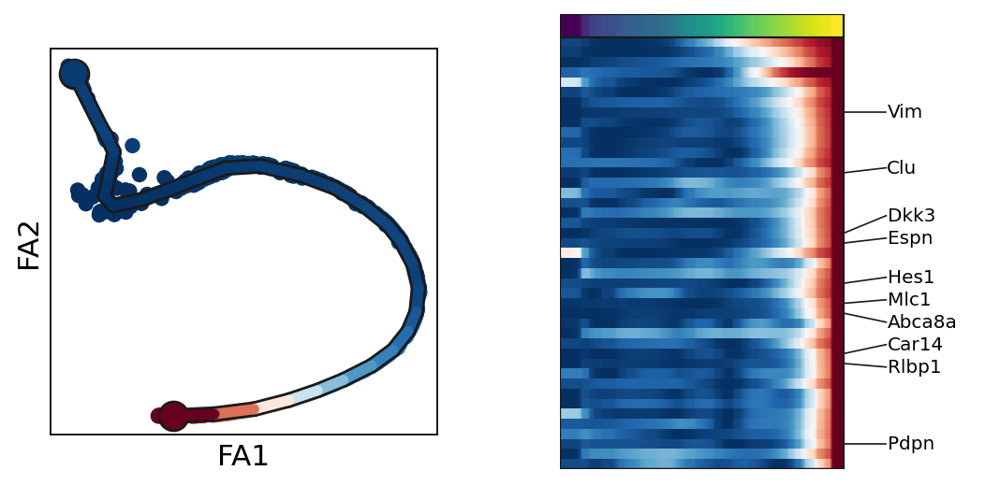

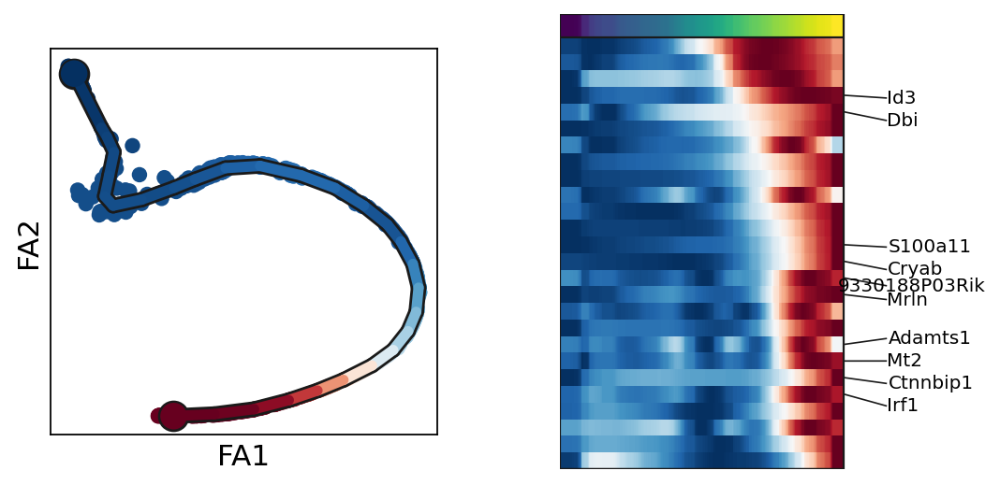

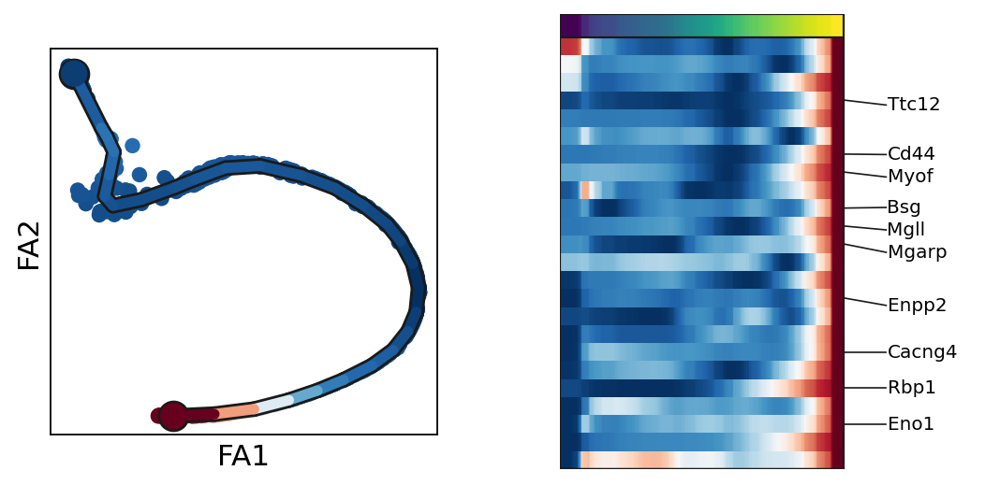

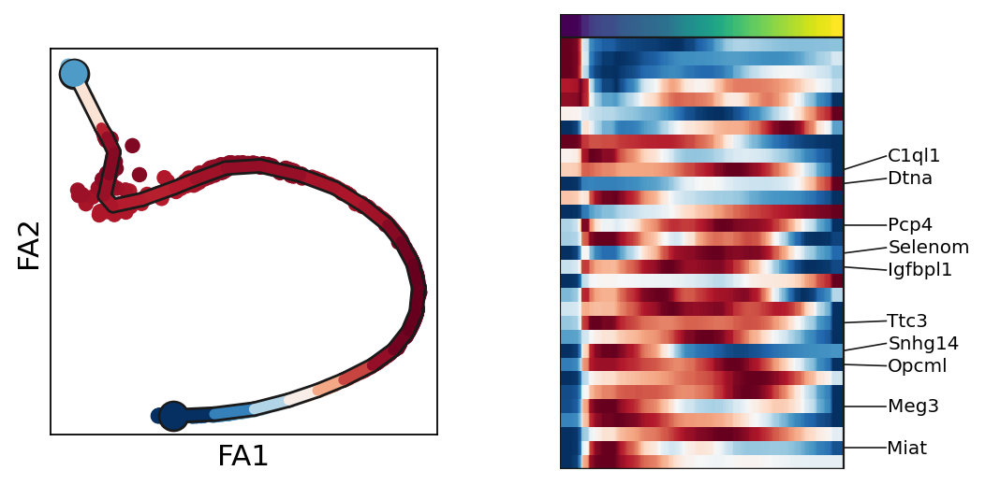

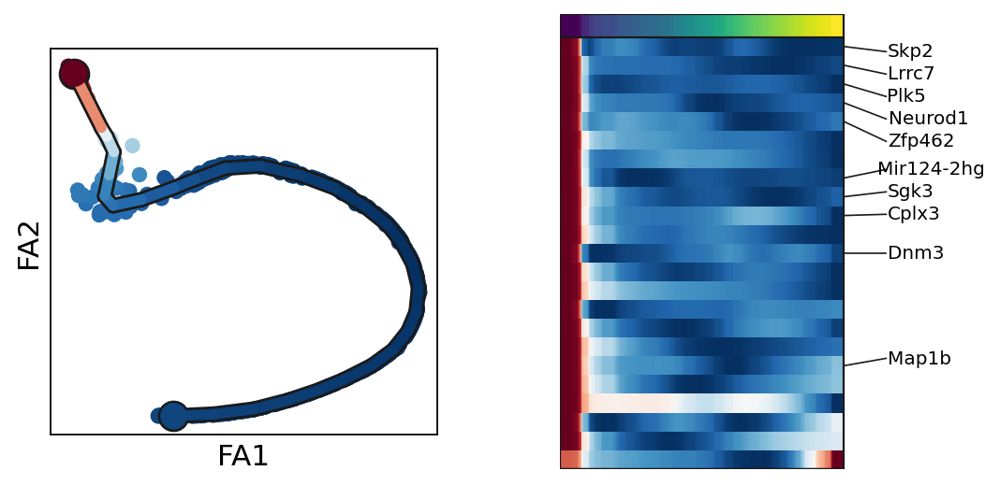

In [312]:
for c in early_cones.var["cluters"].unique():
    filename = 'mgc' + c + '.pdf'
    scf.pl.trends(early_cones,features=early_cones.var_names[early_cones.var.cluters==c],basis="draw_graph_fa", save = filename)

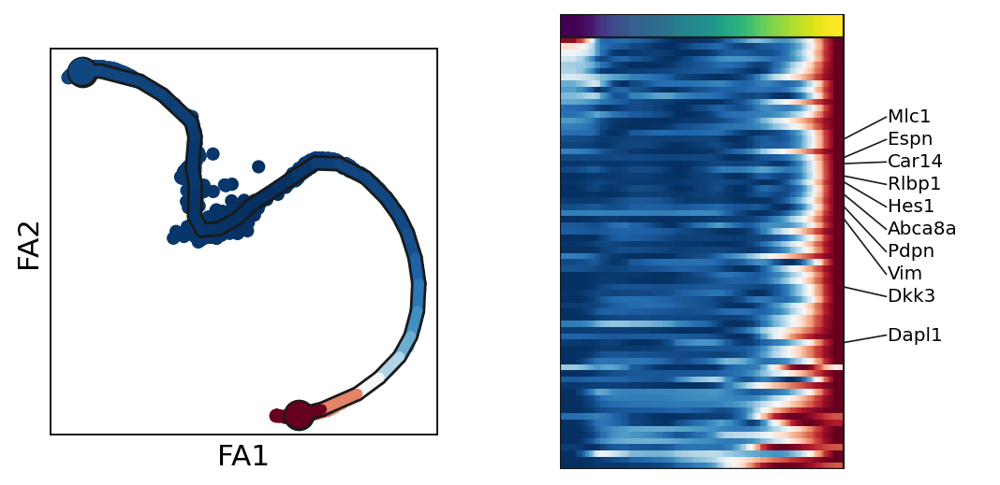

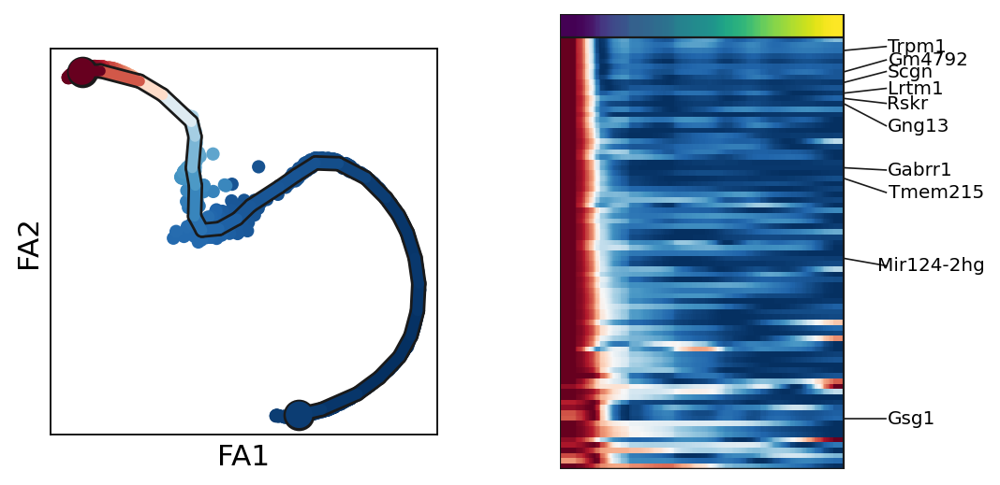

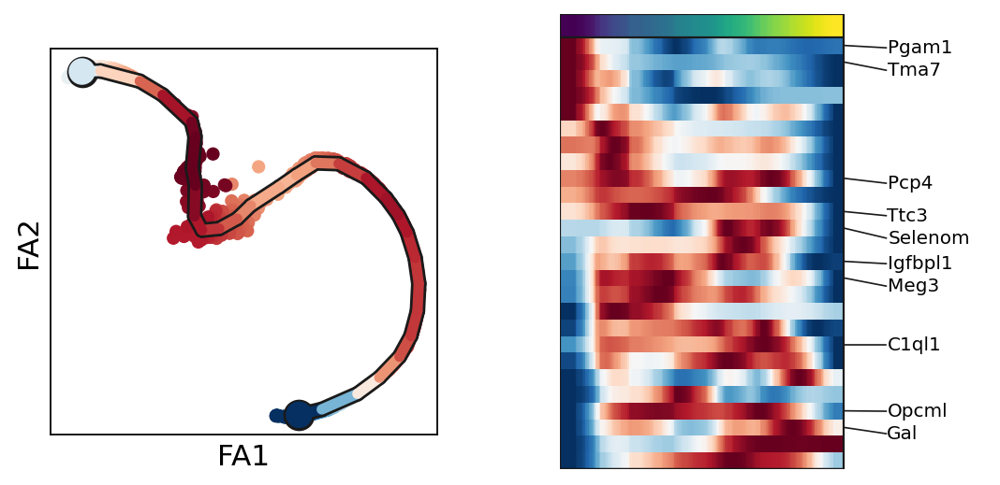

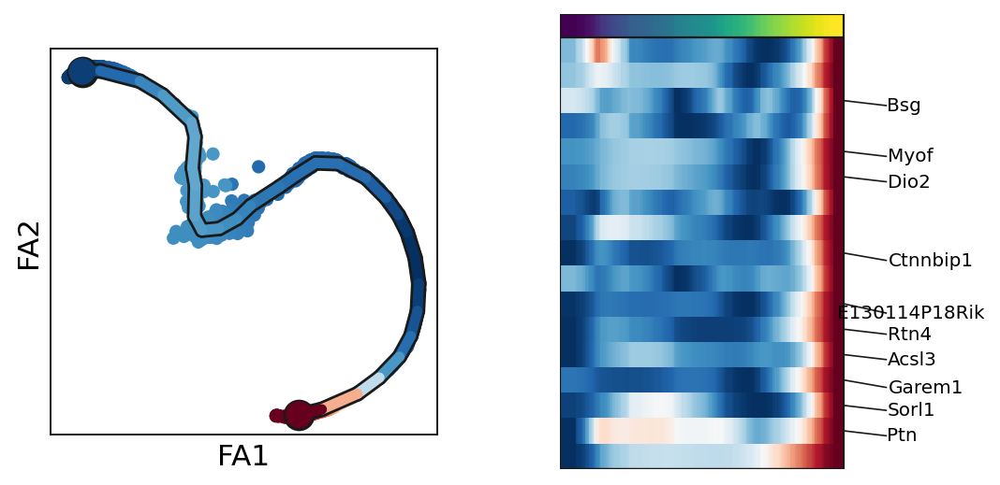

In [313]:
for c in early_rgc.var["cluters"].unique():
    filename = 'mgr' + c + '.pdf'
    scf.pl.trends(early_rgc,features=early_rgc.var_names[early_rgc.var.cluters==c],basis="draw_graph_fa", save = filename)